In [1]:
#IMPORT LIBRARIES
import sqlite3
import os
import pandas as pd
import numpy as np
from numpy import linalg as LA
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans, AgglomerativeClustering, MeanShift, DBSCAN, estimate_bandwidth
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, LabelEncoder
from itertools import product
from math import ceil
from scipy.cluster.hierarchy import dendrogram
%matplotlib inline
#from pandas_profiling import ProfileReport 
%config InlineBackend.figure_format = 'retina' 
from scipy.stats import iqr as IQR
from collections import Counter
import scipy.stats as stat
from sklearn.neighbors import NearestNeighbors

# Seeting seaborn style
sns.set()

In [2]:
#import file
df = pd.read_csv('donors.csv')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

C:\Users\debor\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (9,412) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df.head()

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [4]:
#DROP COLUMNS (NUMBER OF DONORS AND THE COLUMNS WITH ANOTHER INDEX)
df = df.drop(columns=['Unnamed: 0','CONTROLN'])

In [5]:
#FUNCTION TO SHOW MISSING VALUES AND THEIR PERCENTAGES
def missing_data(df):
    l = []
    for col in df.columns:
        missing = df[col].isnull().sum(axis=0)
        percentage = missing/df.shape[0]
        l.append([col,missing,percentage*100])
        df_missing = pd.DataFrame(l, columns = ['Feature','missing','percentage'])
        df_missing = df_missing.sort_values('missing',axis=0, ascending = False)    
    return df_missing

In [6]:
df_missing = missing_data(df)
df_missing = df_missing[df_missing['missing']>0]

In [7]:
df_missing

,Feature,missing,percentage
411,RDATE_5,95403,99.990567
433,RAMNT_5,95403,99.990567
431,RAMNT_3,95170,99.746363
409,RDATE_3,95170,99.746363
432,RAMNT_4,95131,99.705488
410,RDATE_4,95131,99.705488
412,RDATE_6,94636,99.186685
434,RAMNT_6,94636,99.186685
421,RDATE_15,88150,92.388798
443,RAMNT_15,88150,92.388798


In [8]:
df1 = df.copy()

In [9]:
#remove columns 
df1 = df1.drop(columns=['PVASTATE','GEOCODE','TCODE','OSOURCE','CHILD03','CHILD07','CHILD12','CHILD18','NUMCHLD'])

In [10]:
#correct negative ZIP CODE
df1['ZIP'] = df1.ZIP.str.replace('-','')

In [11]:
#REPLACE EMPTY VALUES
flag_var =['NOEXCH','RECINHSE','RECP3','RECPGVG','RECSWEEP','PEPSTRFL','MAJOR', 'DATASRCE','LIFESRC']
df1[flag_var] = df1[flag_var].replace('X',1)
df1[flag_var] = df1[flag_var].replace(" ",0)

In [12]:
#REPLACE EMPTY VALUES
df1['MAILCODE'] = df1['MAILCODE'].replace('B',0)
df1['MAILCODE'] = df1['MAILCODE'].replace(" ",1)

In [13]:
#REPLACE STRANGE VALUES BY THE MODE
df1['GENDER'] = df1.GENDER.replace(" ",'F')
df1['GENDER'] = df1.GENDER.str.replace('U','F')
df1['GENDER'] = df1.GENDER.str.replace('J','F')
df1['GENDER'] = df1.GENDER.str.replace('C','F')
df1['GENDER'] = df1.GENDER.str.replace('A','F')

In [14]:
#TRANSFORM THE VARIABLE DOB IN AGE
df1.DOB.replace(" ", np.nan, inplace=True)
df1.DOB = df1.DOB.fillna(df1.DOB.mode().loc[0])
df1.DOB =df1.DOB.map(lambda x: int(x.split("-")[0]))
df1['AGE'] = df1['DOB']
df1['AGE'] = pd.DatetimeIndex(df1['ADATE_2']).year - df1['DOB']
df1 = df1.drop(columns=['DOB'])

In [15]:
#TRANSFORM THE VARIABLE ODATEDW IN TIME_AS_DONOR
df1.ODATEDW =df1.ODATEDW.map(lambda x: int(x.split("-")[0]))
df1['TIME_AS_DONOR'] = df1['ODATEDW']
df1['TIME_AS_DONOR'] = pd.DatetimeIndex(df1['ADATE_2']).year - df1['ODATEDW']
df1 = df1.drop(columns=['ODATEDW'])

In [16]:
#TRANSFORM THE VARIABLE DOMAIN IN SES AND URBAN
df1.DOMAIN.replace(" ", np.nan, inplace=True)
df1.DOMAIN = df1.DOMAIN.fillna(df1.DOMAIN.mode().loc[0])
df1['URBAN'] = df1['DOMAIN'].apply(lambda x: x[0])
df1['SES'] = df1['DOMAIN'].apply(lambda x: int(x[1]))
df1 = df1.drop(columns=['DOMAIN'])

In [17]:
#REPLACE EMPTY VALUES FOR MISSING VALUES
df1.HOMEOWNR.replace(" ", np.nan, inplace=True)
df1.GEOCODE2.replace(" ", np.nan, inplace=True)
df1.RFA_3.replace(" ", np.nan, inplace=True)

In [18]:
preferences = ['MBCRAFT','MBGARDEN','MBBOOKS','MBCOLECT','MAGFAML','MAGFEM','MAGMALE','PUBGARDN','PUBCULIN',
'PUBHLTH','PUBDOITY','PUBNEWFN','PUBPHOTO','PUBOPP','COLLECT1','VETERANS','BIBLE','CATLG','HOMEE','PETS','CDPLAY','STEREO',
'PCOWNERS','PHOTO','CRAFTS','FISHER','GARDENIN','BOATS','WALKER','KIDSTUFF','CARDS','PLATES']

In [19]:
#REPLACE EMPTY VALUES AND MISSING VALUES
df1[preferences] = df1[preferences].replace('Y',1)
df1[preferences] = df1[preferences].replace(" ",0)
df1[preferences] = df1[preferences].fillna(0)

In [20]:
#REPLACE EMPTY VALUES
df1['SOLP3'] = df1['SOLP3'].replace(' ', '15')
df1['SOLIH'] = df1['SOLIH'].replace(' ', '15')

In [21]:
#TRANSFORM WEALTH1 AND WEALTH2 IN WEALTH3 
df1['WEALTH1'] = df1['WEALTH1'].fillna(-1)
df1['WEALTH2'] = df1['WEALTH2'].fillna(-2)
df1['WEALTH1'] = df1['WEALTH1'].astype(int)
df1['WEALTH2'] = df1['WEALTH2'].astype(int)
lista = []

for i in range(len(df1['WEALTH1'])):
#for i in range(10):
    if df1['WEALTH1'][i] == df1['WEALTH2'][i]:
        lista.append(df1['WEALTH2'][i])
    if df1['WEALTH1'][i] == -1:
        if df1['WEALTH2'][i] == -2:
            lista.append('BLANK')
        if df1['WEALTH2'][i] >=0:
            lista.append(df1['WEALTH2'][i])
    elif df1['WEALTH1'][i]>=0:
        if df1['WEALTH2'][i] == -2:
            lista.append(df1['WEALTH1'][i])
        if df1['WEALTH2'][i]>=0:
            if df1['WEALTH2'][i] != df1['WEALTH1'][i]:
                lista.append('DIFF')
    else:
        lista.append('XXXX')

df1['WEALTH3']=(lista)

In [22]:
df1.WEALTH3.replace("DIFF", np.nan, inplace=True)
df1.WEALTH3.replace("BLANK", np.nan, inplace=True)
df1 = df1.drop(columns=['WEALTH2','WEALTH1'])


In [23]:
#REPLACE MISSING VALUES BY THE MODE
df1.HOMEOWNR = df1.HOMEOWNR.fillna(df1.HOMEOWNR.mode().loc[0])
df1.GEOCODE2 = df1.GEOCODE2.fillna(df1.GEOCODE2.mode().loc[0])
df1.FISTDATE = df1.FISTDATE.fillna(df1.FISTDATE.mode().loc[0])
df1.DMA = df1.DMA.fillna(df1.DMA.mode().loc[0])
df1.ADI = df1.ADI.fillna(df1.ADI.mode().loc[0])
df1.MSA = df1.MSA.fillna(df1.MSA.mode().loc[0])

In [24]:
#CREATE THE VARIABLE: PERCENTAGE OF TIME THE DONOR ANSWER TO A PROMOTION
df1['PERCGIFTCARDPROMO'] = round(df1['CARDGIFT']/df1['CARDPROM']*100,2)

In [25]:
#CREATE THE VARIABLE: TIMING DIFFERENCE BETWEEN ADATE_2 AND THE LAST GIFT (IN MONTHS)
df1['GAPLASTGIFT'] = (((pd.DatetimeIndex(df1['ADATE_2']) - pd.DatetimeIndex(df1['LASTDATE'])).days)/30).astype(int)

In [26]:
#CREATE THE VARIABLE: AVERAGE TIMING DIFFERENCE BETWEEN DONATIONS (IN MONTHS)
df1['AVGGAPBTWGIFTS'] = (((((pd.DatetimeIndex(df1['LASTDATE']) - pd.DatetimeIndex(df1['FISTDATE'])).days)/30))/df1['NGIFTALL']).astype(int)


In [27]:
df1.head()

,STATE,ZIP,MAILCODE,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,HOMEOWNR,INCOME,GENDER,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,AGE,TIME_AS_DONOR,URBAN,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS
0,IL,61081,1,0,0,0,0,0,XXXX,H,NaN,F,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,39,34,18,10,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01

In [28]:
#DROP COLUMNS NOT USEFUL
df1 = df1.drop(columns=['ADATE_2','ADATE_3','ADATE_4','ADATE_5','ADATE_6','ADATE_7','ADATE_8','ADATE_9','ADATE_10',
'ADATE_11','ADATE_12','ADATE_13','ADATE_14','ADATE_15','ADATE_16','ADATE_17','ADATE_18','ADATE_19','ADATE_20',
'ADATE_21','ADATE_22','ADATE_23','ADATE_24','RDATE_3','RDATE_4','RDATE_5','RDATE_6','RDATE_7','RDATE_8','RDATE_9',
'RDATE_10','RDATE_11','RDATE_12','RDATE_13','RDATE_14','RDATE_15','RDATE_16','RDATE_17','RDATE_18','RDATE_19',
'RDATE_20','RDATE_21','RDATE_22','RDATE_23','RDATE_24','RAMNT_3','RAMNT_4','RAMNT_5','RAMNT_6',
'RAMNT_7','RAMNT_8','RAMNT_9','RAMNT_10','RAMNT_11','RAMNT_12','RAMNT_13','RAMNT_14','RAMNT_15','RAMNT_16','RAMNT_17',
'RAMNT_18','RAMNT_19','RAMNT_20','RAMNT_21','RAMNT_22','RAMNT_23','RAMNT_24', 'MINRDATE','MAXRDATE', 'FISTDATE','NEXTDATE',
'TIMELAG','MAXADATE', 'LASTDATE','RFA_2','RFA_3','RFA_4','RFA_5','RFA_6','RFA_7','RFA_8','RFA_9','RFA_10','RFA_11','RFA_12','RFA_13',
'RFA_14','RFA_15','RFA_16','RFA_17','RFA_18','RFA_19','RFA_20','RFA_21','RFA_22','RFA_23','RFA_24'])

In [29]:
df1

,STATE,ZIP,MAILCODE,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,HOMEOWNR,INCOME,GENDER,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,AGE,TIME_AS_DONOR,URBAN,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS
0,IL,61081,1,0,0,0,0,0,XXXX,H,NaN,F,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,39,34,18,10,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,7.741935,0,L,4,E,X,X,X,C,60,8,T,2,5.0,51.85,18,2
1,CA,91326,1,0,0,0,0,0,XXXX,H,6.0,M,16,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,3,0,15,55,11,6,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,0,0,0,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,

In [30]:
#CHECKING MISSING DATA
df_missing1 = missing_data(df1)
df_missing1 = df_missing1[df_missing1['missing']>0]
df_missing1

,Feature,missing,percentage
367,WEALTH3,31936,33.471681
10,INCOME,21286,22.309563


In [31]:
df1.head()

,STATE,ZIP,MAILCODE,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,HOMEOWNR,INCOME,GENDER,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,AGE,TIME_AS_DONOR,URBAN,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS
0,IL,61081,1,0,0,0,0,0,XXXX,H,NaN,F,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,39,34,18,10,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,7.741935,0,L,4,E,X,X,X,C,60,8,T,2,5.0,51.85,18,2
1,CA,91326,1,0,0,0,0,0,XXXX,H,6.0,M,16,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,3,0,15,55,11,6,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,0,0,0,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,

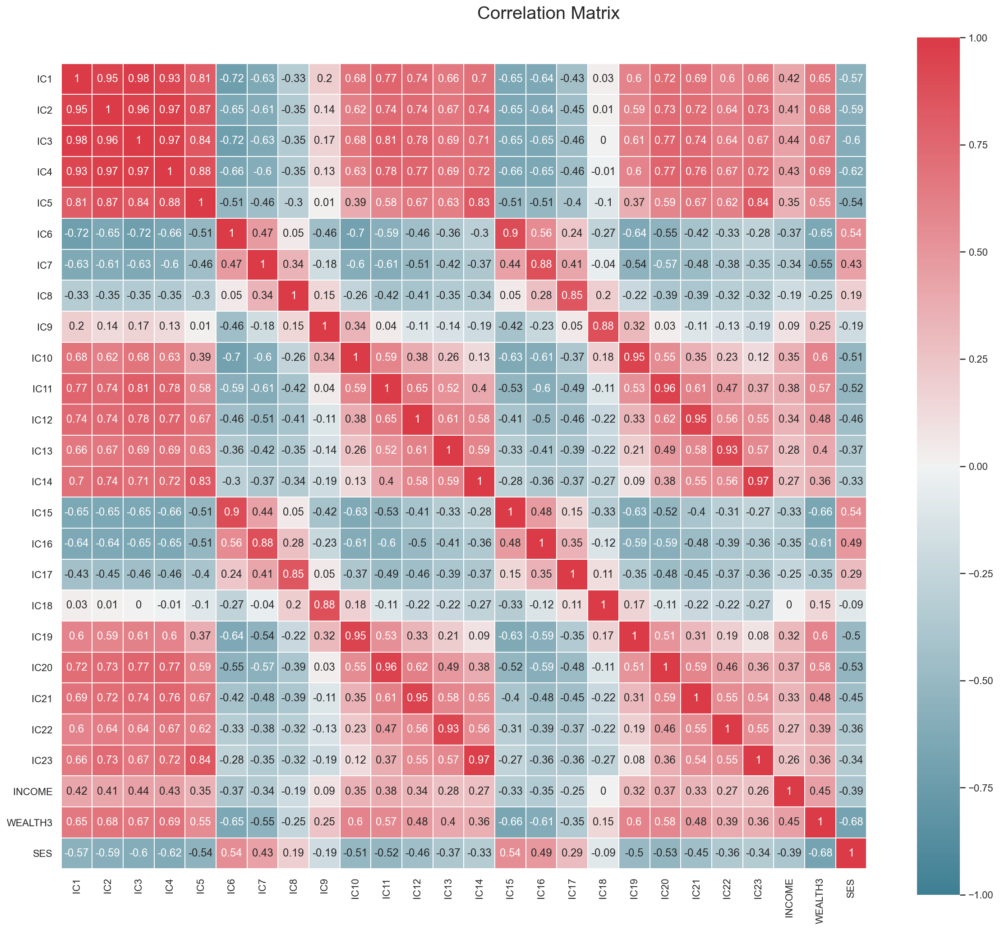

In [32]:
#CREATE A GROUP OF VARIABLES CORRELATED WITH INCOME AND WEALTH TO REPLACE THE MISSING VALUES
income_features = ['IC1','IC2','IC3','IC4','IC5','IC6','IC7','IC8','IC9','IC10','IC11','IC12','IC13','IC14','IC15',
'IC16','IC17','IC18','IC19','IC20','IC21','IC22','IC23','INCOME','WEALTH3','SES']
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df1[income_features].corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [33]:
#CREATE A GROUP OF VARIABLES CORRELATED WITH INCOME AND WEALTH TO REPLACE THE MISSING VALUES
knn_features = ['IC1','IC2','IC3','IC4','IC5','IC6','IC10','IC11','IC15','IC16','IC20','SES']
#less than 0.5 in both
#less than 0.35 in income

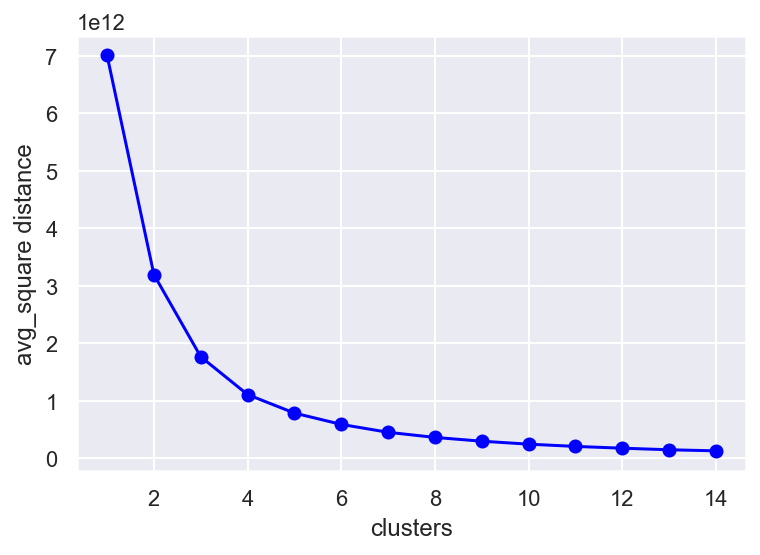

In [35]:
#INERT PLOT TO KNOW THE NUMBER OF NEIGHBORS TO RUN KNN IMPUTER
inert = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df1[knn_features])
    inert.append(kmeanModel.inertia_)
#Define name for x axis and y axis
plt.xlabel("clusters")
plt.ylabel("avg_square distance")
plt.plot(K,inert,"o-",color="blue")

In [36]:
knn_features_all = ['IC1','IC2','IC3','IC4','IC5','IC6','IC10','IC11','IC15','IC16','IC20','SES','INCOME','WEALTH3']

In [37]:
#RUN KNN IMPUTER TO REPLACE MISSING VALUES IN INCOME AND WEALTH
imputer = KNNImputer(n_neighbors=4, weights="uniform")
df1[knn_features_all] = imputer.fit_transform(df1[knn_features_all]).astype(int)

In [38]:
#CHECK MISSING DATA
df_missing1 = missing_data(df1)
df_missing1 = df_missing1[df_missing1['missing']>0]
df_missing1

,Feature,missing,percentage


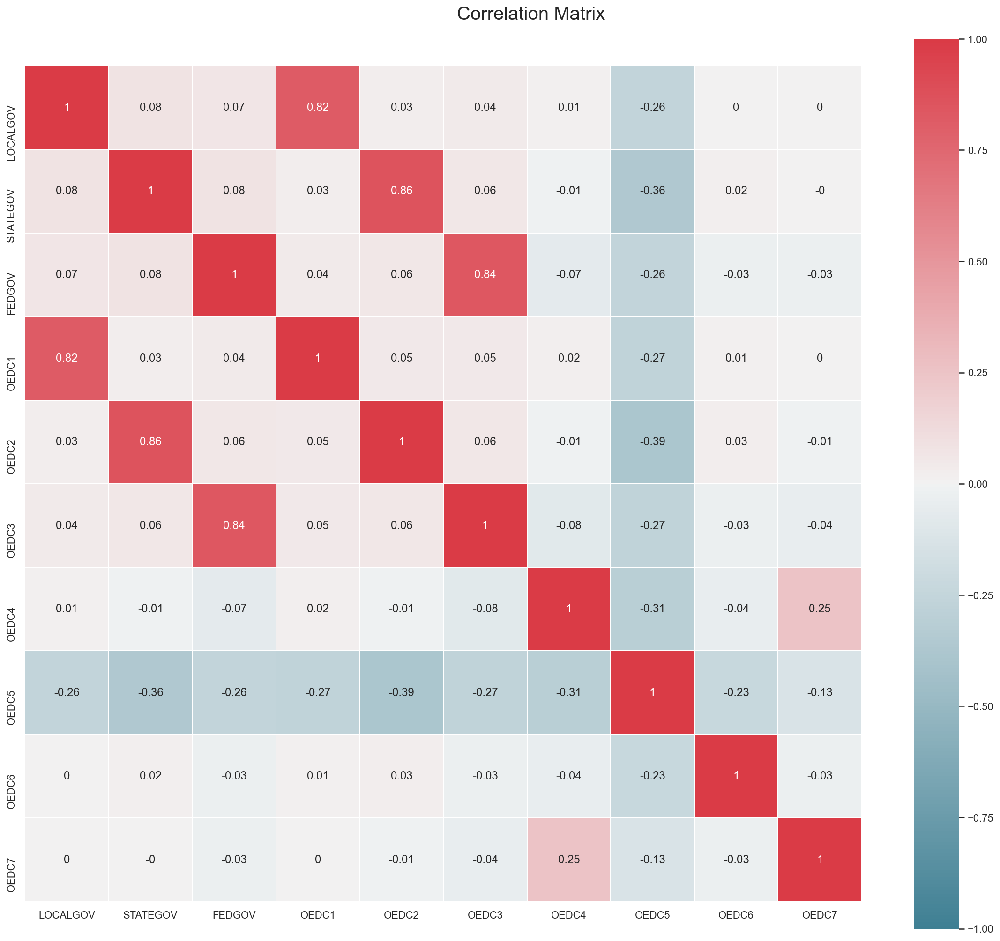

In [39]:
#CHECK THE CORRELATION BETWEEN SOME VARIABLES
work_features = ['LOCALGOV','STATEGOV','FEDGOV', 'OEDC1','OEDC2','OEDC3','OEDC4','OEDC5','OEDC6','OEDC7']
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df1[work_features].corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

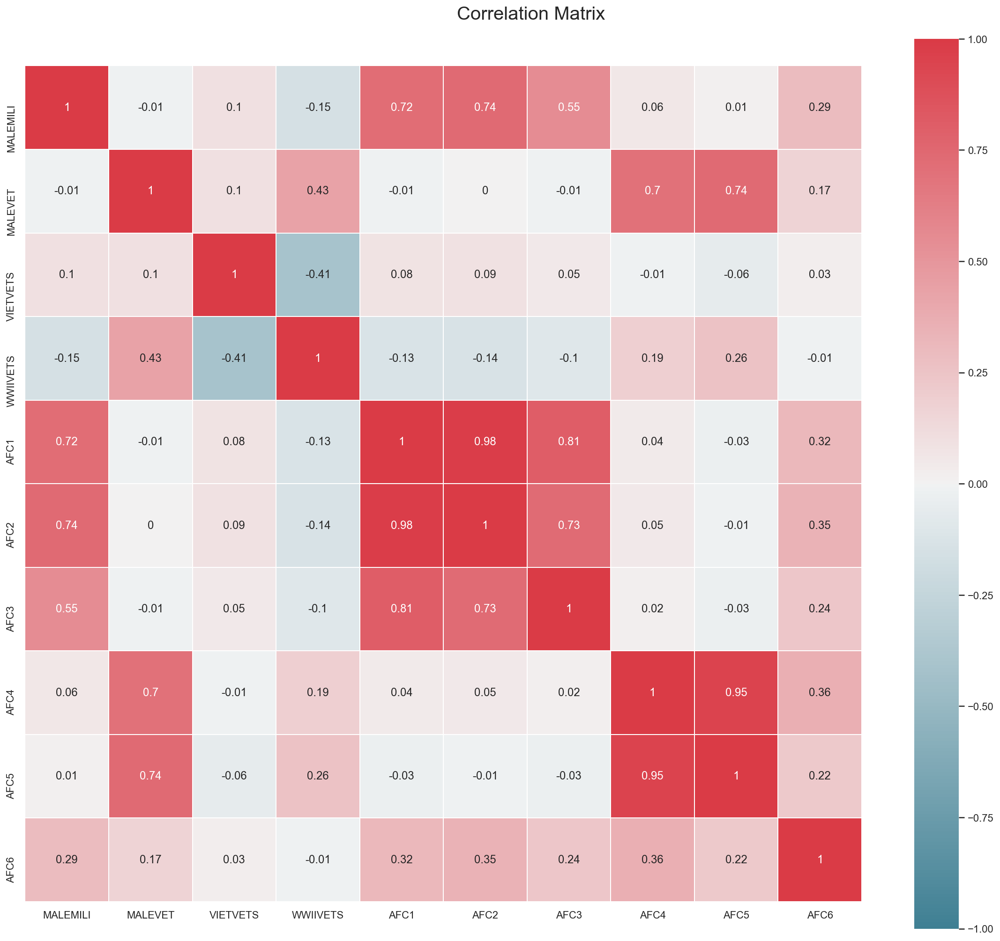

In [40]:
#CHECK THE CORRELATION BETWEEN SOME VARIABLES
veterans_features = ['MALEMILI','MALEVET','VIETVETS','WWIIVETS','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df1[veterans_features].corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [41]:
#VARIABLES DROPPED BECAUSE OF HIGH CORRELATION
df1 = df1.drop(columns=['OEDC1','OEDC2','OEDC3','AFC1','AFC2','AFC3','AFC4','AFC5','AFC6'])

In [42]:
df1

,STATE,ZIP,MAILCODE,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,HOMEOWNR,INCOME,GENDER,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,AGE,TIME_AS_DONOR,URBAN,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS
0,IL,61081,1,0,0,0,0,0,XXXX,H,2,F,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,39,34,18,10,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,7.741935,0,L,4,E,X,X,X,C,60,8,T,2,5,51.85,18,2
1,CA,91326,1,0,0,0,0,0,XXXX,H,6,M,16,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,3,0,15,55,11,6,2,1,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,0,0,96,0,4,0,0,0,99,0,99,99,99,20,4,6,5,12,32,6,13,47

In [43]:
#Divide database 
#Donors details
df2=df1.loc[:,['STATE','ZIP','MAILCODE','NOEXCH','RECINHSE','RECP3','RECPGVG','RECSWEEP',
'MDMAUD','HOMEOWNR','INCOME','GENDER','WEALTH3','HIT','DATASRCE',
'MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV','SOLP3','SOLIH','MAJOR','LIFESRC',
'AGE', 'TIME_AS_DONOR','SES','PEPSTRFL','HPHONE_D','GEOCODE2']].copy()

In [44]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95412 entries, 0 to 95411
Data columns (total 32 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   STATE          95412 non-null  object
 1   ZIP            95412 non-null  object
 2   MAILCODE       95412 non-null  int64 
 3   NOEXCH         95412 non-null  object
 4   RECINHSE       95412 non-null  int64 
 5   RECP3          95412 non-null  int64 
 6   RECPGVG        95412 non-null  int64 
 7   RECSWEEP       95412 non-null  int64 
 8   MDMAUD         95412 non-null  object
 9   HOMEOWNR       95412 non-null  object
 10  INCOME         95412 non-null  int64 
 11  GENDER         95412 non-null  object
 12  WEALTH3        95412 non-null  int64 
 13  HIT            95412 non-null  int64 
 14  DATASRCE       95412 non-null  object
 15  MALEMILI       95412 non-null  int64 
 16  MALEVET        95412 non-null  int64 
 17  VIETVETS       95412 non-null  int64 
 18  WWIIVETS       95412 non-n

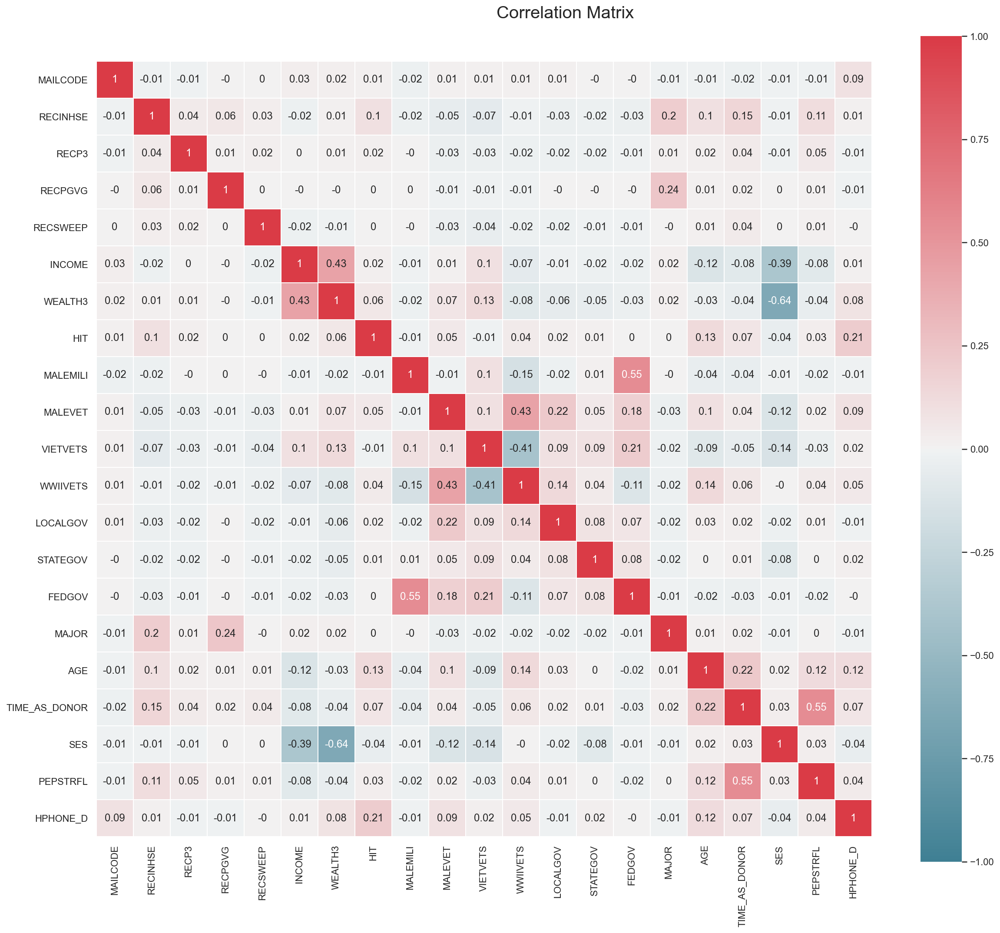

In [45]:
#Correlation matrix
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df2.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [46]:
metric_features =['INCOME', 'WEALTH3', 'HIT', 'MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV',
                  'AGE', 'TIME_AS_DONOR','SES']


C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\si

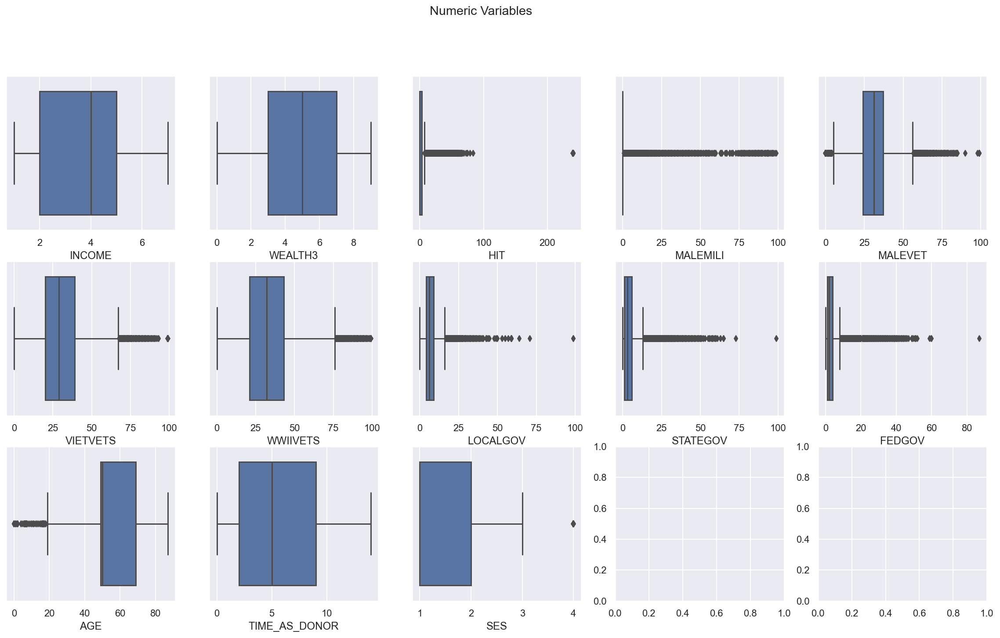

In [47]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(df2[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables"

plt.suptitle(title)

plt.show()

In [48]:
#hand made outliers
filters1 = (
    (df2['HIT']<=100)
    &
    (df2['AGE']>=20)
    &
    (df2['SES']<4)
    &
    (df2['MALEVET']<80)
    &
    (df2['VIETVETS']<=85)
    &
    (df2['LOCALGOV']<60)
    &
    (df2['STATEGOV']<70)
    &
    (df2['FEDGOV']<60)
   
)
df2_out = df2[filters1]
print('Percentage of data kept after removing outliers:', np.round(df2_out.shape[0] / df2.shape[0], 4))

Percentage of data kept after removing outliers: 0.9679


In [49]:
df1 = df1[filters1]

In [50]:
df1.shape

(92353, 362)

In [51]:
#Divide database 
#Preferences variables.
df_preferences = df1.loc[:,['MBCRAFT','MBGARDEN','MBBOOKS','MBCOLECT','MAGFAML','MAGFEM','MAGMALE','PUBGARDN','PUBCULIN',
'PUBHLTH','PUBDOITY','PUBNEWFN','PUBPHOTO','PUBOPP','COLLECT1','VETERANS','BIBLE','CATLG','HOMEE','PETS','CDPLAY','STEREO',
'PCOWNERS','PHOTO','CRAFTS','FISHER','GARDENIN','BOATS','WALKER','KIDSTUFF','CARDS','PLATES']].copy()

In [52]:
df_preferences.head()

,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.0,0.0,9.0,0.0,4.0,1.0,0.0,0.0,0.0,4.0,0.0,1.0,0.0,1.0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0


In [53]:
df_preferences.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92353 entries, 0 to 95411
Data columns (total 32 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   MBCRAFT   92353 non-null  float64
 1   MBGARDEN  92353 non-null  float64
 2   MBBOOKS   92353 non-null  float64
 3   MBCOLECT  92353 non-null  float64
 4   MAGFAML   92353 non-null  float64
 5   MAGFEM    92353 non-null  float64
 6   MAGMALE   92353 non-null  float64
 7   PUBGARDN  92353 non-null  float64
 8   PUBCULIN  92353 non-null  float64
 9   PUBHLTH   92353 non-null  float64
 10  PUBDOITY  92353 non-null  float64
 11  PUBNEWFN  92353 non-null  float64
 12  PUBPHOTO  92353 non-null  float64
 13  PUBOPP    92353 non-null  float64
 14  COLLECT1  92353 non-null  int64  
 15  VETERANS  92353 non-null  int64  
 16  BIBLE     92353 non-null  int64  
 17  CATLG     92353 non-null  int64  
 18  HOMEE     92353 non-null  int64  
 19  PETS      92353 non-null  int64  
 20  CDPLAY    92353 non-null  in

In [54]:
metric_pref = ['MBCRAFT','MBGARDEN','MBBOOKS','MBCOLECT','MAGFAML','MAGFEM','MAGMALE','PUBGARDN','PUBCULIN',
'PUBHLTH','PUBDOITY','PUBNEWFN','PUBPHOTO','PUBOPP']
non_metric_pref = ['COLLECT1','VETERANS','BIBLE','CATLG','HOMEE','PETS','CDPLAY','STEREO',
'PCOWNERS','PHOTO','CRAFTS','FISHER','GARDENIN','BOATS','WALKER','KIDSTUFF','CARDS','PLATES']

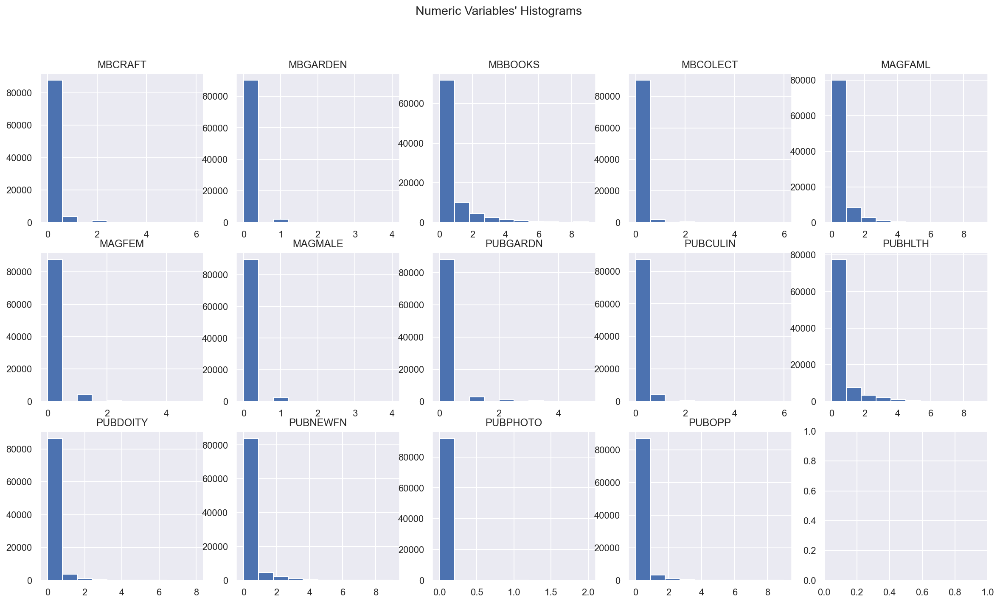

In [55]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(3, ceil(len(metric_pref) / 3), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_pref): 
    ax.hist(df_preferences[feat])
    ax.set_title(feat)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

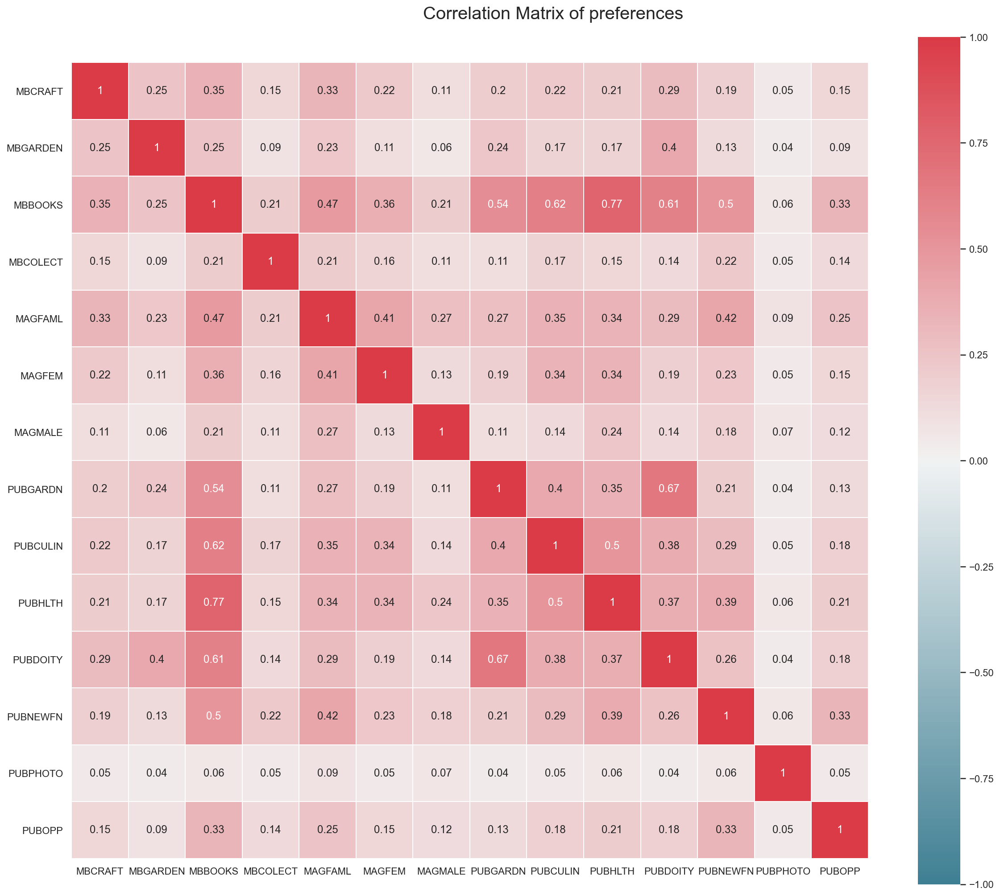

In [56]:
#Correlation matrix
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_preferences[metric_pref].corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix of preferences", fontsize=20)

plt.show()

In [57]:
#Divide database 
#promotion variables
df_promotion = df1.loc[:,['CARDPROM', 'NUMPROM','CARDPM12', 'NUMPRM12', 'RAMNTALL', 'NGIFTALL', 'CARDGIFT', 'MINRAMNT',
                          'MAXRAMNT', 'LASTGIFT', 'AVGGIFT','RFA_2R', 'RFA_2F', 'RFA_2A', 'MDMAUD_R', 'MDMAUD_F', 'MDMAUD_A', 
                          'PERCGIFTCARDPROMO','GAPLASTGIFT', 'AVGGAPBTWGIFTS']]




In [58]:
metric_promo =['CARDPROM', 'NUMPROM','CARDPM12', 'NUMPRM12', 'RAMNTALL', 'NGIFTALL', 'CARDGIFT', 'MINRAMNT',
                'MAXRAMNT', 'LASTGIFT', 'AVGGIFT','PERCGIFTCARDPROMO','GAPLASTGIFT', 'AVGGAPBTWGIFTS']


C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\debor\anaconda3\lib\si

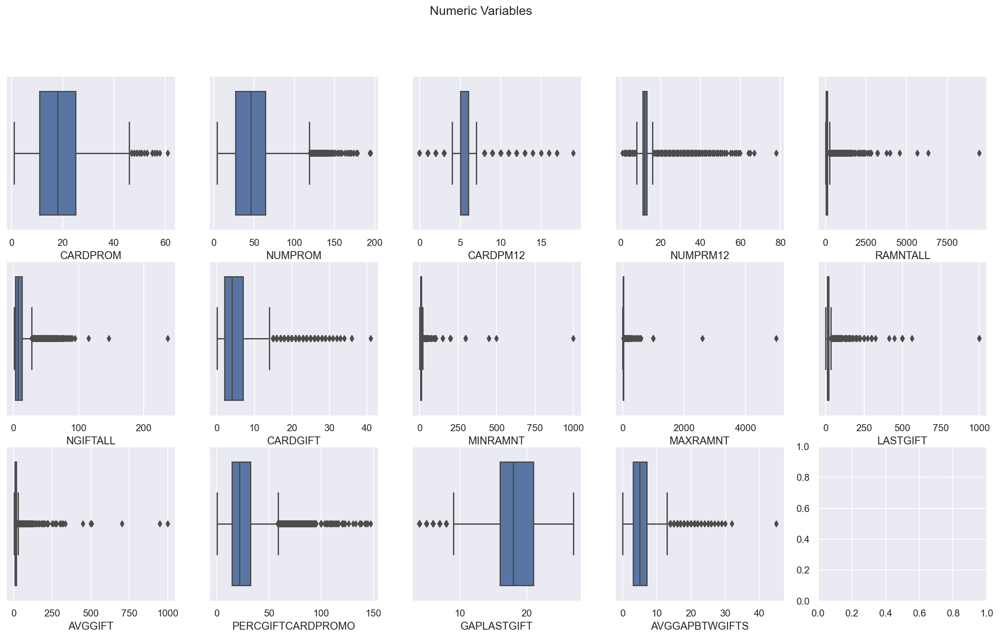

In [59]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric_promo) / 3), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot
for ax, feat in zip(axes.flatten(), metric_promo):
    sns.boxplot(df_promotion[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables"

plt.suptitle(title)

plt.show()

In [60]:
#hand made outliers
filters1 = (
    (df_promotion['CARDPROM']<60)
    &
    (df_promotion['NUMPROM']<180)
    &
    (df_promotion['CARDPM12']<18)
    &
    (df_promotion['NUMPRM12']<75)
    &
    (df_promotion['RAMNTALL']<=7500)
    &
    (df_promotion['NGIFTALL']<100)
    &
    (df_promotion['CARDGIFT']<40)
    &
    (df_promotion['MINRAMNT']<=500)
    &
    (df_promotion['MAXRAMNT']<2000)
    &
    (df_promotion['LASTGIFT']<750)
    &
    (df_promotion['AVGGIFT']<=500)
    &
    (df_promotion['GAPLASTGIFT']>5)
    &
    (df_promotion['AVGGAPBTWGIFTS']<30)
   
)
dfpromo_out = df_promotion[filters1]
print('Percentage of data kept after removing outliers:', np.round(dfpromo_out.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.952


In [61]:
df1 = df1[filters1]

In [62]:
df1.shape

(90828, 362)

## Census

In [63]:
#Divide database 
#Census variables
df_census = df1.loc[:,'POP901':'AC2'].copy()

In [64]:
df_census.head()

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2
0,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7
1,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,0,0,96,0,4,0,0,0,99,0,99,99,99,20,4,6,5
2,7001,2040,2669,0,2,98,49,51,96,2,0,0,2,0,0,0,0,0,0,0,2,0,0,0,35,43,46,37,45,49,23,35,40,25,13,20,19,16,13,10,8,15,14,30,22,19,25,10,23,21,35,44,22,6,2,63,9,9,19,183,254,69,69,1,6,5,3,3,3,0,497,546,2,1,78,22,93,7,18,36,76,65,30,86,14,7,2,5,11,17,3,17,60,18,0,1,0,0,1,6,18,50,0,4,36,49,51,14,5,4,2,24,11,2,3,6,0,2,9,44,0.0,281.0,518.0,251,292,292,340,11576,32,18,20,15,12,2,0,0,1,20,19,24,18,16,2,0,0,1,28,8,31,11,38,62,8,74,22,0,0,0,0,0,2,2,1,21,19,24,6,61,65,73,59,70,56,78,62,82,99,4,10,5,2,6,12,0,1,9,5,18,20,5,7,6,0,11,33,4,3,2,12,3,3,2,0,7,8,3,3,8,74,3,1,120,22,20,28,16,6,5,3,1,23,1,16,6,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,2,84,96,3,0,0,92,65,29,9,22,3,12,23,50,69,31,0,0,0,6,35,44,0,15,22,77,17,97,92,9,2,6,5
3,640,160,219,0,8,92,54,46,61,0,0,11,32,6,2,0,0,0,0,0,31,0,0,1,32,40,44,34,43,47,25,45,35,20,15,25,17,17,12,7,7,20,17,30,14,19,25,11,23,23,27,50,30,15,8,63,9,6,23,199,283,85,83,3,4,1,0,2,0,2,1000,1263,2,1,48,52,93,7,6,36,73,61,30,84,16,6,3,3,21,12,4,13,36,13,0,0,0,10,25,50,69,92,10,15,42,55,50,15,5,4,0,9,42,4,0,5,1,8,17,34,9340.0,67.0,862.0,386,388,396,423,15130,27,12,4,2

In [65]:
df_census.shape

(90828, 277)

In [66]:
df_census2=df_census.copy()

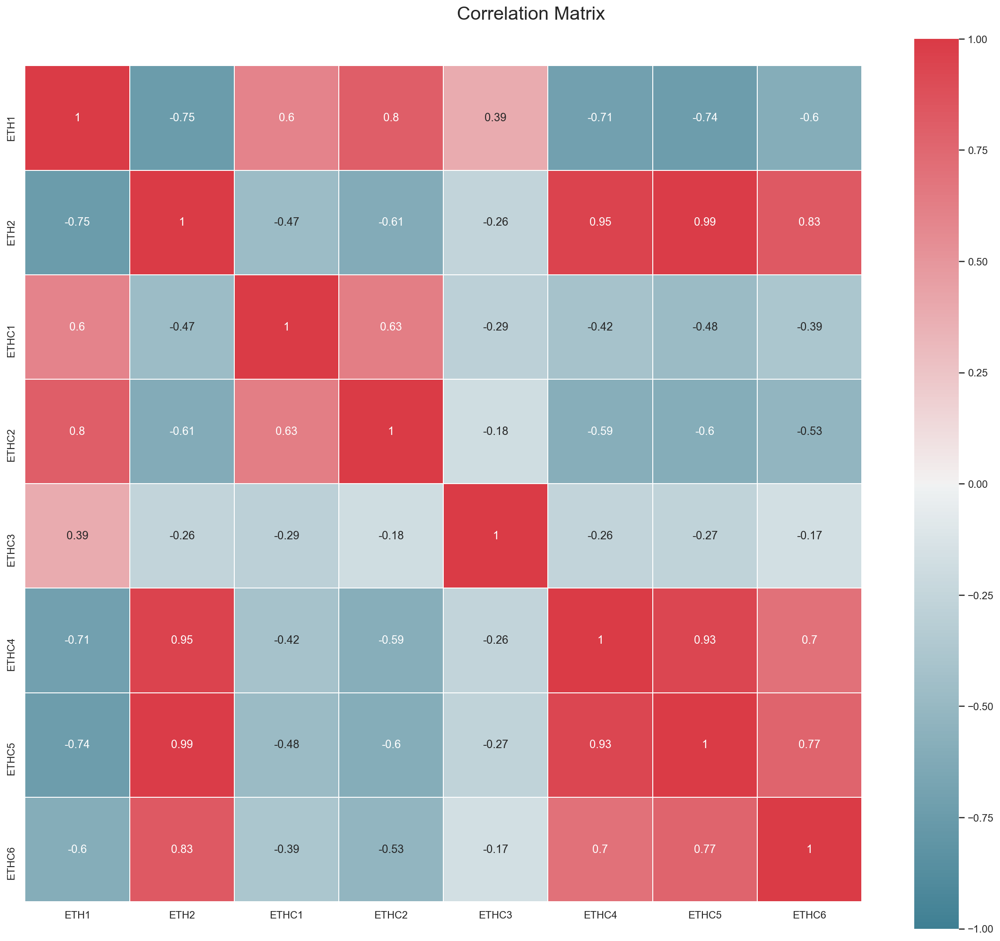

In [67]:
#correlation matrix
#KEEP ETH1, ETH2 DELETE ALL OTHERS ETHC'S
df_census_1 = df_census2.loc[:,['ETH1','ETH2','ETHC1','ETHC2','ETHC3','ETHC4','ETHC5','ETHC6']].copy()
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_1.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

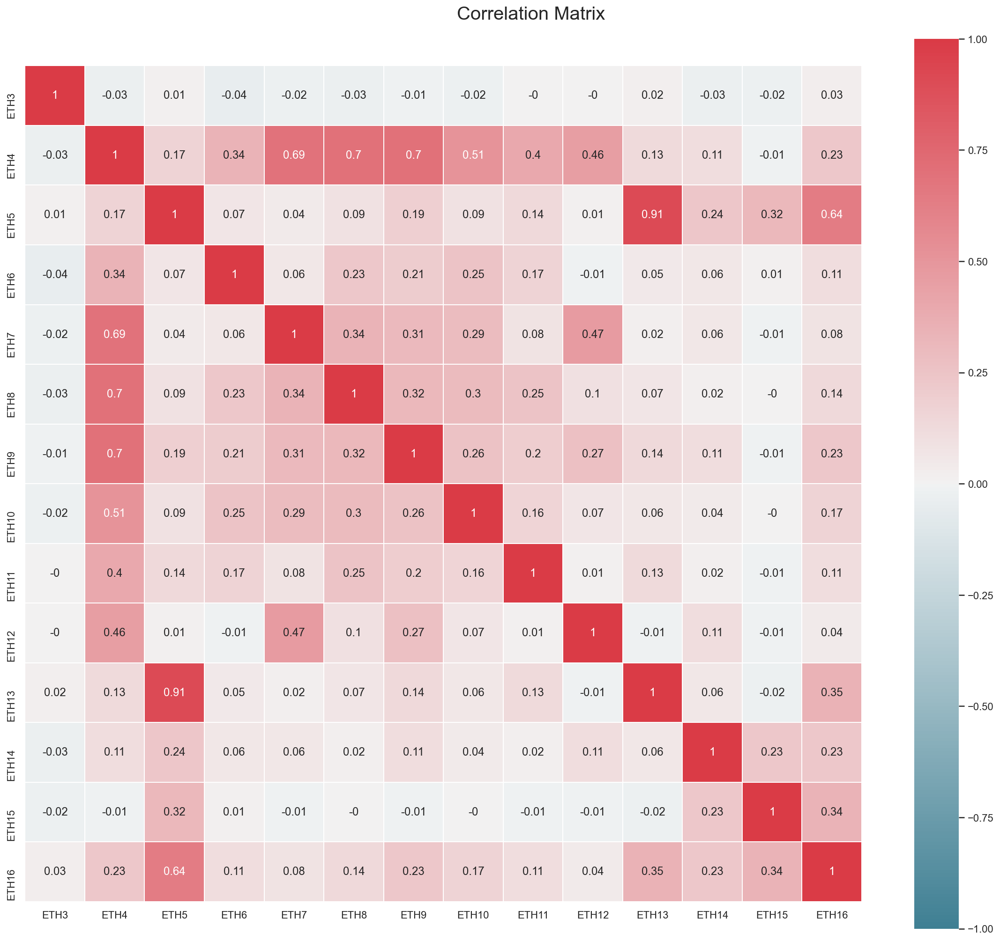

In [68]:
#correlation matrix
df_census_2 = df_census2.loc[:,'ETH3':'ETH16'].copy()
#KEEP THE ETH4, ETH3, ETH13,  
#DROP ETH7, ETH8, ETH9, ETH5,ETH16,ETH14,ETH15,ETH6,ETH10,11,12(DELETE THE LAST TWO CAUSE IS LOW PERCETAGE)
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_2.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

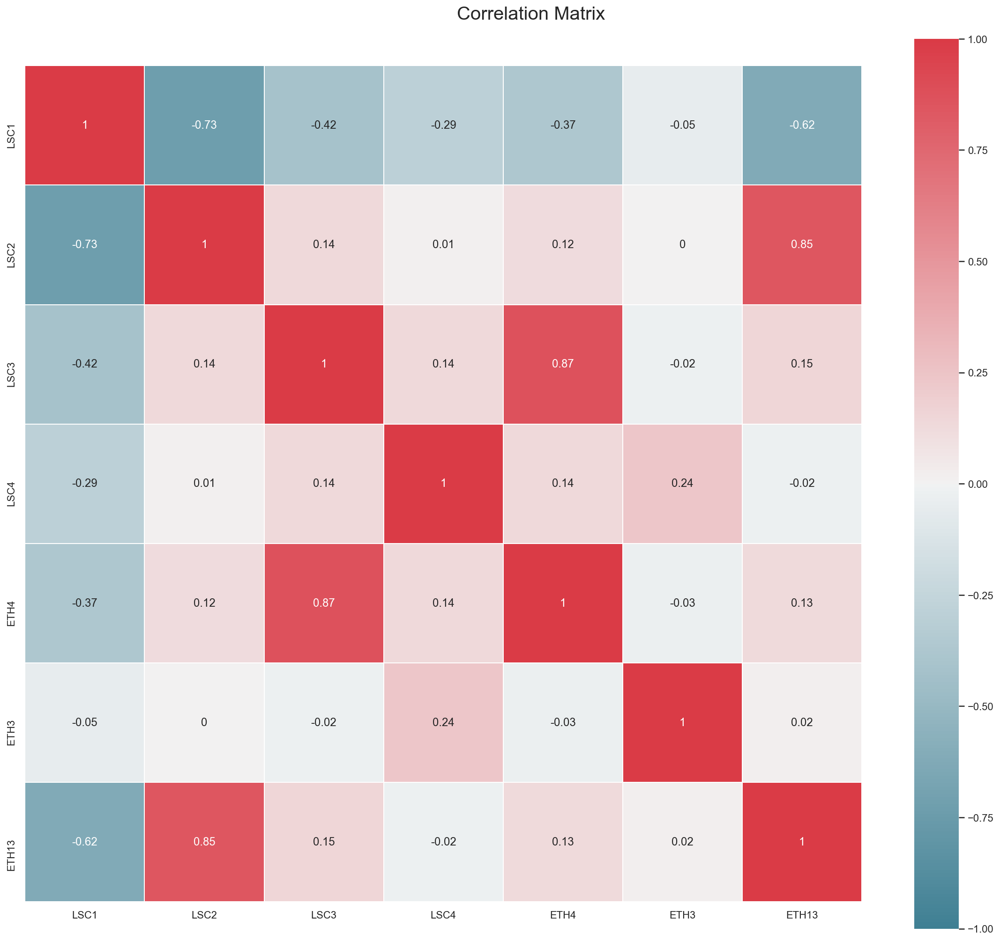

In [69]:
#correlation matrix
df_census_21 = df_census2.loc[:,['LSC1','LSC2','LSC3','LSC4','ETH4','ETH3','ETH13']].copy()
#DELETE LSC2,LSC3
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_21.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

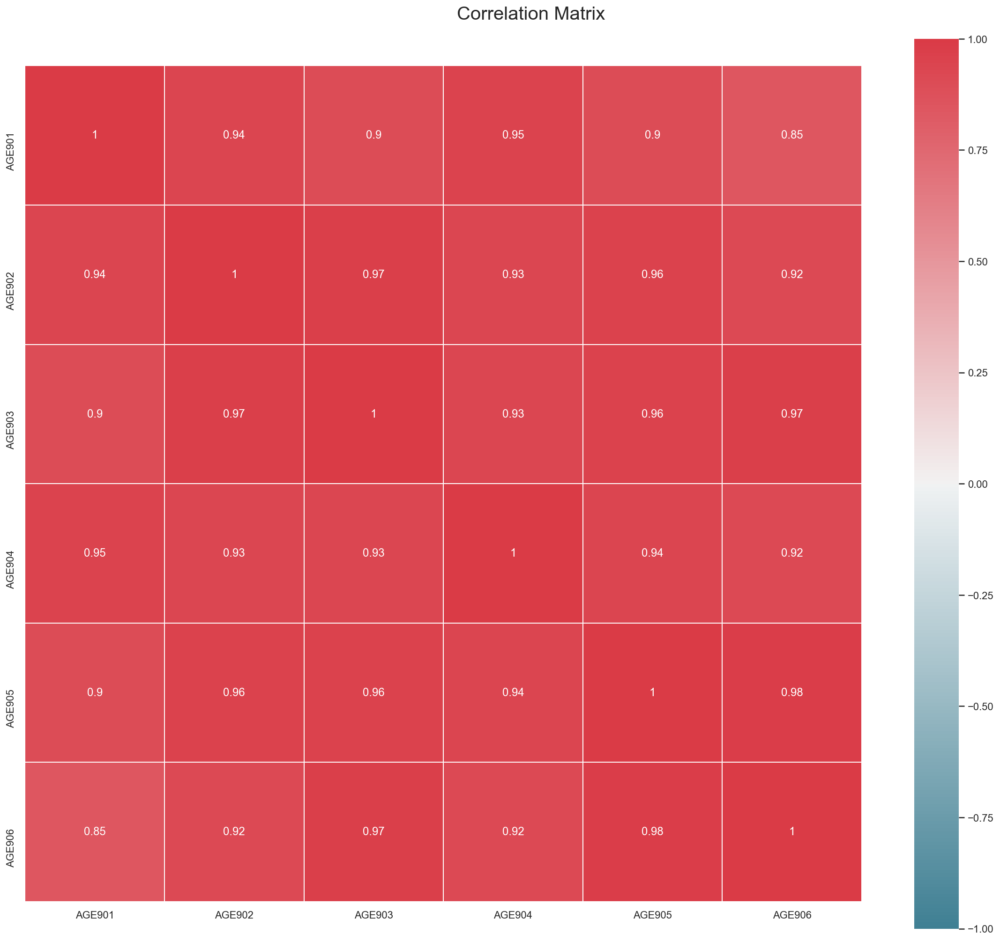

In [70]:
#correlation matrix
df_census_3 = df_census2.loc[:,['AGE901','AGE902','AGE903','AGE904','AGE905','AGE906']].copy() 
#keep age901 and age904 
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_3.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

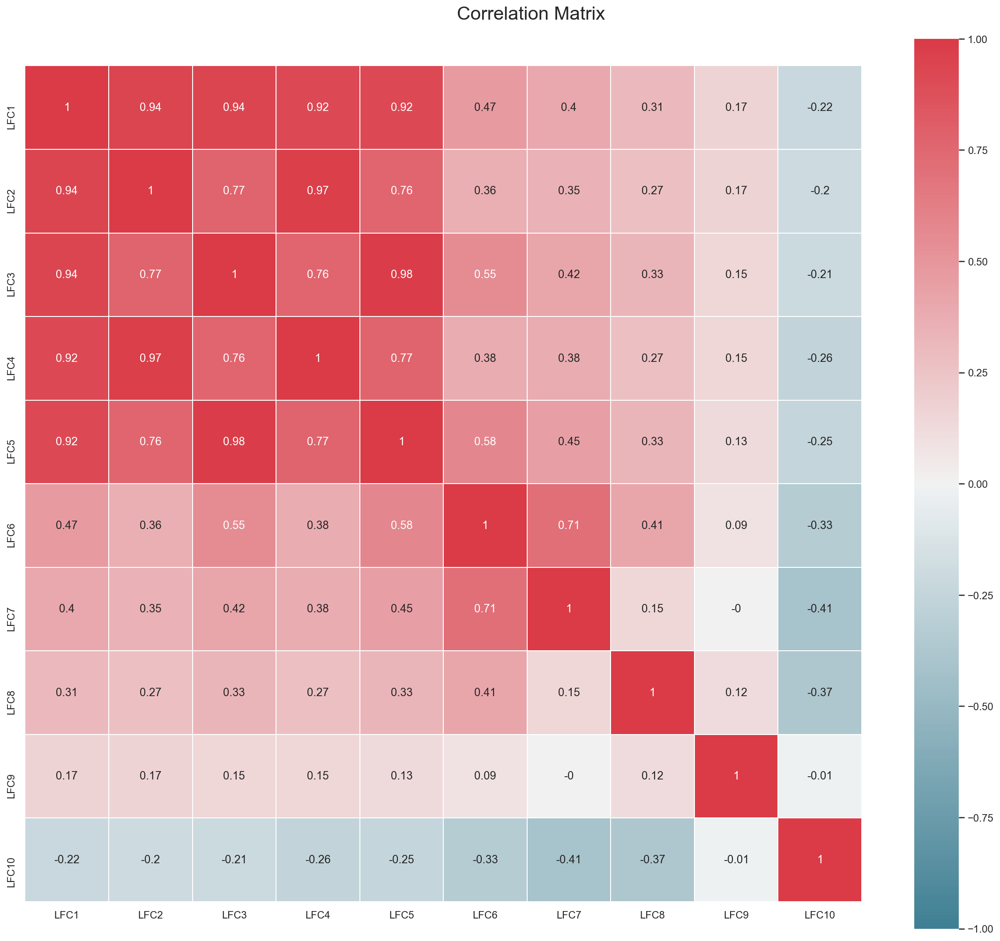

In [71]:
#correlation matrix
df_census_4 = df_census2.loc[:,'LFC1':'LFC10'].copy()
#KEEP lfc1, LFC7, 8, 9, 10
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_4.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

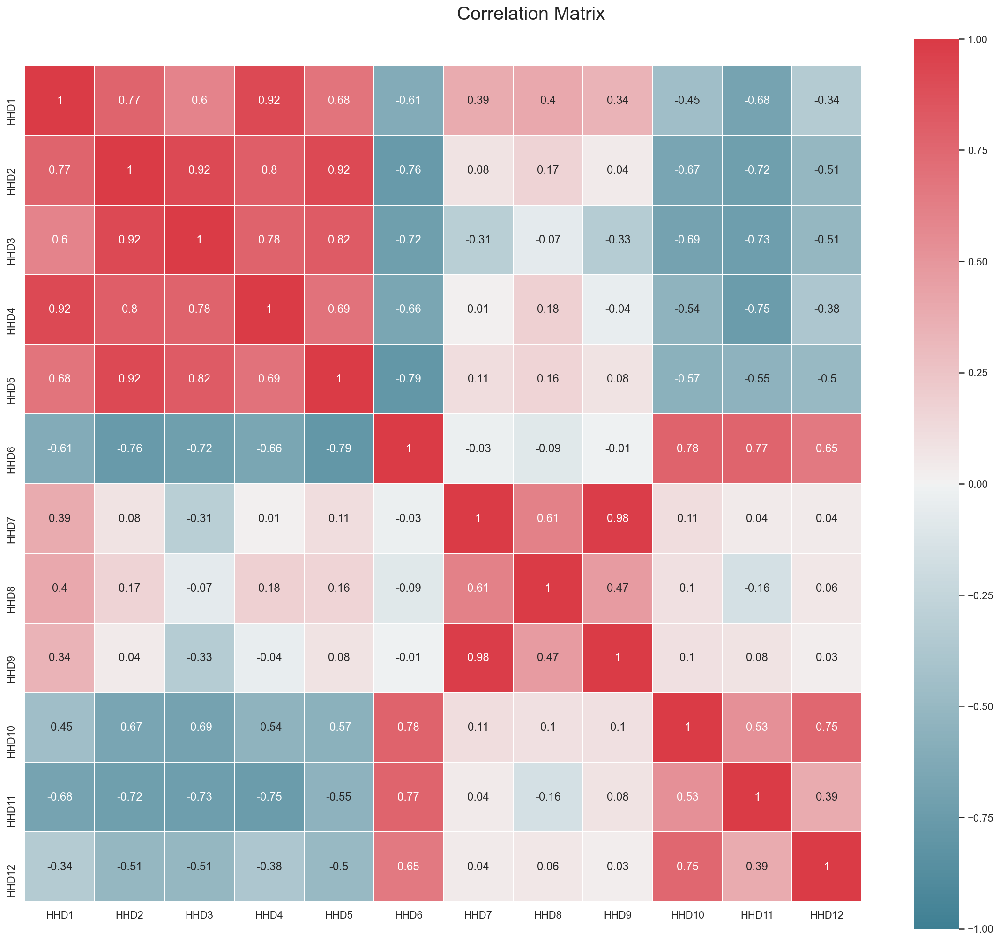

In [72]:
#correlation matrix
df_census_5 = df_census2.loc[:,'HHD1':'HHD12'].copy()
#DELETE HHD3, HHD2, HHD10 AND HH11 AND HHD12 AND HHD8 AND HHD9
#KEEP HHD1 AND HHD4 HHD5, HHD7, HHD6
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_5.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

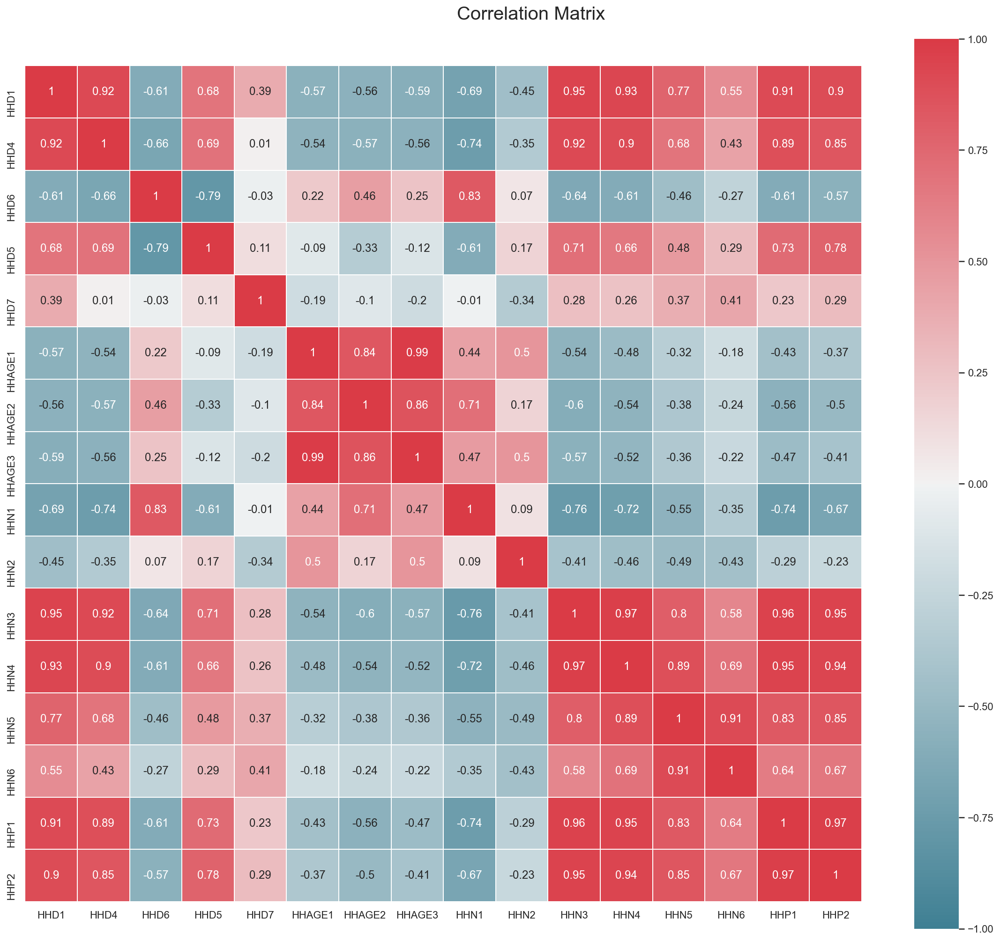

In [73]:
#correlation matrix
df_census_51 = df_census2.loc[:,['HHD1','HHD4','HHD6','HHD5','HHD7','HHAGE1','HHAGE2','HHAGE3','HHN1','HHN2','HHN3','HHN4',
                                'HHN5','HHN6','HHP1','HHP2']].copy()
#DELETE HHN3, HHN4, HHN6, HHN5, HHAGE2, HHAGE3 
#KEEP HHAGE1 AND HHN1 AND HHN2 ANd, HHP1,HHP2
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_51.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

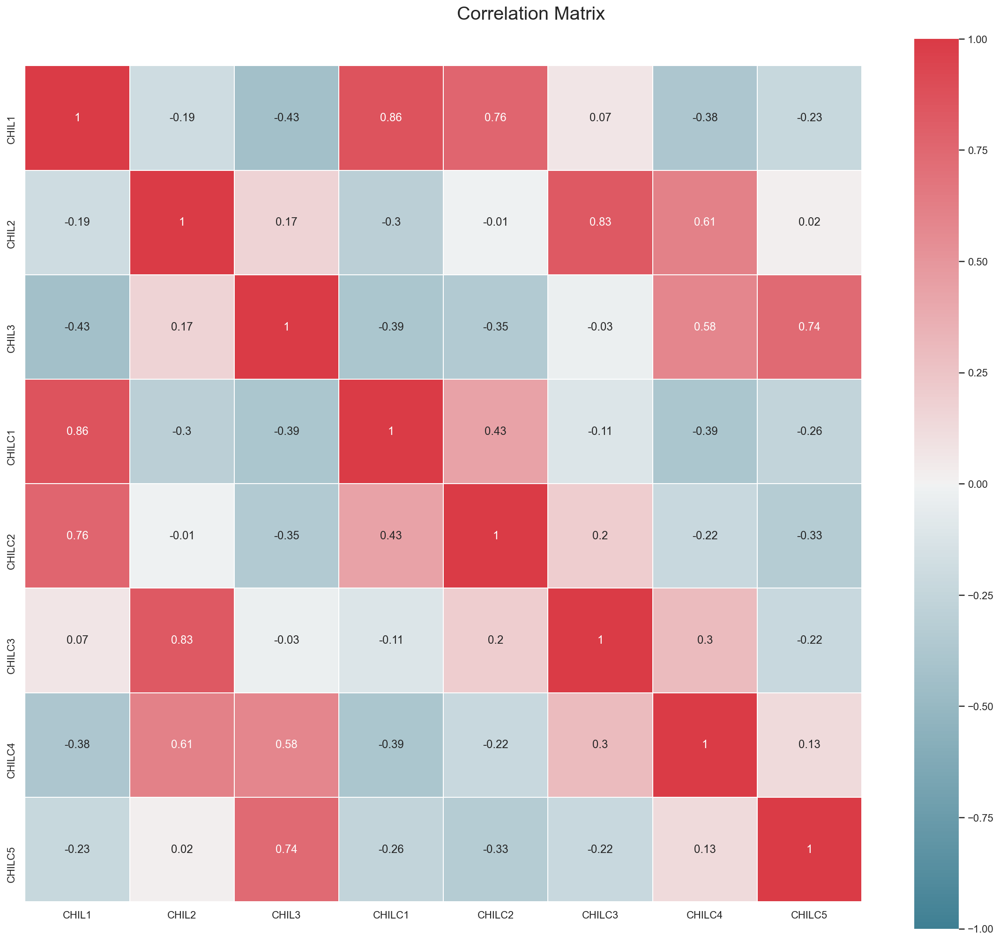

In [74]:
#correlation matrix
df_census_6 = df_census2.loc[:,['CHIL1','CHIL2','CHIL3','CHILC1','CHILC2','CHILC3','CHILC4','CHILC5']].copy()
#keep chil1,2,3
#drop chilc's
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_6.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

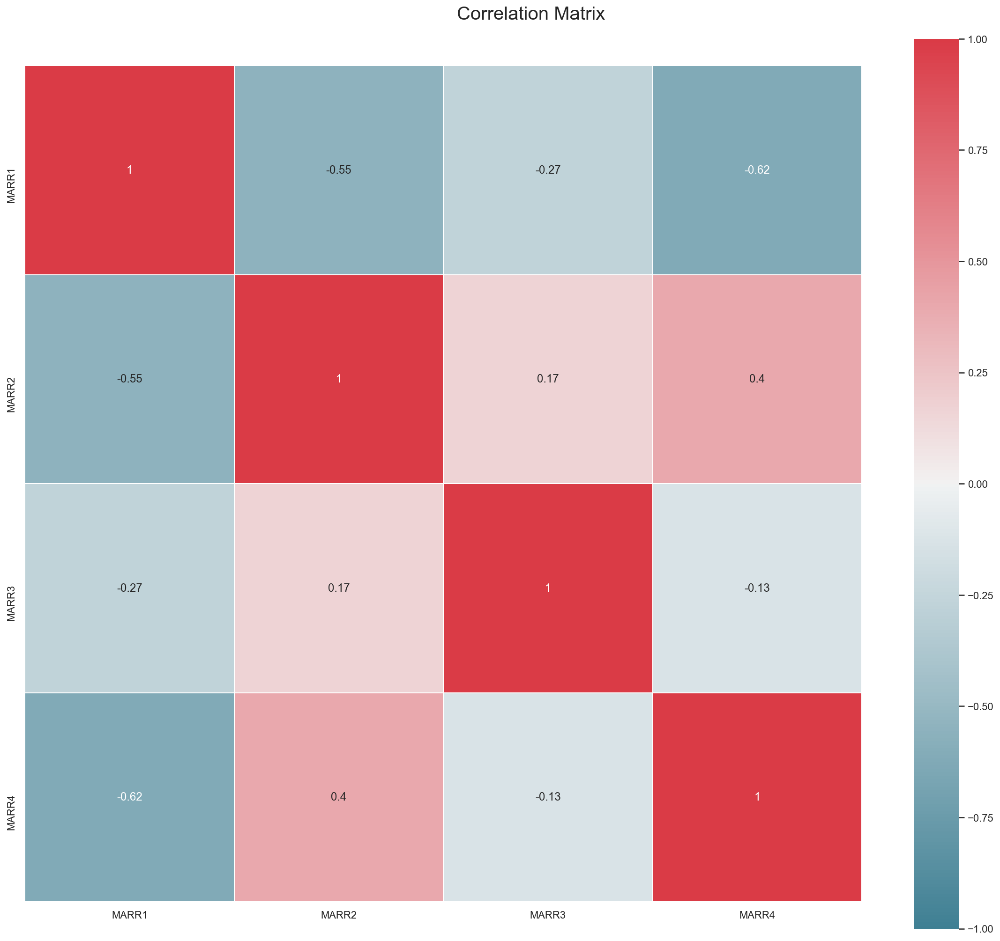

In [75]:
#correlation matrix
df_census_7 = df_census2.loc[:,['MARR1','MARR2','MARR3','MARR4']].copy() #keep all
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_7.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

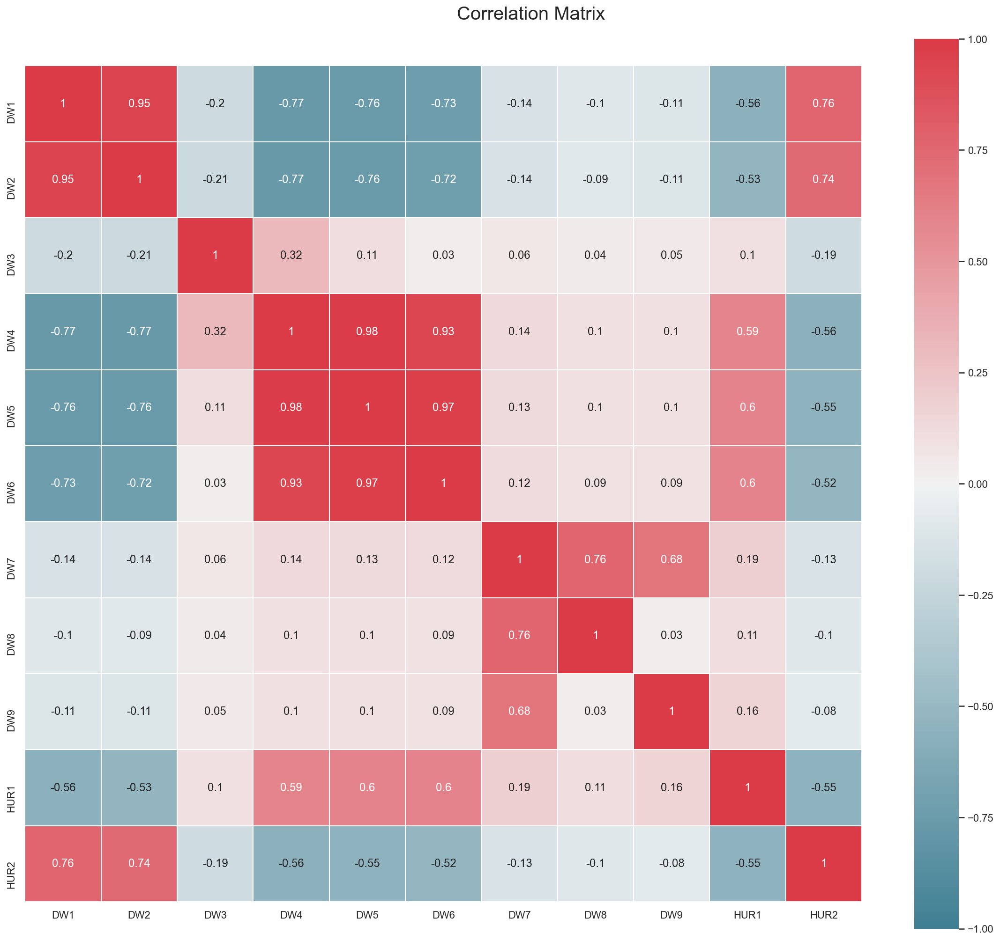

In [76]:
#correlation matrix
df_census_8= df_census2.loc[:,['DW1','DW2','DW3','DW4','DW5','DW6','DW7','DW8','DW9','HUR1','HUR2']].copy()
#keep dw1, dw7, dw4, HUR1
#delete dw3 because its avarage low percentage (only 3%)
#delete all others
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_8.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

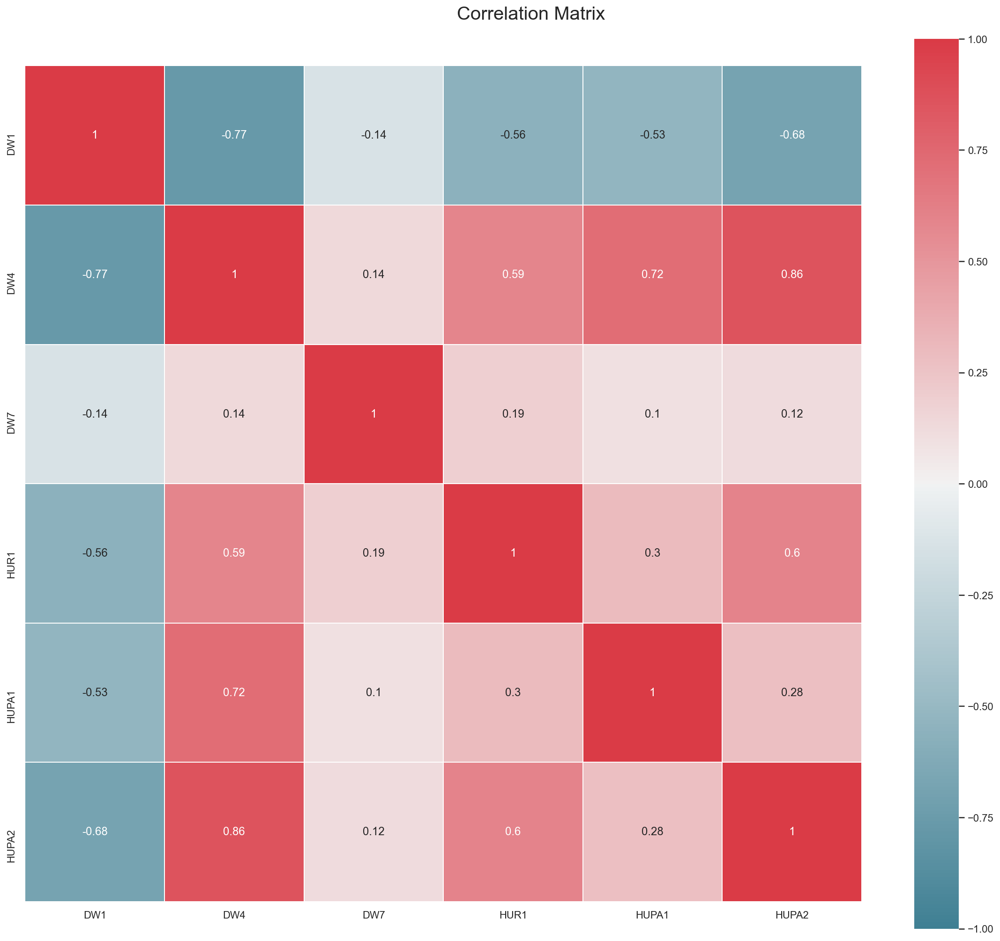

In [77]:
#correlation matrix
df_census_81= df_census2.loc[:,['DW1','DW4','DW7','HUR1','HUPA1','HUPA2']].copy()
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_81.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)
plt.show()

#delete HUPA1 AND HUPA2
#Keep the others

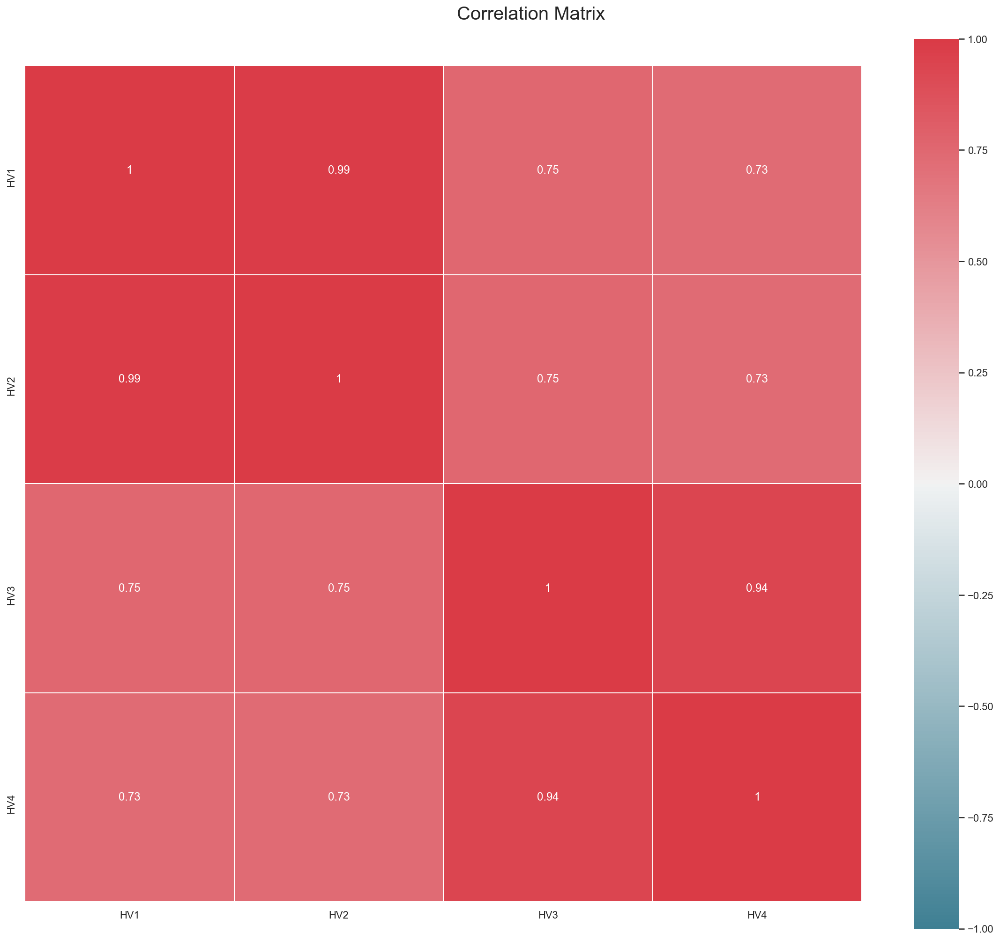

In [78]:
#correlation matrix
df_census_9= df_census2.loc[:, ['HV1','HV2','HV3','HV4']].copy()
#KEEP HV1,2
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_9.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

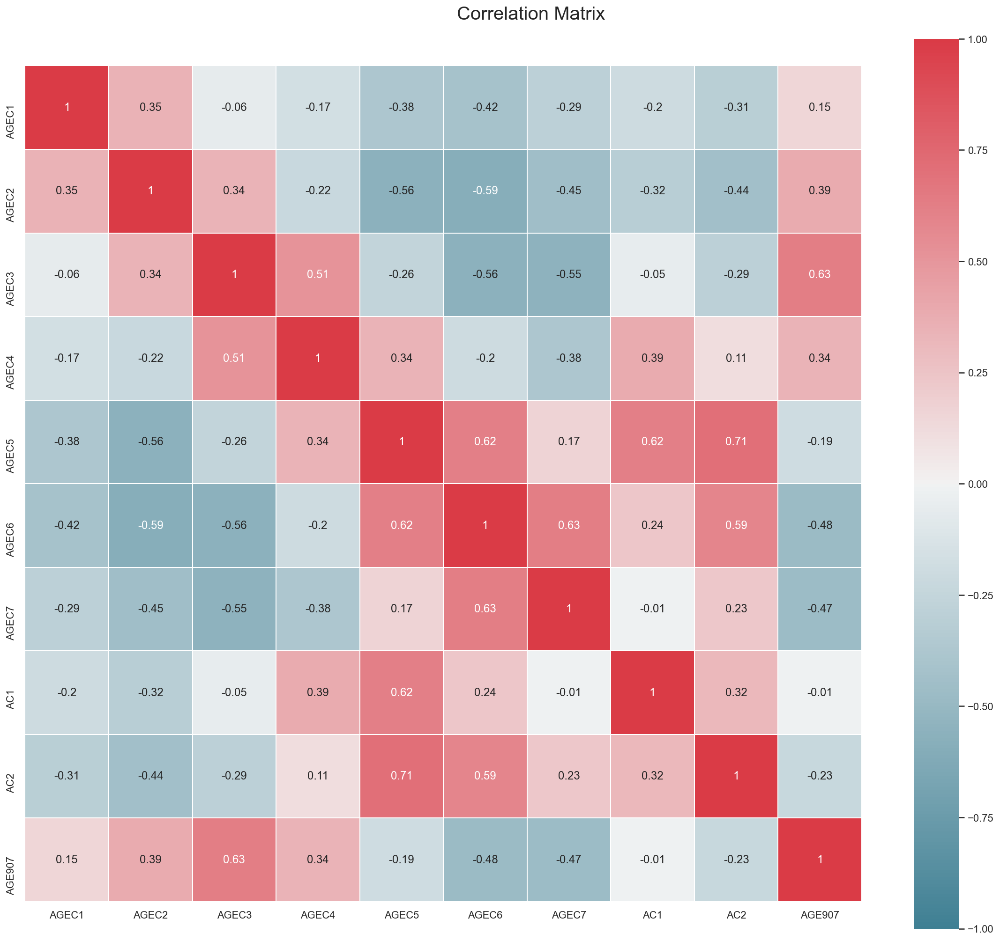

In [79]:
#correlation matrix
df_census_10 = df_census2.loc[:,['AGEC1','AGEC2','AGEC3','AGEC4','AGEC5','AGEC6','AGEC7','AC1','AC2','AGE907']].copy()
#drop ac1,2
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_10.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

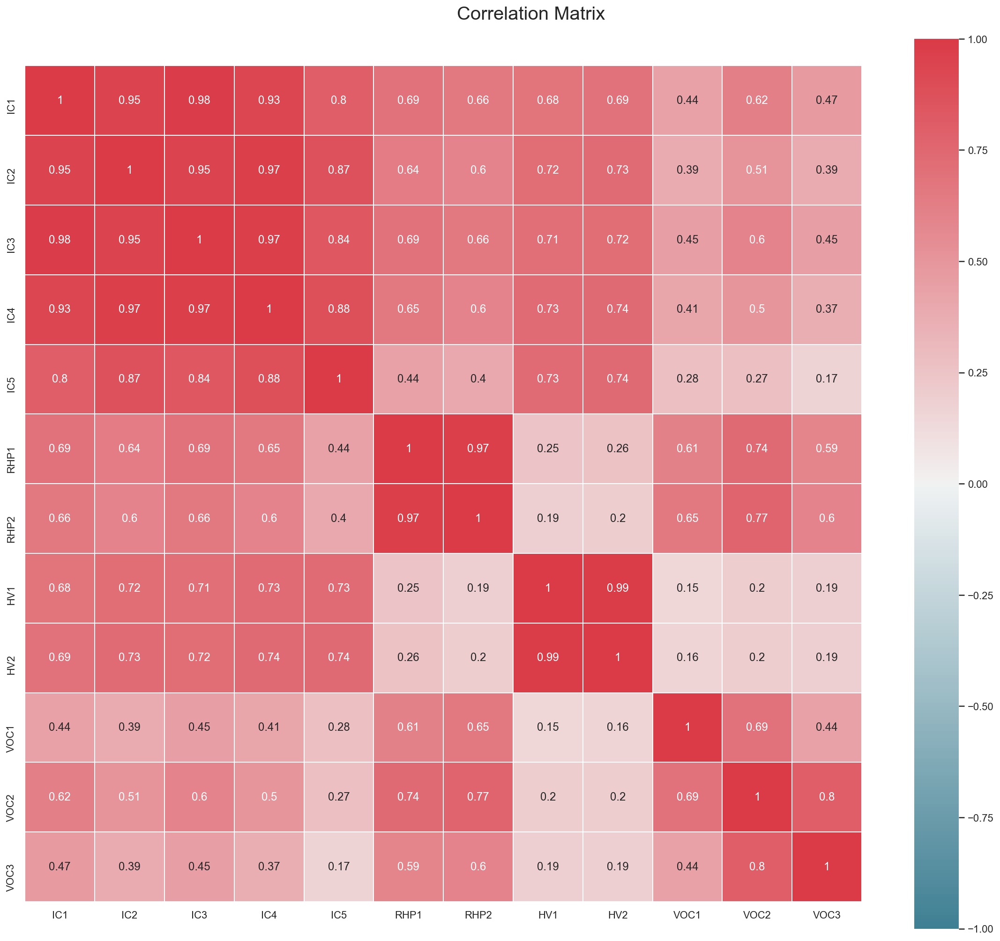

In [80]:
#correlation matrix
df_census_11= df_census2.loc[:,['IC1','IC2','IC3','IC4','IC5','RHP1','RHP2','HV1','HV2','VOC1','VOC2','VOC3']].copy()
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_11.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

#remove RHP1,RHP2,HV1,HV2
#Keep all others, and do PCA

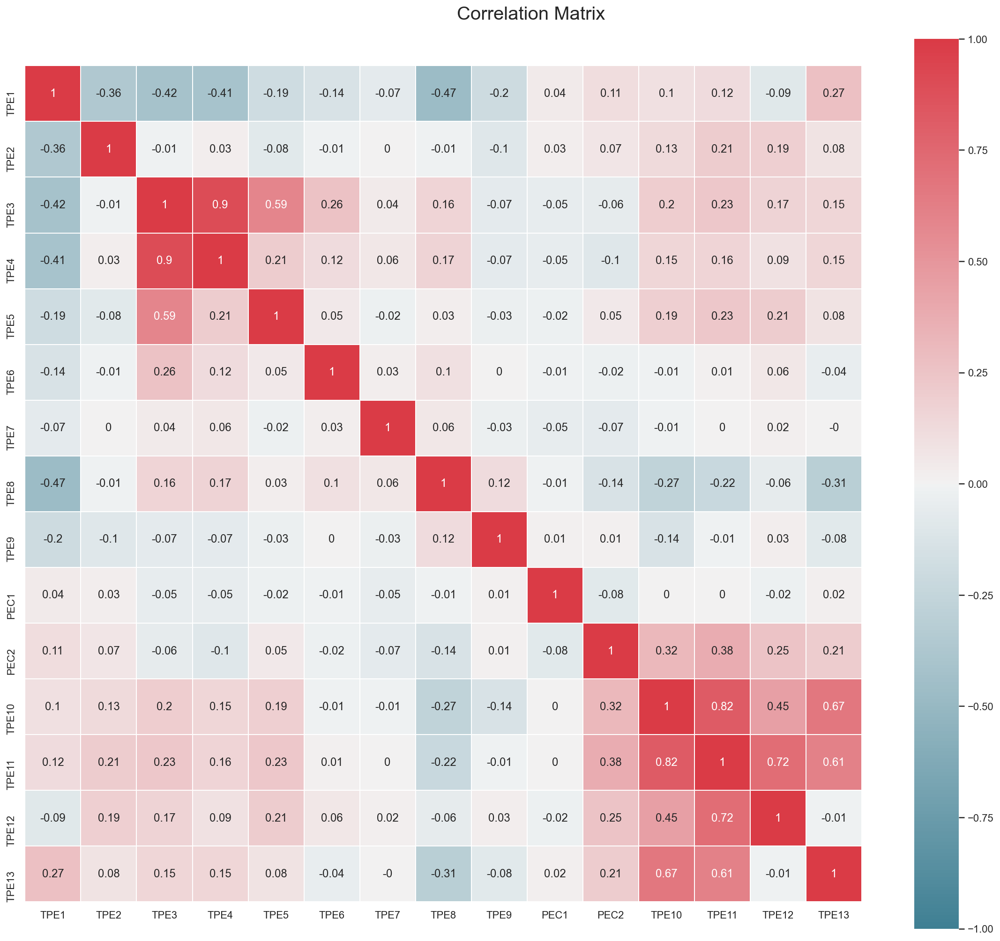

In [81]:
#correlation matrix
df_census_12= df_census2.loc[:,'TPE1':'TPE13'].copy()
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_12.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

#remove TPE4,TPE12, TPE13
#keep all others
#run a PCA

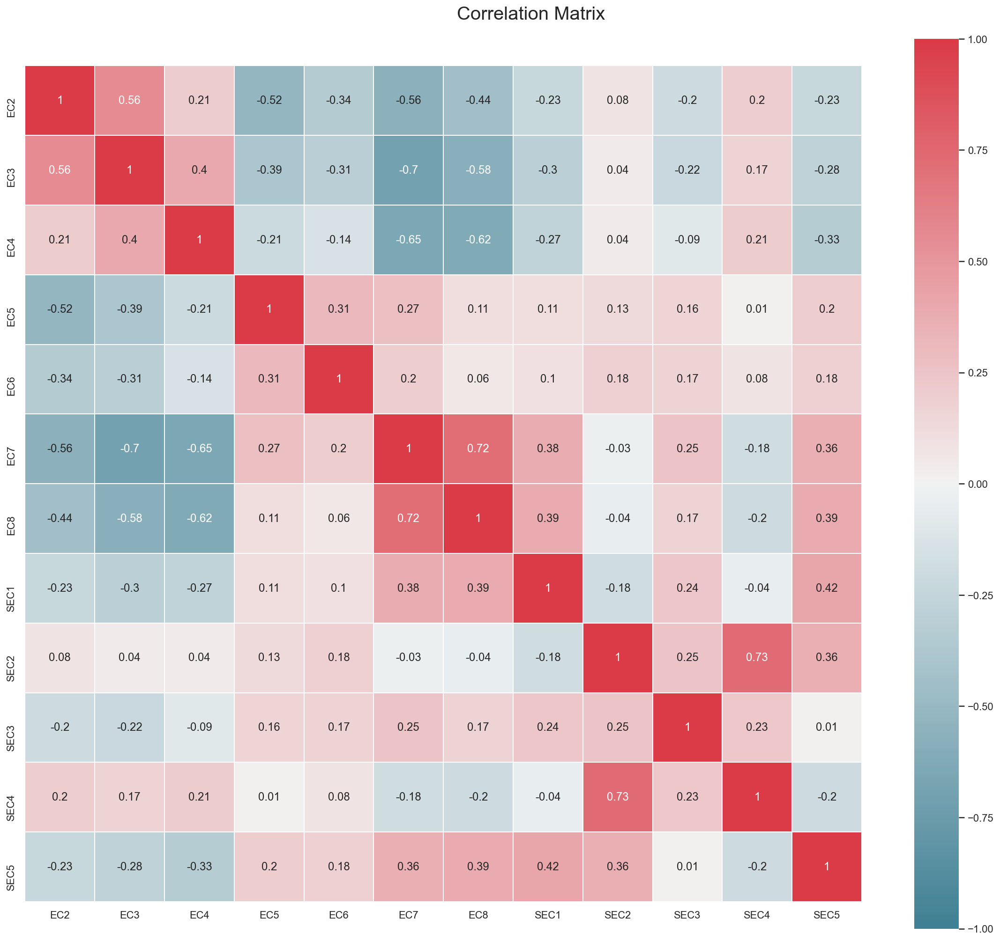

In [82]:
#correlation matrix
df_census_13 = df_census2.loc[:,['EC2','EC3','EC4','EC5','EC6','EC7','EC8','SEC1','SEC2','SEC3','SEC4','SEC5']].copy()
#DROP EC8
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_13.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

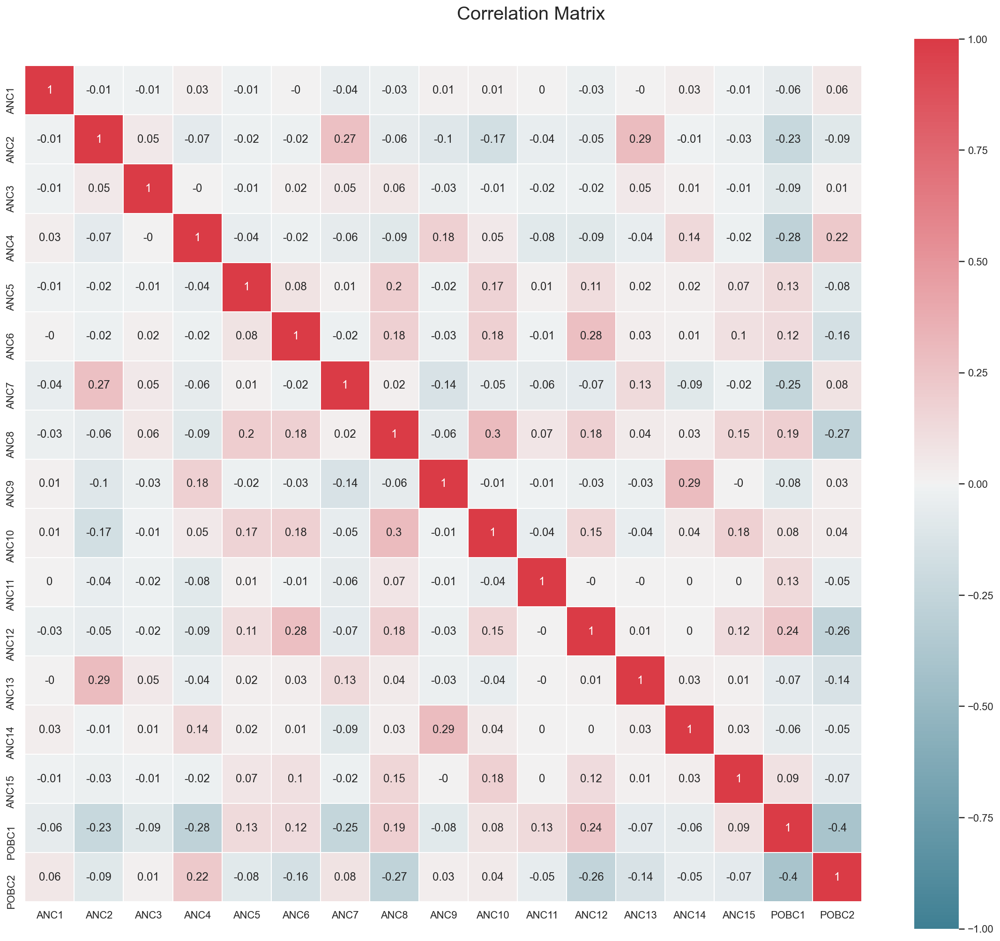

In [83]:
#correlation matrix
df_census_15 = df_census2.loc[:,['ANC1','ANC2','ANC3','ANC4','ANC5','ANC6','ANC7','ANC8','ANC9','ANC10','ANC11','ANC12',
                                'ANC13','ANC14','ANC15','POBC1','POBC2']].copy()
fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_15.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

#run PCA

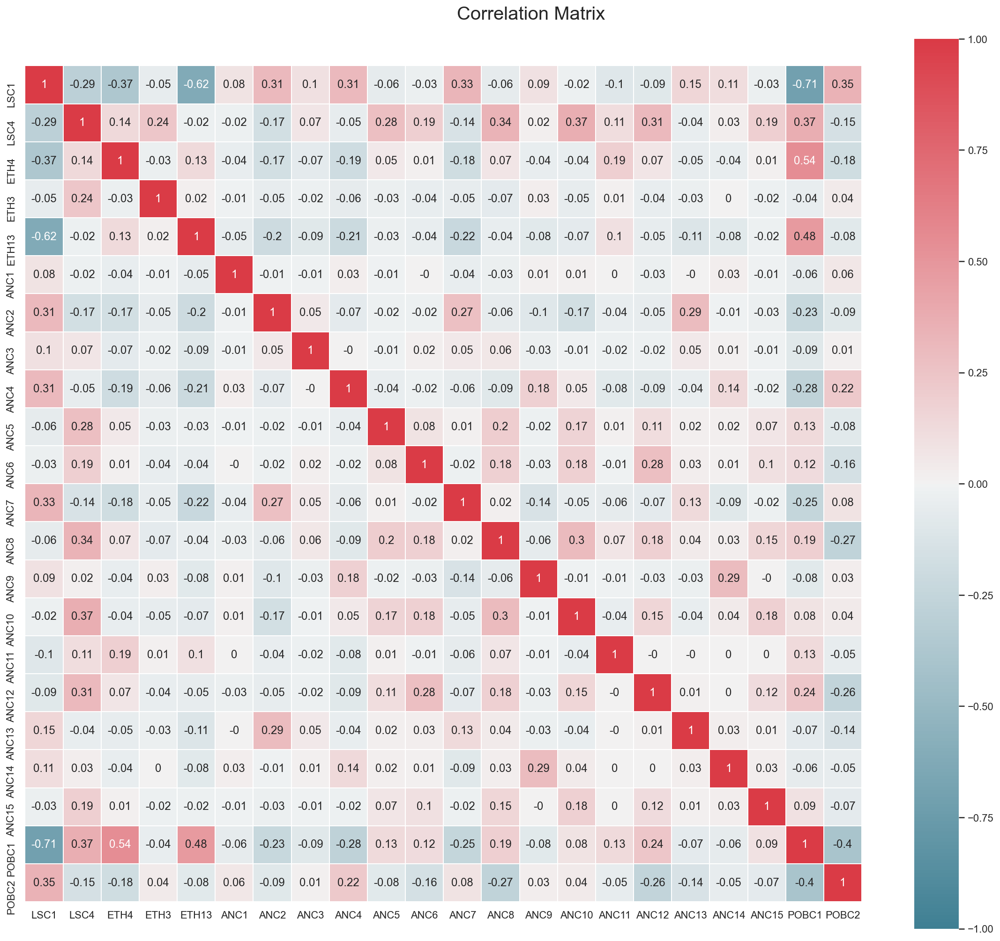

In [84]:
#correlation matrix
df_census_151 = df_census2.loc[:,['LSC1','LSC4','ETH4','ETH3','ETH13','ANC1','ANC2','ANC3','ANC4','ANC5','ANC6','ANC7','ANC8',
                                 'ANC9','ANC10','ANC11','ANC12','ANC13','ANC14','ANC15','POBC1','POBC2']].copy()

fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_151.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

#run PCA

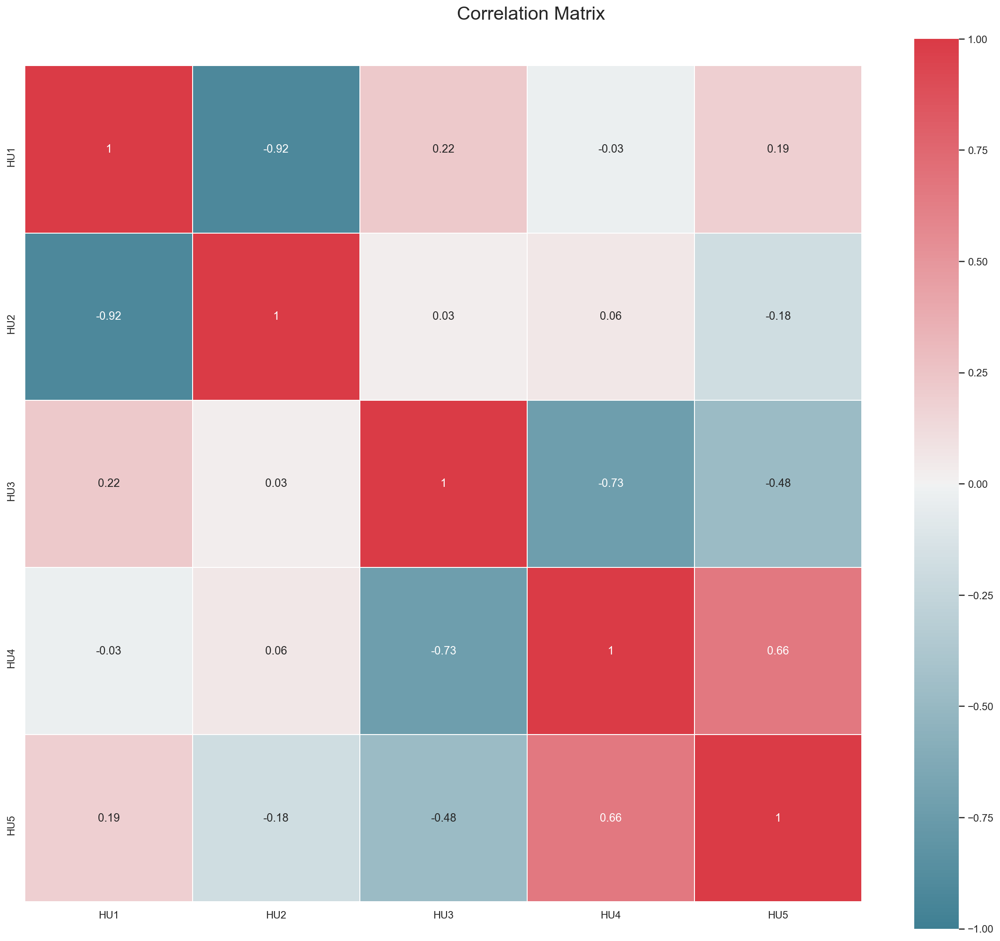

In [85]:
#correlation matrix
df_census_16= df_census2.loc[:,'HU1':'HU5'].copy()

fig = plt.figure(figsize=(20, 16))
correlation = np.round(df_census_16.corr(method="pearson"), decimals=2)
sns.heatmap(data=correlation, annot = correlation.values,cmap=sns.diverging_palette(220, 10, as_cmap=True), 
             vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

#remove HU2,HU4
#keep others

In [86]:
#variables dropped because of high correlation according with our analysis
df_census= df_census.drop(columns=[
#1
'ETHC4','ETHC5','ETHC6','ETHC1','ETHC2','ETHC3',
#2
'ETH7', 'ETH8', 'ETH9', 'ETH5','ETH16','ETH14','ETH15','ETH6','ETH10',
'ETH11','ETH12',
#21
'LSC2','LSC3',
#3
'AGE902','AGE903','AGE905','AGE906',
#4
'LFC2','LFC3','LFC4','LFC5','LFC6',
#5
'HHD3', 'HHD2', 'HHD10','HHD11','HHD12','HHD8','HHD9',
#51
'HHN4', 'HHN6', 'HHN5', 'HHAGE2', 'HHAGE3','HHN3',
#6
'CHILC1','CHILC2','CHILC3','CHILC4','CHILC5',
#8
'DW2','DW3','DW5','DW6','DW8','DW9','HUR2',
#81
'HUPA1','HUPA2',
#9
'HV3','HV4',
#10
'AC1','AC2',
#11
'HV1','HV2','RHP1','RHP2',
#12
'TPE4','TPE12','TPE13',
#13
'EC8',
#16
'HU2','HU4'])

In [87]:
df_census.shape

(90828, 208)

In [88]:
df_census2=df_census.copy()

In [89]:
#Columns dropped due to we had localization in ZIP variable.
df_census2 = df_census2.drop(columns=['MSA','ADI','DMA'])

In [90]:
features = list(df_census2.columns)

In [91]:
#Standardize the data to run PCA. 
sds = StandardScaler()
scaled_feat = sds.fit_transform(df_census2[features])
df_census2[features]= scaled_feat
df_census2.head()

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,LFC1,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,SEC1,SEC2,SEC3,SEC4,SEC5,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2
0,-0.405281,-0.421258,-0.426956,-1.216142,0.673063,0.947465,-0.239520,0.365889,0.322129,-0.384589,-0.221893,-0.411578,0.577270,0.545436,0.569035,0.063442,-1.062946,0.571307,1.040623,-0.191620,-1.055597,-0.444127,0.668595,0.269548,0.077410,1.108404,0.113936,-0.403934,-0.099573,0.196014,-0.818966,0.956476,-0.433735,0.257327,0.333740,1.075590,-0.724459,0.916342,0.739152,0.468963,-0.327529,0.177727,0.337482,0.133020,-0.091729,-0.345885,-0.437124,-0.442899,-0.608180,-0.668467,-0.936832,-0.357957,-0.517502,0.343344,-0.336858,-0.602201,0.385517,-0.564869,-0.614353,-0.540005,-0.845745,-1.072231,-1.297063,-0.143041,-0.221756,-0.417636,-0.257430,-0.327720,-0.345655,-0.576066,0.774655,1.155287,0.614100,-0.116425,-0.795891,-0.666546,-0.489771,-0.195140,-0.877453,1.004715,0.990615,0.626302,-0.175277,-0.698070,-0.671662,-0.486960,-0.054756,0.094417,-0.327655,0.458027,-0.989361,-0.149904,0.198135,-0.908240,0.907033,-0.750957,-0.426478,-0.205692,-0.138106,-0.34486,-0.748303,0.199629,-0.207221,-0.287088,-0.819798,-1.175028,-0.658280,0.220529,0.931958,-1.408380,-0.728836,-0.640475,-1.370056,1.739680,0.098316,-1.149549,-0.423754,0.733893,-0.245420,0.022492,0.618702,2.197010,0.310865,0.100308,-0.034460,-0.294583,-0.843468,2.368565,-1.033128,-1.181729,0.861680,-0.643097,-0.189478,0.115458,-1.036285,1.103268,0.214350,-0.768777,-1.273600,-0.391688,-0.204948,0.698936,-0.949144,-0.509885,-0.482557,0.931548,-0.363553,0.997592,0.016498,0.417973,-1.053690,0.333456,-0.275058,0.815355,0.298781,-0.500274,0.232522,0.524555,-0.907640,0.446462,0.116660,-0.362226,-0.639392,1.538947,-0.269146,-0.333637,0.026919,-0.326122,-0.363887,-0.473442,-0.194154,-0.279646,-0.751935,1.005742,-0.200698,-0.370558,0.772071,-0.013751,0.125239,0.322529,0.872997,-0.117888,1.544806,0.595255,0.393286,0.080056,-0.379172,-0.494327,-0.295746,0.341799,-0.358282,-0.384524,1.080291,-0.575468,-0.714987,-0.474930,-0.142956,-0.515246,-1.730771,1.838303,-0.881622,0.145946,0.434863,-0.616811,-0.397579
1,0.064873,0.051341,-0.107347,0.866184,-0.441039,-0.664492,0.326312,-0.180736,-0.936438,-0.448501,-0.221893,3.990189,-0.270998,-0.065463,-0.554958,1.011099,-0.815237,1.216742,-0.008975,0.142205,-1.055597,1.984794,2.068025,-0.457821,-1.093367,-0.845447,-0.962636,-1.612592,-1.593032,0.833837,-1.500388,-0.903484,0.145168,2.694756,2.069311,1.156881,-0.809679,-0.307058,1.209487,0.548239,-0.232450,1.809378,2.279010,0.934865,-1.021199,-0.750351,3.120177,2.403884,1.711635,1.271330,0.846296,4.830664,-0.659217,2.759589,0.578701,-0.602201,-0.929021,-0.704491,-0.614353,-0.540005,1.911871,1.386717,0.950097,0.722766,4.592108,4.090118,3.960723,3.539037,2.383656,-1.351073,-1.372963,-2.210828,-1.828286,-0.116425,1.427160,3.204727,4.678387,6.663994,-1.044711,-1.192201,-1.905051,-1.880945,-0.364057,1.099932,2.901997,3.800141,5.350109,-1.502367,-0.675023,1.353520,-0.780075,0.479393,-0.428708,-0.322511,0.275994,0.159196,-0.426478,-0.205692,-0.138106,-0.34486,-0.748303,0.75

In [92]:
df_census2.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,LFC1,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,SEC1,SEC2,SEC3,SEC4,SEC5,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2
count,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828
mean,-1.41287e-17,1.39184e-17,-8.77797e-18,-8.62284e-17,5.24677e-15,1.69361e-15,-3.71657e-17,9.63239e-16,4.37881e-16,9.02193e-16,1.00588e-15,2.9737e-15,1.81653e-15,3.58254e-16,-1.04766e-17,-3.72323e-18,-1.85865e-15,2.42621e-16,-9.16244e-17,4.45664e-18,1.30235e-16,2.62699e-16,-3.96424e-16,-4.3168e-17,3.62951e-16,-5.10777e-17,5.09116e-16,-1.71959e-15,2.67521e-16,2.07435e-16,-1.64964e-16,3.88488e-16,-7.35186e-17,2.80159e-17,5.25293e-16,-2.30931e-16,-1.18065e-17,-6.27492e-16,-3.01262e-16,5.4837e-16,-6.12757e-16,-6.46102e-17,4.29847e-17,-1.33352e-16,1.5444e-16,-1.02622e-15,-1.17431e-15,4.87067e-17,-2.92655e-17,8.95239e-18,-1.42221e-16,2.71076e-15,-3.13644e-16,-7.1091e-18,1.33416e-15,1.01496e-15,2.31597e-16,-2.44483e-16,-2.42856e-16,-1.21801e-15,-4.84962e-17,-1.59888e-16,4.3014e-17,1.44376e-16,1.81554e-16,7.87502e-17,8.95923e-17,4.6956e-18,1.44042e-16,1.01234e-16,1.22837e-16,3.93442e-16,-1.36795e-16,-6.90473e-17,1.75541e-16,-9.51747e-16,1.18314e-15,4.58828e-16,1.05219e-16,3.60308e-17,-1.36419e-16,-9.5562e-17,-2.52046e-17,-2.30114e-15,-1.12832e-16,-1.71319e-16,5.19021e-16,3.81479e-17,2.67731e-16,-4.97845e-17,5.27413e-17,-4.83972e-17,1.07272e-17,2.71735e-16,-5.13438e-16,-2.62993e-16,-6.25792e-16,-2.05324e-15,-4.3444e-15,-3.20459e-16,-1.03414e-16,3.76701e-16,-5.65758e-16,1.15228e-16,4.86918e-16,-4.97648e-16,-4.67755e-16,1.45683e-16,2.41474e-16,-5.53708e-16,3.60482e-16,3.30319e-16,1.75589e-17,-8.1201e-16,-2.34435e-17,1.03389e-15,5.59435e-16,-8.69431e-16,-6.79545e-17,-3.56404e-16,-3.51033e-16,4.96831e-17,-5.41843e-17,-9.56681e-16,4.32945e-16,-1.95189e-15,5.05403e-16,2.70662e-16,-4.95412e-16,6.68664e-16,-3.54465e-16,-1.83319e-16,7.2245e-16,-7.37258e-16,-3.59905e-17,-1.31976e-15,-3.3

In [93]:
#Population Age (Percent)

df_census17 = df_census2.loc[:,['AGEC1','AGEC2','AGEC3','AGEC4','AGEC5','AGEC6','AGEC7','AGE907']].copy()

In [94]:
pca = PCA()
pca_feat17 = pca.fit_transform(df_census17)

In [95]:
cov_matrix17 = df_census17.cov()
cov_matrix17

,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,AGE907
AGEC1,1.000011,0.348006,-0.061090,-0.172851,-0.383969,-0.421765,-0.294415,0.147322
AGEC2,0.348006,1.000011,0.335971,-0.218182,-0.563284,-0.592932,-0.449433,0.385749
AGEC3,-0.061090,0.335971,1.000011,0.514919,-0.261085,-0.561671,-0.553636,0.630152
AGEC4,-0.172851,-0.218182,0.514919,1.000011,0.342858,-0.200133,-0.375090,0.343834
AGEC5,-0.383969,-0.563284,-0.261085,0.342858,1.000011,0.622926,0.167033,-0.187160
AGEC6,-0.421765,-0.592932,-0.561671,-0.200133,0.622926,1.000011,0.633765,-0.481096
AGEC7,-0.294415,-0.449433,-0.553636,-0.375090,0.167033,0.633765,1.000011,-0.470865
AGE907,0.147322,0.385749,0.630152,0.343834,-0.187160,-0.481096,-0.470865,1.000011


In [96]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix17.index, 
             columns=cov_matrix17.columns)

,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,AGE907
AGEC1,1.000011,0.348006,-0.061090,-0.172851,-0.383969,-0.421765,-0.294415,0.147322
AGEC2,0.348006,1.000011,0.335971,-0.218182,-0.563284,-0.592932,-0.449433,0.385749
AGEC3,-0.061090,0.335971,1.000011,0.514919,-0.261085,-0.561671,-0.553636,0.630152
AGEC4,-0.172851,-0.218182,0.514919,1.000011,0.342858,-0.200133,-0.375090,0.343834
AGEC5,-0.383969,-0.563284,-0.261085,0.342858,1.000011,0.622926,0.167033,-0.187160
AGEC6,-0.421765,-0.592932,-0.561671,-0.200133,0.622926,1.000011,0.633765,-0.481096
AGEC7,-0.294415,-0.449433,-0.553636,-0.375090,0.167033,0.633765,1.000011,-0.470865
AGE907,0.147322,0.385749,0.630152,0.343834,-0.187160,-0.481096,-0.470865,1.000011


In [97]:
pd.DataFrame(df_census17.values @ pca.components_.T, 
             index=df_census17.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,1.077312,0.598209,0.093254,0.432553,-1.023651,0.374095,-0.446831,0.069185
1,-2.080381,2.293833,0.232022,1.279409,-1.016303,-0.348932,0.235920,-0.046207
2,0.268003,0.257973,0.464321,0.239915,-0.047098,0.225567,-0.176987,0.005233
3,-0.435387,-0.082734,0.694051,0.107863,-0.002031,0.702624,-0.574442,-0.148988
4,0.894021,0.655229,1.465385,-1.270021,0.442261,0.228426,-0.726444,0.403479
...,...,...,...,...,...,...,...,...
95406,0.437136,1.276486,0.406331,0.229670,0.555112,0.324774,-0.155239,-0.291127
95407,-2.453915,-0.394898,0.039995,0.061839,0.141116,0.108578,-0.127513,-0.070591
95408,-3.198210,1.933583,-1.630000,0.613403,-1.176453,-1.224307,0.978106,0.439409
95409,-1.405975,-1.233672,-0.687009,-1.215742,0.322773,-0.241949,-0.156083,-0.108882


In [98]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.538466,0.000000,0.442303,0.442303
2,1.940546,-1.597920,0.242566,0.684869
3,0.832262,-1.108284,0.104032,0.788901
4,0.553044,-0.279218,0.069130,0.858030
5,0.514918,-0.038125,0.064364,0.922394
6,0.257823,-0.257096,0.032227,0.954622
7,0.227213,-0.030610,0.028401,0.983023
8,0.135816,-0.091397,0.016977,1.000000


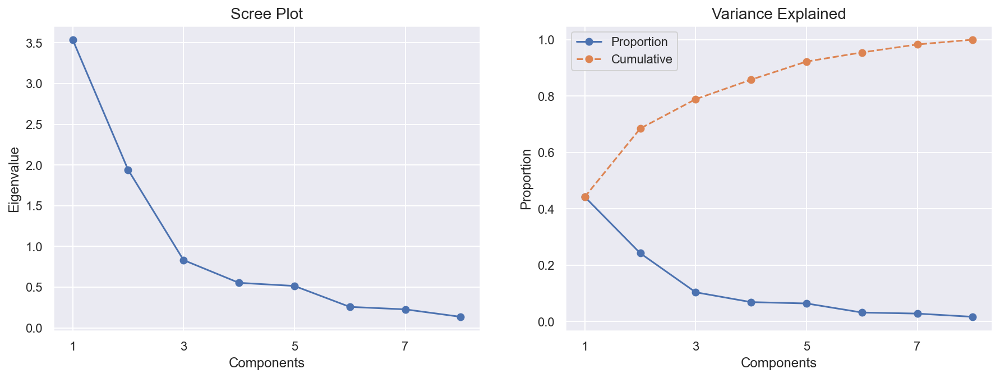

In [99]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [100]:
# Perform PCA again with the number of principal components you want to retain
pca_features17 = list(df_census17.columns)
pca17 = PCA(n_components=3)
pca_feat17 = pca17.fit_transform(df_census17[pca_features17])
pca_feat_names17 = [f"PC{i}" for i in range(pca17.n_components_)]
pca_df17 = pd.DataFrame(pca_feat17, index=df_census17.index, columns=pca_feat_names17)
pca_df17

,PC0,PC1,PC2
0,1.077312,0.598209,0.093254
1,-2.080381,2.293833,0.232022
2,0.268003,0.257973,0.464321
3,-0.435387,-0.082734,0.694051
4,0.894021,0.655229,1.465385
...,...,...,...
95406,0.437136,1.276486,0.406331
95407,-2.453915,-0.394898,0.039995
95408,-3.198210,1.933583,-1.630000
95409,-1.405975,-1.233672,-0.687009


In [101]:
df_census17_pca = pd.concat([df_census17, pca_df17], axis=1)

In [102]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census17_pca[pca_features17 + pca_feat_names17].corr().loc[pca_features17, pca_feat_names17]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2
AGEC1,-0.429809,-0.517265,0.670670
AGEC2,-0.716187,-0.414620,-0.195044
AGEC3,-0.737726,0.471566,-0.300522
AGEC4,-0.259210,0.858505,0.219095
AGEC5,0.586366,0.610179,0.307461
AGEC6,0.892025,0.111503,-0.043319
AGEC7,0.768252,-0.235764,-0.310830
AGE907,-0.706819,0.318294,-0.114333


In [103]:
#Home Value (Percent)

df_census31= df_census2.loc[:,['HVP1','HVP2','HVP3','HVP4','HVP5','HVP6']].copy()

In [104]:
df_census31

,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6
0,-0.437124,-0.442899,-0.608180,-0.668467,-0.936832,-0.357957
1,3.120177,2.403884,1.711635,1.271330,0.846296,4.830664
2,-0.512014,-0.630599,-0.799224,-0.914357,-0.833960,-0.357957
3,-0.137562,0.120201,0.401622,0.479019,0.606259,0.194024
4,-0.512014,-0.630599,-0.908392,-0.968999,-0.251014,-0.357957
...,...,...,...,...,...,...
95406,-0.287343,-0.349049,-0.335261,-0.122045,0.434805,-0.357957
95407,-0.437124,-0.349049,0.374330,0.588303,0.606259,-0.357957
95408,0.162001,1.559234,1.438716,1.080083,0.777714,-0.081966
95409,-0.512014,-0.661882,-0.962976,-1.378815,-2.239888,-0.357957


In [105]:
pca = PCA()
pca_feat31 = pca.fit_transform(df_census31)

In [106]:
cov_matrix31 = df_census31.cov()
cov_matrix31

,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6
HVP1,1.000011,0.936227,0.765792,0.602522,0.406582,0.872027
HVP2,0.936227,1.000011,0.899517,0.734599,0.507497,0.739354
HVP3,0.765792,0.899517,1.000011,0.914256,0.675843,0.569711
HVP4,0.602522,0.734599,0.914256,1.000011,0.850339,0.438146
HVP5,0.406582,0.507497,0.675843,0.850339,1.000011,0.291206
HVP6,0.872027,0.739354,0.569711,0.438146,0.291206,1.000011


In [107]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix31.index, 
             columns=cov_matrix31.columns)

,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6
HVP1,1.000011,0.936227,0.765792,0.602522,0.406582,0.872027
HVP2,0.936227,1.000011,0.899517,0.734599,0.507497,0.739354
HVP3,0.765792,0.899517,1.000011,0.914256,0.675843,0.569711
HVP4,0.602522,0.734599,0.914256,1.000011,0.850339,0.438146
HVP5,0.406582,0.507497,0.675843,0.850339,1.000011,0.291206
HVP6,0.872027,0.739354,0.569711,0.438146,0.291206,1.000011


In [108]:
pd.DataFrame(df_census31.values @ pca.components_.T, 
             index=df_census31.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5
0,-1.380912,0.477246,-0.248511,-0.081814,-0.048263,0.065528
1,5.724080,2.915560,1.526200,-0.681078,0.214253,0.083822
2,-1.650473,0.482463,-0.015863,0.026173,0.020955,-0.005987
3,0.649755,-0.543775,0.194064,-0.196381,0.182876,0.042232
4,-1.525461,0.178443,0.367451,0.320774,0.134343,-0.015867
...,...,...,...,...,...,...
95406,-0.461736,-0.520375,0.327045,0.238972,0.001838,-0.028714
95407,0.147036,-1.078759,0.049823,-0.299778,0.017601,-0.129692
95408,2.096543,-0.803506,-0.910927,0.088125,0.512595,0.405059
95409,-2.406352,1.520163,-0.689748,-0.292174,-0.101324,0.033444


In [109]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,4.446049,0.000000,0.741000,0.741000
2,1.079002,-3.367047,0.179832,0.920832
3,0.312595,-0.766408,0.052099,0.972930
4,0.113704,-0.198891,0.018950,0.991881
5,0.033957,-0.079747,0.005659,0.997540
6,0.014759,-0.019199,0.002460,1.000000


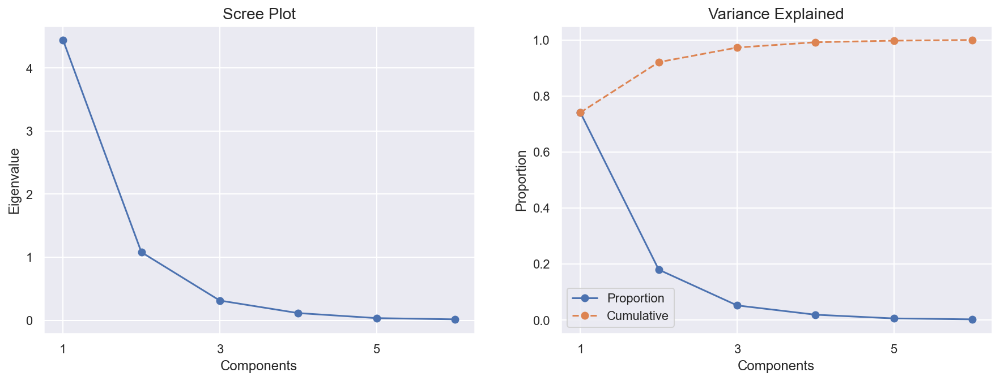

In [110]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [111]:
# Perform PCA again with the number of principal components you want to retain
pca_features31 = list(df_census31.columns)
pca31 = PCA(n_components=2)
pca_feat31 = pca31.fit_transform(df_census31[pca_features31])
pca_feat_names31 = [f"PC{i}" for i in range(pca31.n_components_)]
pca_df31 = pd.DataFrame(pca_feat31, index=df_census31.index, columns=pca_feat_names31)
pca_df31

,PC0,PC1
0,-1.380912,0.477246
1,5.724080,2.915560
2,-1.650473,0.482463
3,0.649755,-0.543775
4,-1.525461,0.178443
...,...,...
95406,-0.461736,-0.520375
95407,0.147036,-1.078759
95408,2.096543,-0.803506
95409,-2.406352,1.520163


In [112]:
df_census31_pca = pd.concat([df_census31, pca_df31], axis=1)

In [113]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census31_pca[pca_features31 + pca_feat_names31].corr().loc[pca_features31, pca_feat_names31]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1
HVP1,0.896471,0.403762
HVP2,0.945280,0.195793
HVP3,0.944514,-0.152984
HVP4,0.880801,-0.431146
HVP5,0.711615,-0.610792
HVP6,0.757940,0.543392


In [114]:
#Renters (Percent)

df_census39= df_census2.loc[:,['RP1','RP2','RP3','RP4']].copy()

In [115]:
pca = PCA()
pca_feat39 = pca.fit_transform(df_census39)

In [116]:
cov_matrix39 = df_census39.cov()
cov_matrix39

,RP1,RP2,RP3,RP4
RP1,1.000011,0.919728,0.751460,0.571107
RP2,0.919728,1.000011,0.899729,0.716482
RP3,0.751460,0.899729,1.000011,0.888050
RP4,0.571107,0.716482,0.888050,1.000011


In [117]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix39.index, 
             columns=cov_matrix39.columns)

,RP1,RP2,RP3,RP4
RP1,1.000011,0.919728,0.751460,0.571107
RP2,0.919728,1.000011,0.899729,0.716482
RP3,0.751460,0.899729,1.000011,0.888050
RP4,0.571107,0.716482,0.888050,1.000011


In [118]:
pd.DataFrame(df_census39.values @ pca.components_.T, 
             index=df_census39.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3
0,1.715556,0.412705,0.621967,-0.259795
1,-2.482148,-0.860381,0.310551,0.074520
2,2.477736,-0.399417,0.136519,-0.106020
3,2.438638,-0.687972,-0.263727,0.013991
4,-0.522083,0.245568,-0.340224,-0.161907
...,...,...,...,...
95406,0.252325,0.383117,-0.348488,0.101164
95407,-2.123666,-0.286762,0.079517,-0.025544
95408,0.646577,0.344020,0.287311,-0.109091
95409,-0.053013,1.126349,-0.332709,0.089564


In [119]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.381717,0.000000,0.845420,0.845420
2,0.501865,-2.879852,0.125465,0.970885
3,0.089218,-0.412647,0.022304,0.993189
4,0.027244,-0.061974,0.006811,1.000000


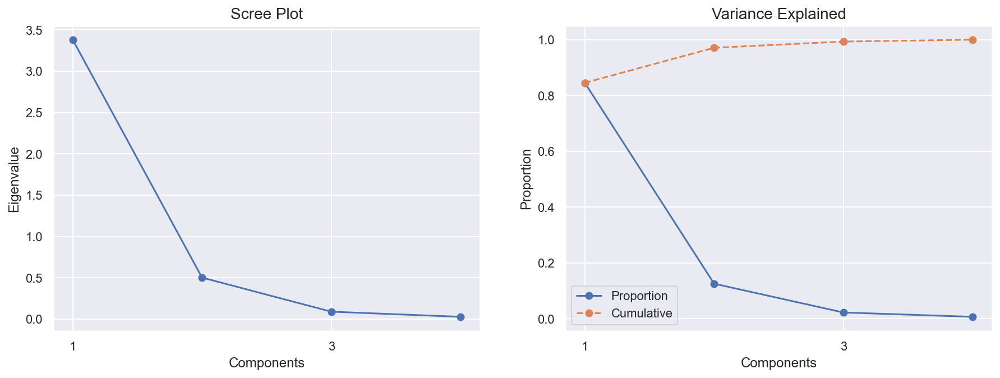

In [120]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [121]:
# Perform PCA again with the number of principal components you want to retain
pca_features39 = list(df_census39.columns)
pca39 = PCA(n_components=1)
pca_feat39 = pca39.fit_transform(df_census39[pca_features39])
pca_feat_names39 = [f"PC{i}" for i in range(pca39.n_components_)]
pca_df39 = pd.DataFrame(pca_feat39, index=df_census39.index, columns=pca_feat_names39)
pca_df39

,PC0
0,1.715556
1,-2.482148
2,2.477736
3,2.438638
4,-0.522083
...,...
95406,0.252325
95407,-2.123666
95408,0.646577
95409,-0.053013


In [122]:
df_census39_pca = pd.concat([df_census39, pca_df39], axis=1)

In [123]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census39_pca[pca_features39 + pca_feat_names39].corr().loc[pca_features39, pca_feat_names39]
loadings.style.applymap(_color_red_or_green)

,PC0
RP1,-0.883176
RP2,-0.964407
RP3,-0.964157
RP4,-0.861394


In [124]:
#Households Income (Percent)

df_census41= df_census2.loc[:,'IC6':'IC14'].copy()

In [125]:
pca = PCA()
pca_feat41 = pca.fit_transform(df_census41)

In [126]:
cov_matrix41 = df_census41.cov()
cov_matrix41

,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14
IC6,1.000011,0.485337,0.069618,-0.455184,-0.705760,-0.591780,-0.459107,-0.363173,-0.304017
IC7,0.485337,1.000011,0.342140,-0.191145,-0.611656,-0.617394,-0.519135,-0.421139,-0.375698
IC8,0.069618,0.342140,1.000011,0.145492,-0.275519,-0.434286,-0.423996,-0.362955,-0.352781
IC9,-0.455184,-0.191145,0.145492,1.000011,0.331317,0.024043,-0.119351,-0.145767,-0.201201
IC10,-0.705760,-0.611656,-0.275519,0.331317,1.000011,0.591151,0.380061,0.255824,0.128304
IC11,-0.591780,-0.617394,-0.434286,0.024043,0.591151,1.000011,0.653803,0.517315,0.399449
IC12,-0.459107,-0.519135,-0.423996,-0.119351,0.380061,0.653803,1.000011,0.609126,0.575431
IC13,-0.363173,-0.421139,-0.362955,-0.145767,0.255824,0.517315,0.609126,1.000011,0.594302
IC14,-0.304017,-0.375698,-0.352781,-0.201201,0.128304,0.399449,0.575431,0.594302,1.000011


In [127]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix41.index, 
             columns=cov_matrix41.columns)

,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14
IC6,1.000011,0.485337,0.069618,-0.455184,-0.705760,-0.591780,-0.459107,-0.363173,-0.304017
IC7,0.485337,1.000011,0.342140,-0.191145,-0.611656,-0.617394,-0.519135,-0.421139,-0.375698
IC8,0.069618,0.342140,1.000011,0.145492,-0.275519,-0.434286,-0.423996,-0.362955,-0.352781
IC9,-0.455184,-0.191145,0.145492,1.000011,0.331317,0.024043,-0.119351,-0.145767,-0.201201
IC10,-0.705760,-0.611656,-0.275519,0.331317,1.000011,0.591151,0.380061,0.255824,0.128304
IC11,-0.591780,-0.617394,-0.434286,0.024043,0.591151,1.000011,0.653803,0.517315,0.399449
IC12,-0.459107,-0.519135,-0.423996,-0.119351,0.380061,0.653803,1.000011,0.609126,0.575431
IC13,-0.363173,-0.421139,-0.362955,-0.145767,0.255824,0.517315,0.609126,1.000011,0.594302
IC14,-0.304017,-0.375698,-0.352781,-0.201201,0.128304,0.399449,0.575431,0.594302,1.000011


In [128]:
pd.DataFrame(df_census41.values @ pca.components_.T, 
             index=df_census41.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-1.225201,-1.091617,1.016858,0.084844,0.300323,-0.258982,0.306661,-0.113496,0.121873
1,6.969026,5.301996,2.819116,1.997142,-0.186461,-0.723717,1.169557,-0.027302,-0.126216
2,-1.421397,0.257217,0.106535,-0.287984,-0.583500,-0.043080,0.204986,0.014662,-0.092841
3,0.498528,-0.384723,-1.665353,1.644935,-0.340131,-0.370618,0.467863,0.161578,-0.235578
4,-1.965782,0.639270,1.075154,-0.521440,0.609028,-0.392044,0.047075,0.611356,0.112283
...,...,...,...,...,...,...,...,...,...
95406,-0.821190,-0.411671,-0.070423,0.663793,0.355665,-0.146627,-0.551509,-0.567439,0.028135
95407,1.704756,-0.419472,-0.234411,-0.210581,0.350341,0.240488,-0.214286,0.424596,-0.037390
95408,4.780002,2.844686,0.207554,-1.041670,0.407692,-1.814419,-1.704883,1.709674,-0.039667
95409,-1.367097,-0.052383,0.619716,-0.144795,0.651517,-0.307611,-0.279628,-0.697124,0.078550


In [129]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,4.172813,0.000000,0.463641,0.463641
2,1.798653,-2.374161,0.199848,0.663489
3,0.821106,-0.977546,0.091233,0.754722
4,0.572087,-0.249020,0.063564,0.818286
5,0.460792,-0.111295,0.051199,0.869485
6,0.395362,-0.065429,0.043929,0.913414
7,0.358387,-0.036976,0.039820,0.953234
8,0.276924,-0.081463,0.030769,0.984003
9,0.143975,-0.132949,0.015997,1.000000


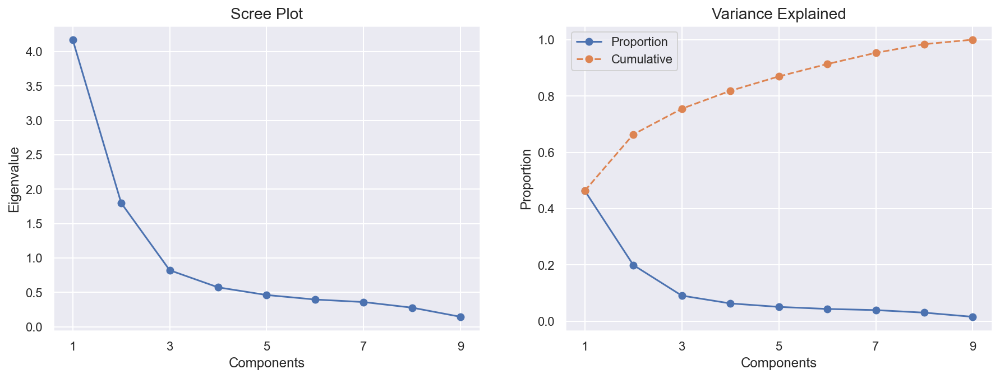

In [130]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [131]:
# Perform PCA again with the number of principal components you want to retain
pca_features41 = list(df_census41.columns)
pca41 = PCA(n_components=4)
pca_feat41 = pca41.fit_transform(df_census41[pca_features41])
pca_feat_names41 = [f"PC{i}" for i in range(pca41.n_components_)]
pca_df41 = pd.DataFrame(pca_feat41, index=df_census41.index, columns=pca_feat_names41)
pca_df41

,PC0,PC1,PC2,PC3
0,-1.225201,-1.091617,1.016858,0.084844
1,6.969026,5.301996,2.819116,1.997142
2,-1.421397,0.257217,0.106535,-0.287984
3,0.498528,-0.384723,-1.665353,1.644935
4,-1.965782,0.639270,1.075154,-0.521440
...,...,...,...,...
95406,-0.821190,-0.411671,-0.070423,0.663793
95407,1.704756,-0.419472,-0.234411,-0.210581
95408,4.780002,2.844686,0.207554,-1.041670
95409,-1.367097,-0.052383,0.619716,-0.144795


In [132]:
df_census41_pca = pd.concat([df_census41, pca_df41], axis=1)

In [133]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census41_pca[pca_features41 + pca_feat_names41].corr().loc[pca_features41, pca_feat_names41]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3
IC6,-0.717920,0.512683,-0.277755,0.047213
IC7,-0.774692,0.172701,0.151743,0.015391
IC8,-0.530746,-0.362038,0.645176,-0.358378
IC9,0.102499,-0.833985,0.088535,0.481606
IC10,0.703415,-0.503811,-0.228313,-0.192395
IC11,0.850026,-0.023716,-0.127180,-0.261700
IC12,0.807043,0.267627,0.106786,-0.105570
IC13,0.708823,0.367562,0.287869,0.095918
IC14,0.627637,0.467169,0.366414,0.288768


In [134]:
##Families Income (Percent)

df_census42= df_census2.loc[:,'IC15':'IC23'].copy()

In [135]:
pca = PCA()
pca_feat42 = pca.fit_transform(df_census42)

In [136]:
cov_matrix42 = df_census42.cov()
cov_matrix42

,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23
IC15,1.000011,0.491745,0.170961,-0.319068,-0.630405,-0.527700,-0.406374,-0.315871,-0.275113
IC16,0.491745,1.000011,0.355894,-0.123853,-0.602913,-0.595504,-0.490088,-0.388929,-0.361447
IC17,0.170961,0.355894,1.000011,0.105794,-0.368216,-0.495515,-0.457346,-0.376335,-0.372472
IC18,-0.319068,-0.123853,0.105794,1.000011,0.161852,-0.127131,-0.235680,-0.231286,-0.279747
IC19,-0.630405,-0.602913,-0.368216,0.161852,1.000011,0.505936,0.301973,0.184135,0.071603
IC20,-0.527700,-0.595504,-0.495515,-0.127131,0.505936,1.000011,0.593409,0.455622,0.359357
IC21,-0.406374,-0.490088,-0.457346,-0.235680,0.301973,0.593409,1.000011,0.549169,0.539821
IC22,-0.315871,-0.388929,-0.376335,-0.231286,0.184135,0.455622,0.549169,1.000011,0.552927
IC23,-0.275113,-0.361447,-0.372472,-0.279747,0.071603,0.359357,0.539821,0.552927,1.000011


In [137]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix42.index, 
             columns=cov_matrix42.columns)

,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23
IC15,1.000011,0.491745,0.170961,-0.319068,-0.630405,-0.527700,-0.406374,-0.315871,-0.275113
IC16,0.491745,1.000011,0.355894,-0.123853,-0.602913,-0.595504,-0.490088,-0.388929,-0.361447
IC17,0.170961,0.355894,1.000011,0.105794,-0.368216,-0.495515,-0.457346,-0.376335,-0.372472
IC18,-0.319068,-0.123853,0.105794,1.000011,0.161852,-0.127131,-0.235680,-0.231286,-0.279747
IC19,-0.630405,-0.602913,-0.368216,0.161852,1.000011,0.505936,0.301973,0.184135,0.071603
IC20,-0.527700,-0.595504,-0.495515,-0.127131,0.505936,1.000011,0.593409,0.455622,0.359357
IC21,-0.406374,-0.490088,-0.457346,-0.235680,0.301973,0.593409,1.000011,0.549169,0.539821
IC22,-0.315871,-0.388929,-0.376335,-0.231286,0.184135,0.455622,0.549169,1.000011,0.552927
IC23,-0.275113,-0.361447,-0.372472,-0.279747,0.071603,0.359357,0.539821,0.552927,1.000011


In [138]:
pd.DataFrame(df_census42.values @ pca.components_.T, 
             index=df_census42.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-1.223283,-0.835710,1.058767,0.169289,0.692630,-0.456149,0.564827,0.089901,0.053209
1,5.929150,4.424291,2.271463,-1.098716,-0.294524,-0.450129,1.055282,-0.047319,-0.086782
2,-1.460375,0.101958,0.234262,0.563741,-0.350753,0.011786,0.287706,-0.024737,-0.047183
3,0.386397,0.693541,-2.070852,-0.401803,-1.837660,0.200863,0.908751,0.017678,-0.268652
4,-1.924777,1.147527,0.402297,0.200502,0.606413,-0.461643,0.008148,0.696434,-0.070695
...,...,...,...,...,...,...,...,...,...
95406,-1.340590,0.026166,-0.177840,-0.488566,0.272765,-0.126103,0.031962,-0.157713,0.010056
95407,1.561638,-0.303961,-0.581471,0.072923,0.287688,0.161753,-0.386227,0.581188,-0.039422
95408,5.028555,2.703486,-0.639946,1.383379,-0.168012,-1.308433,-2.333200,1.285773,-0.104196
95409,-0.682715,0.955796,-0.781609,0.583911,-0.315727,-0.293829,-0.032709,-1.416990,-0.040614


In [139]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.992003,0.000000,0.443551,0.443551
2,1.722980,-2.269023,0.191440,0.634991
3,0.802834,-0.920147,0.089203,0.724194
4,0.647673,-0.155161,0.071963,0.796157
5,0.472670,-0.175004,0.052518,0.848675
6,0.446830,-0.025839,0.049647,0.898322
7,0.429700,-0.017130,0.047744,0.946066
8,0.341531,-0.088169,0.037947,0.984014
9,0.143877,-0.197653,0.015986,1.000000


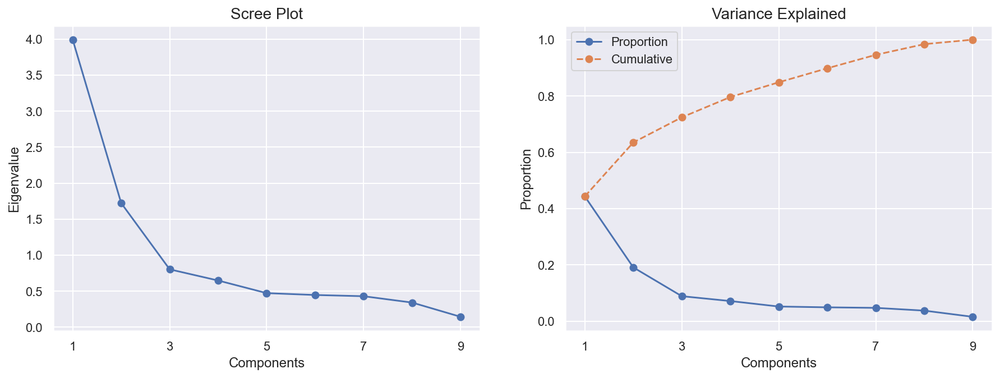

In [140]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [141]:
# Perform PCA again with the number of principal components you want to retain
pca_features42 = list(df_census42.columns)
pca42 = PCA(n_components=4)
pca_feat42 = pca42.fit_transform(df_census42[pca_features42])
pca_feat_names42 = [f"PC{i}" for i in range(pca42.n_components_)]
pca_df42 = pd.DataFrame(pca_feat42, index=df_census42.index, columns=pca_feat_names42)
pca_df42

,PC0,PC1,PC2,PC3
0,-1.223283,-0.835710,1.058767,0.169289
1,5.929150,4.424291,2.271463,-1.098716
2,-1.460375,0.101958,0.234262,0.563741
3,0.386397,0.693541,-2.070852,-0.401803
4,-1.924777,1.147527,0.402297,0.200502
...,...,...,...,...
95406,-1.340590,0.026166,-0.177840,-0.488566
95407,1.561638,-0.303961,-0.581471,0.072923
95408,5.028555,2.703486,-0.639946,1.383379
95409,-0.682715,0.955796,-0.781609,0.583911


In [142]:
df_census42_pca = pd.concat([df_census42, pca_df42], axis=1)

In [143]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census42_pca[pca_features42 + pca_feat_names42].corr().loc[pca_features42, pca_feat_names42]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3
IC15,-0.667938,0.509867,-0.320291,-0.139606
IC16,-0.766026,0.272677,0.004739,-0.046708
IC17,-0.630589,-0.162781,0.516296,0.526807
IC18,-0.092070,-0.797709,0.279875,-0.478983
IC19,0.642531,-0.542657,-0.290030,0.191831
IC20,0.821216,-0.038740,-0.196653,0.190259
IC21,0.784685,0.266120,0.068998,0.064393
IC22,0.680159,0.370271,0.298274,-0.078297
IC23,0.622346,0.471072,0.372569,-0.189130


In [144]:
#Transportation to work (Percent)

df_census60 = df_census2.loc[:,['TPE1','TPE2','TPE3','TPE5','TPE6','TPE7','TPE8','TPE9','TPE10','TPE11']].copy()

In [145]:
pca = PCA()
pca_feat60 = pca.fit_transform(df_census60)

In [146]:
cov_matrix60 = df_census60.cov()
cov_matrix60

,TPE1,TPE2,TPE3,TPE5,TPE6,TPE7,TPE8,TPE9,TPE10,TPE11
TPE1,1.000011,-0.356136,-0.422157,-0.188243,-0.137374,-0.066174,-0.474064,-0.195255,0.097038,0.123048
TPE2,-0.356136,1.000011,-0.012703,-0.082401,-0.006689,0.004898,-0.008116,-0.104517,0.132984,0.212816
TPE3,-0.422157,-0.012703,1.000011,0.593543,0.258176,0.041937,0.160634,-0.069053,0.200234,0.225990
TPE5,-0.188243,-0.082401,0.593543,1.000011,0.054677,-0.017292,0.031386,-0.031550,0.193140,0.231318
TPE6,-0.137374,-0.006689,0.258176,0.054677,1.000011,0.026088,0.100223,0.004078,-0.008955,0.013948
TPE7,-0.066174,0.004898,0.041937,-0.017292,0.026088,1.000011,0.061287,-0.030445,-0.007313,0.002354
TPE8,-0.474064,-0.008116,0.160634,0.031386,0.100223,0.061287,1.000011,0.124068,-0.267817,-0.222226
TPE9,-0.195255,-0.104517,-0.069053,-0.031550,0.004078,-0.030445,0.124068,1.000011,-0.142627,-0.008772
TPE10,0.097038,0.132984,0.200234,0.193140,-0.008955,-0.007313,-0.267817,-0.142627,1.000011,0.820131
TPE11,0.123048,0.212816,0.225990,0.231318,0.013948,0.002354,-0.222226,-0.008772,0.820131,1.000011


In [147]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix60.index, 
             columns=cov_matrix60.columns)

,TPE1,TPE2,TPE3,TPE5,TPE6,TPE7,TPE8,TPE9,TPE10,TPE11
TPE1,1.000011,-0.356136,-0.422157,-0.188243,-0.137374,-0.066174,-0.474064,-0.195255,0.097038,0.123048
TPE2,-0.356136,1.000011,-0.012703,-0.082401,-0.006689,0.004898,-0.008116,-0.104517,0.132984,0.212816
TPE3,-0.422157,-0.012703,1.000011,0.593543,0.258176,0.041937,0.160634,-0.069053,0.200234,0.225990
TPE5,-0.188243,-0.082401,0.593543,1.000011,0.054677,-0.017292,0.031386,-0.031550,0.193140,0.231318
TPE6,-0.137374,-0.006689,0.258176,0.054677,1.000011,0.026088,0.100223,0.004078,-0.008955,0.013948
TPE7,-0.066174,0.004898,0.041937,-0.017292,0.026088,1.000011,0.061287,-0.030445,-0.007313,0.002354
TPE8,-0.474064,-0.008116,0.160634,0.031386,0.100223,0.061287,1.000011,0.124068,-0.267817,-0.222226
TPE9,-0.195255,-0.104517,-0.069053,-0.031550,0.004078,-0.030445,0.124068,1.000011,-0.142627,-0.008772
TPE10,0.097038,0.132984,0.200234,0.193140,-0.008955,-0.007313,-0.267817,-0.142627,1.000011,0.820131
TPE11,0.123048,0.212816,0.225990,0.231318,0.013948,0.002354,-0.222226,-0.008772,0.820131,1.000011


In [148]:
pd.DataFrame(df_census60.values @ pca.components_.T, 
             index=df_census60.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-1.530630,-0.640773,1.027688,0.089751,-0.277544,0.039982,-0.645202,0.074947,-0.065433,0.281032
1,0.753375,-1.171224,-0.438480,1.031443,0.372529,0.398048,-0.168447,-0.014106,-0.010698,-0.350783
2,0.020065,-0.306591,-1.248994,-0.169253,-0.747523,-0.023064,-0.490722,-0.271241,-0.004542,-0.006772
3,-0.734512,1.422977,-3.025724,-1.005163,-1.880290,-0.463243,-1.111253,-0.672583,0.033107,0.457114
4,0.770961,-0.470128,-1.392121,-0.236590,-0.707182,-0.020466,0.019271,-0.106580,0.111108,0.102426
...,...,...,...,...,...,...,...,...,...,...
95406,0.605865,0.725192,-1.335549,0.497793,-0.053822,-0.067179,1.739530,-0.473247,0.239981,-0.228046
95407,-0.470406,0.158534,-0.229586,-0.201322,-0.613183,-0.143306,0.066291,0.048861,-0.050880,0.247802
95408,0.836527,-0.504160,0.803732,0.974885,0.633959,0.221073,1.197602,0.502853,-0.160872,-0.395604
95409,-0.825805,-0.683284,-0.186308,-0.800932,-1.054458,-0.150008,-0.642227,-0.077421,0.066398,0.425470


In [149]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,2.240599,0.000000,0.224057,0.224057
2,2.036632,-0.203967,0.203661,0.427718
3,1.265152,-0.771481,0.126514,0.554232
4,1.050550,-0.214602,0.105054,0.659286
5,0.979363,-0.071187,0.097935,0.757221
6,0.936478,-0.042885,0.093647,0.850868
7,0.684338,-0.252140,0.068433,0.919301
8,0.404155,-0.280183,0.040415,0.959716
9,0.274815,-0.129340,0.027481,0.987197
10,0.128029,-0.146786,0.012803,1.000000


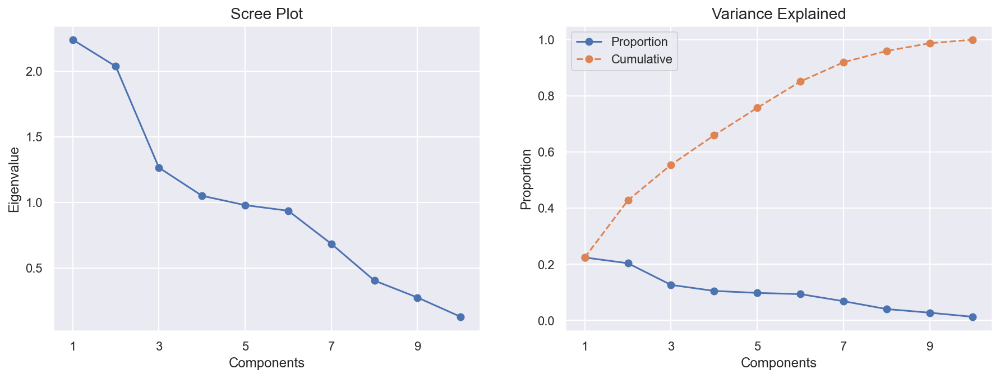

In [150]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [151]:
# Perform PCA again with the number of principal components you want to retain
pca_features60 = list(df_census60.columns)
pca60 = PCA(n_components=6)
pca_feat60 = pca60.fit_transform(df_census60[pca_features60])
pca_feat_names60 = [f"PC{i}" for i in range(pca60.n_components_)]
pca_df60 = pd.DataFrame(pca_feat60, index=df_census60.index, columns=pca_feat_names60)
pca_df60

,PC0,PC1,PC2,PC3,PC4,PC5
0,-1.530630,-0.640773,1.027688,0.089751,-0.277544,0.039982
1,0.753375,-1.171224,-0.438480,1.031443,0.372529,0.398048
2,0.020065,-0.306591,-1.248994,-0.169253,-0.747523,-0.023064
3,-0.734512,1.422977,-3.025724,-1.005163,-1.880290,-0.463243
4,0.770961,-0.470128,-1.392121,-0.236590,-0.707182,-0.020466
...,...,...,...,...,...,...
95406,0.605865,0.725192,-1.335549,0.497793,-0.053822,-0.067179
95407,-0.470406,0.158534,-0.229586,-0.201322,-0.613183,-0.143306
95408,0.836527,-0.504160,0.803732,0.974885,0.633959,0.221073
95409,-0.825805,-0.683284,-0.186308,-0.800932,-1.054458,-0.150008


In [152]:
df_census60_pca = pd.concat([df_census60, pca_df60], axis=1)

In [153]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census60_pca[pca_features60 + pca_feat_names60].corr().loc[pca_features60, pca_feat_names60]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5
TPE1,-0.173358,-0.810510,0.375830,-0.085170,0.040140,0.082301
TPE2,0.241335,0.089329,-0.854684,-0.110014,-0.236695,0.000318
TPE3,0.645785,0.538213,0.301116,-0.090825,-0.081773,-0.065002
TPE5,0.602026,0.322528,0.456770,0.058154,-0.098523,-0.314658
TPE6,0.169578,0.329193,0.158861,-0.253782,-0.013305,0.869015
TPE7,0.020242,0.113922,-0.095315,-0.548089,0.798382,-0.158436
TPE8,-0.155059,0.711839,-0.108599,0.043198,0.065110,-0.072367
TPE9,-0.157148,0.239851,-0.032495,0.781879,0.464028,0.172426
TPE10,0.797245,-0.404684,-0.133710,0.087259,0.121661,0.055143
TPE11,0.811973,-0.358676,-0.170425,0.184195,0.182669,0.090341


In [154]:
#Occupations (Percent)

df_census43= df_census2.loc[:,'OCC1':'OCC13'].copy()

In [155]:
pca = PCA()
pca_feat43 = pca.fit_transform(df_census43)

In [156]:
cov_matrix43 = df_census43.cov()
cov_matrix43

,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13
OCC1,1.000011,0.511716,0.160976,0.247756,-0.085486,-0.025267,-0.100503,-0.361788,-0.239879,-0.501674,-0.450266,-0.426378,-0.414093
OCC2,0.511716,1.000011,0.127278,0.394556,0.001670,-0.046582,-0.092167,-0.413753,-0.299308,-0.463504,-0.479318,-0.441090,-0.423806
OCC3,0.160976,0.127278,1.000011,0.026419,0.107253,-0.048940,-0.001520,-0.130409,-0.194157,-0.105436,-0.169087,-0.157858,-0.154245
OCC4,0.247756,0.394556,0.026419,1.000011,0.008981,-0.048577,-0.057921,-0.240843,-0.257143,-0.307875,-0.362663,-0.296027,-0.287200
OCC5,-0.085486,0.001670,0.107253,0.008981,1.000011,-0.066632,0.094672,-0.095864,-0.238624,-0.015603,-0.150704,-0.059634,-0.079642
OCC6,-0.025267,-0.046582,-0.048940,-0.048577,-0.066632,1.000011,0.011193,0.095077,0.028536,-0.033616,0.008482,0.010717,0.040088
OCC7,-0.100503,-0.092167,-0.001520,-0.057921,0.094672,0.011193,1.000011,0.055715,-0.056114,0.038406,-0.046031,0.035515,0.008709
OCC8,-0.361788,-0.413753,-0.130409,-0.240843,-0.095864,0.095077,0.055715,1.000011,0.083050,0.137180,0.154668,0.197410,0.244213
OCC9,-0.239879,-0.299308,-0.194157,-0.257143,-0.238624,0.028536,-0.056114,0.083050,1.000011,0.088984,0.106952,0.217434,0.142341
OCC10,-0.501674,-0.463504,-0.105436,-0.307875,-0.015603,-0.033616,0.038406,0.137180,0.088984,1.000011,0.349127,0.326914,0.287325


In [157]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix43.index, 
             columns=cov_matrix43.columns)

,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13
OCC1,1.000011,0.511716,0.160976,0.247756,-0.085486,-0.025267,-0.100503,-0.361788,-0.239879,-0.501674,-0.450266,-0.426378,-0.414093
OCC2,0.511716,1.000011,0.127278,0.394556,0.001670,-0.046582,-0.092167,-0.413753,-0.299308,-0.463504,-0.479318,-0.441090,-0.423806
OCC3,0.160976,0.127278,1.000011,0.026419,0.107253,-0.048940,-0.001520,-0.130409,-0.194157,-0.105436,-0.169087,-0.157858,-0.154245
OCC4,0.247756,0.394556,0.026419,1.000011,0.008981,-0.048577,-0.057921,-0.240843,-0.257143,-0.307875,-0.362663,-0.296027,-0.287200
OCC5,-0.085486,0.001670,0.107253,0.008981,1.000011,-0.066632,0.094672,-0.095864,-0.238624,-0.015603,-0.150704,-0.059634,-0.079642
OCC6,-0.025267,-0.046582,-0.048940,-0.048577,-0.066632,1.000011,0.011193,0.095077,0.028536,-0.033616,0.008482,0.010717,0.040088
OCC7,-0.100503,-0.092167,-0.001520,-0.057921,0.094672,0.011193,1.000011,0.055715,-0.056114,0.038406,-0.046031,0.035515,0.008709
OCC8,-0.361788,-0.413753,-0.130409,-0.240843,-0.095864,0.095077,0.055715,1.000011,0.083050,0.137180,0.154668,0.197410,0.244213
OCC9,-0.239879,-0.299308,-0.194157,-0.257143,-0.238624,0.028536,-0.056114,0.083050,1.000011,0.088984,0.106952,0.217434,0.142341
OCC10,-0.501674,-0.463504,-0.105436,-0.307875,-0.015603,-0.033616,0.038406,0.137180,0.088984,1.000011,0.349127,0.326914,0.287325


In [158]:
pd.DataFrame(df_census43.values @ pca.components_.T, 
             index=df_census43.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,1.653494,0.485642,-0.866908,0.978106,0.795541,-0.891686,1.698921,0.871032,0.127802,-0.454413,-1.585547,-0.498109,-0.063992
1,-3.003136,-1.032398,1.111990,0.604280,-0.985289,0.458825,0.479829,0.285343,0.745778,-0.338775,-0.021322,0.248910,-0.050097
2,2.799801,-0.442957,-1.318841,0.356183,-0.263788,0.021387,1.102358,-0.957210,-0.207353,-0.238026,-0.340679,-0.235399,-0.199571
3,1.571141,-5.126122,-0.320932,-1.962925,4.283789,1.230460,-2.637839,-0.288392,-0.637150,-3.321552,0.041822,-0.766892,-0.517099
4,0.884666,0.306120,4.428861,-0.292085,1.120204,0.179026,0.380112,0.057429,-0.880849,1.132133,0.434130,-0.235663,-0.008776
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,0.628919,-1.492651,2.050587,0.208304,-0.497206,1.848374,-0.675674,-0.353151,-0.677459,-0.299536,-0.350260,1.085021,-0.157274
95407,-0.736309,1.301735,0.274575,-0.133389,0.652278,-0.085324,-0.302837,-0.349676,-0.069909,-0.004317,0.387794,0.355322,-0.048969
95408,-2.089333,-0.891845,-0.567097,-1.316089,-0.483172,0.952416,-0.012043,-1.090935,0.862436,0.455140,0.984680,1.481636,-0.116843
95409,0.644893,2.155800,-0.308658,1.423874,1.107407,-0.249715,-0.536570,0.154765,-0.526045,0.113928,-0.570119,1.116483,0.068151


In [159]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.658038,0.000000,0.281384,0.281384
2,1.329186,-2.328852,0.102244,0.383628
3,1.084249,-0.244937,0.083403,0.467031
4,0.971809,-0.112440,0.074754,0.541785
5,0.938296,-0.033512,0.072176,0.613961
6,0.852145,-0.086152,0.065549,0.679510
7,0.834319,-0.017825,0.064178,0.743687
8,0.738105,-0.096215,0.056777,0.800464
9,0.677395,-0.060710,0.052107,0.852571
10,0.655781,-0.021614,0.050444,0.903015


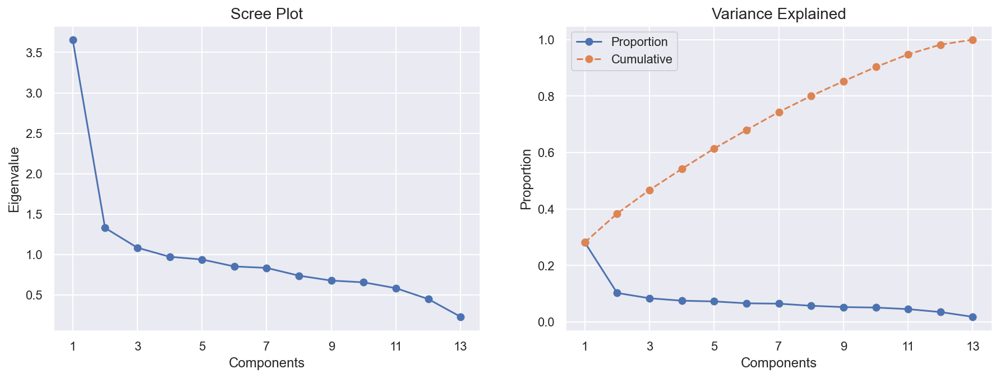

In [160]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [161]:
# Perform PCA again with the number of principal components you want to retain
pca_features43 = list(df_census43.columns)
pca43 = PCA(n_components=8)
pca_feat43 = pca43.fit_transform(df_census43[pca_features43])
pca_feat_names43 = [f"PC{i}" for i in range(pca43.n_components_)]
pca_df43 = pd.DataFrame(pca_feat43, index=df_census43.index, columns=pca_feat_names43)
pca_df43

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,1.653494,0.485642,-0.866908,0.978106,0.795541,-0.891686,1.698921,0.871032
1,-3.003136,-1.032398,1.111990,0.604280,-0.985289,0.458825,0.479829,0.285343
2,2.799801,-0.442957,-1.318841,0.356183,-0.263788,0.021387,1.102358,-0.957210
3,1.571141,-5.126122,-0.320932,-1.962925,4.283789,1.230460,-2.637839,-0.288392
4,0.884666,0.306120,4.428861,-0.292085,1.120204,0.179026,0.380112,0.057429
...,...,...,...,...,...,...,...,...
95406,0.628919,-1.492651,2.050587,0.208304,-0.497206,1.848374,-0.675674,-0.353151
95407,-0.736309,1.301735,0.274575,-0.133389,0.652278,-0.085324,-0.302837,-0.349676
95408,-2.089333,-0.891845,-0.567097,-1.316089,-0.483172,0.952416,-0.012043,-1.090935
95409,0.644893,2.155800,-0.308658,1.423874,1.107407,-0.249715,-0.536570,0.154765


In [162]:
df_census43_pca = pd.concat([df_census43, pca_df43], axis=1)

In [163]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census43_pca[pca_features43 + pca_feat_names43].corr().loc[pca_features43, pca_feat_names43]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7
OCC1,-0.755422,-0.217631,-0.010817,0.110534,0.150247,-0.046674,0.106665,-0.224899
OCC2,-0.801165,-0.101975,-0.052026,-0.047018,-0.080427,0.040821,0.098331,-0.036860
OCC3,-0.288709,0.384149,-0.122249,0.621729,0.439409,-0.155159,0.012871,0.304269
OCC4,-0.577688,-0.036680,0.009332,-0.280330,-0.433200,-0.103643,-0.006604,0.472748
OCC5,-0.115413,0.742316,0.026802,-0.068650,-0.113317,0.385861,-0.427143,-0.242946
OCC6,0.068060,-0.233046,0.693680,0.420272,-0.188312,0.467298,0.127574,0.108626
OCC7,0.075391,0.426069,0.506211,-0.443156,0.360409,-0.104873,0.457373,-0.027397
OCC8,0.489108,-0.018508,0.452970,0.086858,-0.082286,-0.556686,-0.405729,0.022434
OCC9,0.392383,-0.525723,-0.042719,-0.222944,0.500499,0.244765,-0.262767,0.030658
OCC10,0.630767,0.239233,-0.238544,0.004542,-0.089457,0.132366,0.204255,0.284604


In [164]:
#Employment Sector (Percent)
#High density. PCA Not good performed. Not used.
df_census44= df_census2.loc[:,'EIC1':'EIC16'].copy()

In [165]:
pca = PCA()
pca_feat44 = pca.fit_transform(df_census44)

In [166]:
cov_matrix44 = df_census44.cov()
cov_matrix44

,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16
EIC1,1.000011,0.044239,0.065971,-0.055892,-0.039026,-0.078998,-0.094762,-0.124905,-0.246343,-0.159941,-0.031151,-0.095702,-0.124403,-0.016339,-0.192179,-0.043774
EIC2,0.044239,1.000011,0.000825,-0.130594,-0.011852,0.029478,-0.033080,-0.034731,-0.078873,-0.051390,-0.014795,-0.041541,-0.043756,0.026978,-0.042342,0.004000
EIC3,0.065971,0.000825,1.000011,-0.034562,0.008884,0.038049,-0.064987,0.027741,-0.150598,0.007841,0.062791,-0.005207,-0.155058,-0.165243,-0.187946,-0.006854
EIC4,-0.055892,-0.130594,-0.034562,1.000011,-0.038913,-0.105312,-0.028837,-0.137281,-0.292481,-0.120597,-0.193090,-0.200159,-0.155643,-0.200015,-0.284421,-0.240711
EIC5,-0.039026,-0.011852,0.008884,-0.038913,1.000011,0.033072,0.086461,-0.032429,-0.029540,0.037343,-0.015541,-0.053116,-0.068092,-0.129192,-0.105035,0.006550
EIC6,-0.078998,0.029478,0.038049,-0.105312,0.033072,1.000011,0.038336,-0.035043,0.040056,0.022049,-0.054553,-0.008932,-0.030816,-0.022915,-0.000769,0.037000
EIC7,-0.094762,-0.033080,-0.064987,-0.028837,0.086461,0.038336,1.000011,-0.060316,0.152034,0.083598,-0.095685,-0.038678,-0.037754,-0.119987,0.023741,-0.135168
EIC8,-0.124905,-0.034731,0.027741,-0.137281,-0.032429,-0.035043,-0.060316,1.000011,-0.077804,-0.004822,0.091651,0.000168,-0.041102,-0.107486,-0.129672,-0.008087
EIC9,-0.246343,-0.078873,-0.150598,-0.292481,-0.029540,0.040056,0.152034,-0.077804,1.000011,0.129089,-0.019972,0.123462,0.055569,-0.036570,0.308446,-0.054282
EIC10,-0.159941,-0.051390,0.007841,-0.120597,0.037343,0.022049,0.083598,-0.004822,0.129089,1.000011,0.023952,0.068515,-0.061038,-0.127323,0.086178,-0.042552


In [167]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix44.index, 
             columns=cov_matrix44.columns)

,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16
EIC1,1.000011,0.044239,0.065971,-0.055892,-0.039026,-0.078998,-0.094762,-0.124905,-0.246343,-0.159941,-0.031151,-0.095702,-0.124403,-0.016339,-0.192179,-0.043774
EIC2,0.044239,1.000011,0.000825,-0.130594,-0.011852,0.029478,-0.033080,-0.034731,-0.078873,-0.051390,-0.014795,-0.041541,-0.043756,0.026978,-0.042342,0.004000
EIC3,0.065971,0.000825,1.000011,-0.034562,0.008884,0.038049,-0.064987,0.027741,-0.150598,0.007841,0.062791,-0.005207,-0.155058,-0.165243,-0.187946,-0.006854
EIC4,-0.055892,-0.130594,-0.034562,1.000011,-0.038913,-0.105312,-0.028837,-0.137281,-0.292481,-0.120597,-0.193090,-0.200159,-0.155643,-0.200015,-0.284421,-0.240711
EIC5,-0.039026,-0.011852,0.008884,-0.038913,1.000011,0.033072,0.086461,-0.032429,-0.029540,0.037343,-0.015541,-0.053116,-0.068092,-0.129192,-0.105035,0.006550
EIC6,-0.078998,0.029478,0.038049,-0.105312,0.033072,1.000011,0.038336,-0.035043,0.040056,0.022049,-0.054553,-0.008932,-0.030816,-0.022915,-0.000769,0.037000
EIC7,-0.094762,-0.033080,-0.064987,-0.028837,0.086461,0.038336,1.000011,-0.060316,0.152034,0.083598,-0.095685,-0.038678,-0.037754,-0.119987,0.023741,-0.135168
EIC8,-0.124905,-0.034731,0.027741,-0.137281,-0.032429,-0.035043,-0.060316,1.000011,-0.077804,-0.004822,0.091651,0.000168,-0.041102,-0.107486,-0.129672,-0.008087
EIC9,-0.246343,-0.078873,-0.150598,-0.292481,-0.029540,0.040056,0.152034,-0.077804,1.000011,0.129089,-0.019972,0.123462,0.055569,-0.036570,0.308446,-0.054282
EIC10,-0.159941,-0.051390,0.007841,-0.120597,0.037343,0.022049,0.083598,-0.004822,0.129089,1.000011,0.023952,0.068515,-0.061038,-0.127323,0.086178,-0.042552


In [168]:
pd.DataFrame(df_census44.values @ pca.components_.T, 
             index=df_census44.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,-1.279138,-0.370299,-1.873045,-1.835590,0.396521,-0.088492,-0.027582,0.014145,0.461737,0.291966,-0.784314,-1.153370,1.100472,-1.497102,0.454905,-0.248979
1,1.644267,-0.483684,-0.526556,-1.087567,0.653665,0.348861,-0.677282,-0.322908,-0.875269,-0.288115,-0.511797,0.108601,0.369416,-0.468364,-0.455426,0.011432
2,-2.312500,0.357895,-0.505092,-0.194099,0.286598,-1.098019,-0.076244,-0.320195,-0.020901,0.518452,-0.000754,0.579002,-0.105708,0.185780,0.210405,-0.164222
3,-3.154530,1.285597,2.936483,-0.644104,2.951222,1.118658,1.021856,1.427795,-3.411376,-1.210610,1.193791,-2.562893,-2.620001,-0.001517,0.242534,-0.232929
4,1.241016,2.175005,1.526203,-0.538002,0.291719,0.021254,0.774727,-0.451762,0.613844,0.322772,2.981376,1.284819,2.249866,-0.137299,0.463894,0.124259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,-1.828261,-0.980325,0.984400,0.487083,2.264805,-0.373985,0.423438,0.736468,-1.590822,-0.248428,1.061371,-1.429526,-0.286710,-0.883541,0.074255,-0.147915
95407,0.785562,0.745475,1.287576,1.957288,-0.880849,0.347911,0.646018,0.586260,0.732058,0.555916,-0.859351,-0.291795,0.007518,-0.163522,0.010034,0.046295
95408,1.143461,-0.122932,-0.938665,2.832206,1.482427,0.628848,-2.542449,0.403945,0.354079,0.344273,-0.649068,0.077576,-0.082950,0.367338,-0.912847,0.004747
95409,0.635221,2.414875,1.445348,2.423960,-0.880262,-3.364419,-0.245740,-1.852515,1.848548,-1.304901,-0.137989,-1.197758,0.913564,-1.322183,0.579330,-0.164521


In [169]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,1.972115,0.000000,0.123256,0.123256
2,1.516913,-0.455201,0.094806,0.218062
3,1.475930,-0.040983,0.092245,0.310306
4,1.210769,-0.265161,0.075672,0.385979
5,1.119694,-0.091075,0.069980,0.455959
6,0.999130,-0.120564,0.062445,0.518404
7,0.988349,-0.010780,0.061771,0.580175
8,0.928287,-0.060062,0.058017,0.638192
9,0.910001,-0.018287,0.056874,0.695067
10,0.886102,-0.023899,0.055381,0.750447


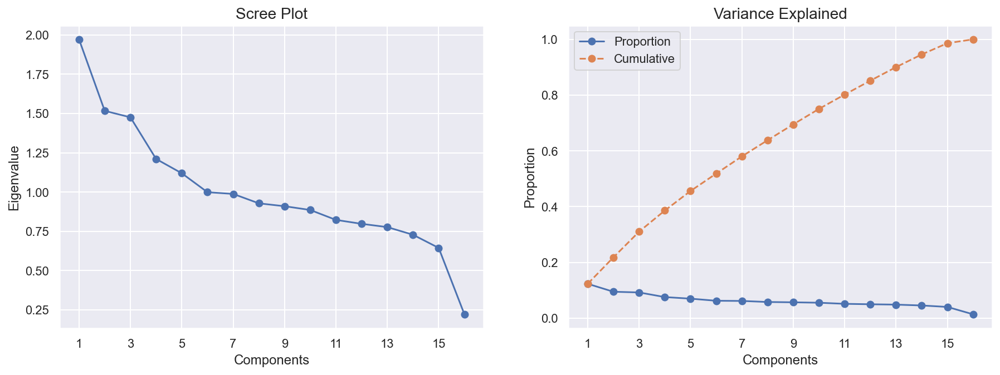

In [170]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [171]:
# Perform PCA again with the number of principal components you want to retain
pca_features44 = list(df_census44.columns)
pca44 = PCA(n_components=11)
pca_feat44 = pca44.fit_transform(df_census44[pca_features44])
pca_feat_names44 = [f"PC{i}" for i in range(pca44.n_components_)]
pca_df44 = pd.DataFrame(pca_feat44, index=df_census44.index, columns=pca_feat_names44)
pca_df44

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-1.279138,-0.370299,-1.873045,-1.835590,0.396521,-0.088492,-0.027582,0.014145,0.461737,0.291966,-0.784314
1,1.644267,-0.483684,-0.526556,-1.087567,0.653665,0.348861,-0.677282,-0.322908,-0.875269,-0.288115,-0.511797
2,-2.312500,0.357895,-0.505092,-0.194099,0.286598,-1.098019,-0.076244,-0.320195,-0.020901,0.518452,-0.000754
3,-3.154530,1.285597,2.936483,-0.644104,2.951222,1.118658,1.021856,1.427795,-3.411376,-1.210610,1.193791
4,1.241016,2.175005,1.526203,-0.538002,0.291719,0.021254,0.774727,-0.451762,0.613844,0.322772,2.981376
...,...,...,...,...,...,...,...,...,...,...,...
95406,-1.828261,-0.980325,0.984400,0.487083,2.264805,-0.373985,0.423438,0.736468,-1.590822,-0.248428,1.061371
95407,0.785562,0.745475,1.287576,1.957288,-0.880849,0.347911,0.646018,0.586260,0.732058,0.555916,-0.859351
95408,1.143461,-0.122932,-0.938665,2.832206,1.482427,0.628848,-2.542449,0.403945,0.354079,0.344273,-0.649068
95409,0.635221,2.414875,1.445348,2.423960,-0.880262,-3.364419,-0.245740,-1.852515,1.848548,-1.304901,-0.137989


In [172]:
df_census44_pca = pd.concat([df_census44, pca_df44], axis=1)

In [173]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census44_pca[pca_features44 + pca_feat_names44].corr().loc[pca_features44, pca_feat_names44]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
EIC1,-0.439340,0.243924,0.190110,0.097342,0.501543,0.107271,0.212969,0.063189,-0.410740,-0.108824,0.190264
EIC2,-0.061614,0.175881,0.185261,0.377625,0.260252,0.509777,-0.431293,0.108235,0.347300,0.313746,-0.189979
EIC3,-0.326498,-0.311415,0.331598,0.196046,0.084187,-0.316063,-0.129098,0.058628,-0.373522,0.241917,-0.121717
EIC4,-0.602090,-0.079191,-0.515502,-0.344728,-0.057976,-0.203918,-0.072527,-0.065735,0.298990,0.059247,-0.134210
EIC5,-0.090196,-0.292570,-0.106653,0.437130,-0.140808,0.267566,0.589183,-0.166175,0.263005,-0.017469,0.174102
EIC6,0.106349,-0.088242,-0.011820,0.545621,-0.078305,-0.348211,-0.397137,-0.518316,0.024244,-0.103565,0.233139
EIC7,0.156870,-0.332978,-0.468160,0.218825,0.121375,0.319462,-0.006385,-0.040418,-0.282276,-0.253154,-0.141617
EIC8,-0.047441,-0.234439,0.338526,-0.160836,-0.597524,0.325240,-0.312195,0.165917,-0.147706,-0.336290,0.097097
EIC9,0.679589,-0.174804,-0.197994,0.020089,0.108323,0.001585,-0.013575,0.009547,-0.149347,-0.081696,-0.228834
EIC10,0.287541,-0.452020,-0.070858,0.093664,0.008502,-0.166980,-0.005223,0.527231,0.104791,0.302822,0.471327


In [174]:
#Education Level (Percent)

df_census45= df_census2.loc[:,['EC1','EC2','EC3','EC5','EC6','EC7','SEC1','SEC2','SEC3','SEC4','SEC5']].copy()

In [175]:
pca = PCA()
pca_feat45 = pca.fit_transform(df_census45)

In [176]:
cov_matrix45 = df_census45.cov()
cov_matrix45

,EC1,EC2,EC3,EC5,EC6,EC7,SEC1,SEC2,SEC3,SEC4,SEC5
EC1,1.000011,-0.415690,-0.455095,0.389011,0.267866,0.758282,0.343946,0.120422,0.250770,-0.012154,0.349438
EC2,-0.415690,1.000011,0.557541,-0.522478,-0.338087,-0.559347,-0.232838,0.077542,-0.203298,0.199683,-0.225270
EC3,-0.455095,0.557541,1.000011,-0.386410,-0.307237,-0.695290,-0.297707,0.037398,-0.223705,0.167169,-0.283196
EC5,0.389011,-0.522478,-0.386410,1.000011,0.311246,0.273059,0.107850,0.130252,0.160712,0.011333,0.198790
EC6,0.267866,-0.338087,-0.307237,0.311246,1.000011,0.200620,0.098485,0.180058,0.171855,0.083422,0.176483
EC7,0.758282,-0.559347,-0.695290,0.273059,0.200620,1.000011,0.380106,-0.031712,0.248994,-0.180748,0.355430
SEC1,0.343946,-0.232838,-0.297707,0.107850,0.098485,0.380106,1.000011,-0.176947,0.239351,-0.037414,0.416062
SEC2,0.120422,0.077542,0.037398,0.130252,0.180058,-0.031712,-0.176947,1.000011,0.248711,0.730358,0.363175
SEC3,0.250770,-0.203298,-0.223705,0.160712,0.171855,0.248994,0.239351,0.248711,1.000011,0.234605,0.006626
SEC4,-0.012154,0.199683,0.167169,0.011333,0.083422,-0.180748,-0.037414,0.730358,0.234605,1.000011,-0.201466


In [177]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix45.index, 
             columns=cov_matrix45.columns)

,EC1,EC2,EC3,EC5,EC6,EC7,SEC1,SEC2,SEC3,SEC4,SEC5
EC1,1.000011,-0.415690,-0.455095,0.389011,0.267866,0.758282,0.343946,0.120422,0.250770,-0.012154,0.349438
EC2,-0.415690,1.000011,0.557541,-0.522478,-0.338087,-0.559347,-0.232838,0.077542,-0.203298,0.199683,-0.225270
EC3,-0.455095,0.557541,1.000011,-0.386410,-0.307237,-0.695290,-0.297707,0.037398,-0.223705,0.167169,-0.283196
EC5,0.389011,-0.522478,-0.386410,1.000011,0.311246,0.273059,0.107850,0.130252,0.160712,0.011333,0.198790
EC6,0.267866,-0.338087,-0.307237,0.311246,1.000011,0.200620,0.098485,0.180058,0.171855,0.083422,0.176483
EC7,0.758282,-0.559347,-0.695290,0.273059,0.200620,1.000011,0.380106,-0.031712,0.248994,-0.180748,0.355430
SEC1,0.343946,-0.232838,-0.297707,0.107850,0.098485,0.380106,1.000011,-0.176947,0.239351,-0.037414,0.416062
SEC2,0.120422,0.077542,0.037398,0.130252,0.180058,-0.031712,-0.176947,1.000011,0.248711,0.730358,0.363175
SEC3,0.250770,-0.203298,-0.223705,0.160712,0.171855,0.248994,0.239351,0.248711,1.000011,0.234605,0.006626
SEC4,-0.012154,0.199683,0.167169,0.011333,0.083422,-0.180748,-0.037414,0.730358,0.234605,1.000011,-0.201466


In [178]:
pd.DataFrame(df_census45.values @ pca.components_.T, 
             index=df_census45.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.682404,0.411411,-0.204844,-0.770984,1.060282,-0.004354,0.098465,-0.106653,1.047570,0.434784,-0.078792
1,3.181805,0.874100,1.751941,-1.928287,0.260514,0.003830,-0.912418,-0.206735,-0.020099,0.095872,0.000781
2,-2.243485,0.083530,0.440587,0.563412,-0.022197,-0.458253,-0.063339,0.580982,0.598391,0.004189,0.083221
3,-1.827100,0.177564,-1.278165,0.469680,0.475820,-0.577313,-0.790066,0.510599,2.377090,-0.083748,0.082597
4,-1.889318,0.365669,1.019517,0.189653,-0.792766,-0.173141,-0.028598,-0.093792,-0.320130,-0.238348,-0.001752
...,...,...,...,...,...,...,...,...,...,...,...
95406,-1.247846,0.239053,-0.291106,0.111797,0.966182,-0.157475,-0.181435,0.928475,-0.681062,-0.362208,0.000694
95407,1.486591,0.676099,-1.068912,0.626292,-0.139300,0.813542,-0.145944,-0.136687,0.322796,0.150690,0.000167
95408,3.342205,2.867540,0.706120,-2.169212,-0.843477,0.004035,-0.455210,-0.266208,-0.506494,-0.433062,0.004168
95409,0.896225,2.123157,-0.098695,-0.972279,0.498826,0.501039,0.672641,-1.348316,0.300145,0.396817,0.004968


In [179]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.726585,0.000000,0.338777,0.338777
2,1.970510,-1.756075,0.179135,0.517912
3,1.172275,-0.798235,0.106569,0.624481
4,1.036621,-0.135654,0.094237,0.718719
5,0.787230,-0.249391,0.071566,0.790284
6,0.678534,-0.108696,0.061684,0.851968
7,0.596603,-0.081931,0.054236,0.906205
8,0.511893,-0.084710,0.046535,0.952740
9,0.389083,-0.122811,0.035371,0.988111
10,0.128078,-0.261004,0.011643,0.999754


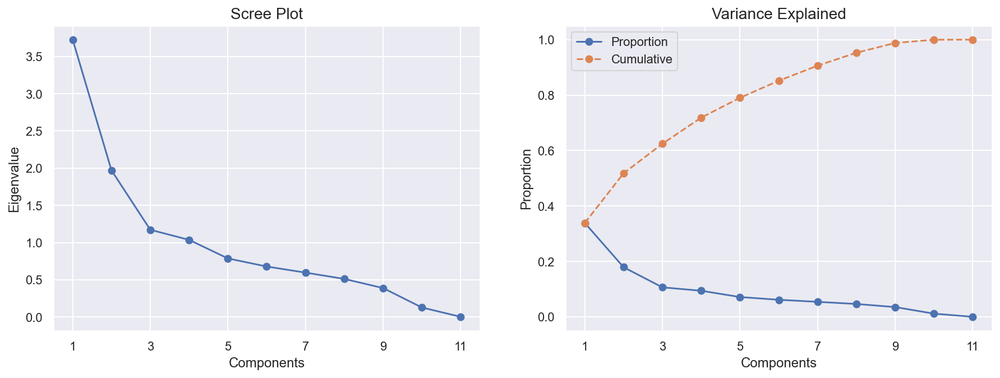

In [180]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [181]:
# Perform PCA again with the number of principal components you want to retain
pca_features45 = list(df_census45.columns)
pca45 = PCA(n_components=5)
pca_feat45 = pca45.fit_transform(df_census45[pca_features45])
pca_feat_names45 = [f"PC{i}" for i in range(pca45.n_components_)]
pca_df45 = pd.DataFrame(pca_feat45, index=df_census45.index, columns=pca_feat_names45)
pca_df45

,PC0,PC1,PC2,PC3,PC4
0,-0.682404,0.411411,-0.204844,-0.770984,1.060282
1,3.181805,0.874100,1.751941,-1.928287,0.260514
2,-2.243485,0.083530,0.440587,0.563412,-0.022197
3,-1.827100,0.177564,-1.278165,0.469680,0.475820
4,-1.889318,0.365669,1.019517,0.189653,-0.792766
...,...,...,...,...,...
95406,-1.247846,0.239053,-0.291106,0.111797,0.966182
95407,1.486591,0.676099,-1.068912,0.626292,-0.139300
95408,3.342205,2.867540,0.706120,-2.169212,-0.843477
95409,0.896225,2.123157,-0.098695,-0.972279,0.498826


In [182]:
df_census45_pca = pd.concat([df_census45, pca_df45], axis=1)

In [183]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census45_pca[pca_features45 + pca_feat_names45].corr().loc[pca_features45, pca_feat_names45]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4
EC1,0.776539,0.073043,0.122255,-0.070279,-0.319546
EC2,-0.742034,0.150373,0.357732,-0.039184,-0.025744
EC3,-0.779021,0.133522,0.128132,0.057528,0.115733
EC5,0.584456,0.138711,-0.444650,0.234817,0.022278
EC6,0.462208,0.258623,-0.359753,0.232105,0.537169
EC7,0.841309,-0.147546,0.118022,-0.150435,-0.340261
SEC1,0.512609,-0.135361,0.553672,-0.271005,0.436011
SEC2,0.085530,0.920771,0.146781,0.263279,-0.159999
SEC3,0.373491,0.404256,-0.020017,-0.648301,0.186985
SEC4,-0.135508,0.883687,-0.007363,-0.194312,-0.065807


In [184]:
#ancestry
#High density. PCA Not good performed. Not used.
df_census61 = df_census2.loc[:,['ANC1','ANC2','ANC3','ANC4','ANC5','ANC6','ANC7','ANC8','ANC9','ANC10','ANC11','ANC12',
                                'ANC13','ANC14','ANC15']]

In [185]:
pca = PCA()
pca_feat61 = pca.fit_transform(df_census61)

In [186]:
cov_matrix61 = df_census61.cov()
cov_matrix61

,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15
ANC1,1.000011,-0.008819,-0.013560,0.034848,-0.014815,-0.003828,-0.039593,-0.029697,0.009563,0.010715,0.000680,-0.030332,-0.002743,0.029936,-0.006117
ANC2,-0.008819,1.000011,0.052031,-0.065211,-0.019899,-0.019478,0.271877,-0.060309,-0.102332,-0.165376,-0.042791,-0.048889,0.285054,-0.011364,-0.032290
ANC3,-0.013560,0.052031,1.000011,-0.002906,-0.014445,0.016769,0.045419,0.058991,-0.025124,-0.006934,-0.022780,-0.022968,0.049030,0.014229,-0.005959
ANC4,0.034848,-0.065211,-0.002906,1.000011,-0.041056,-0.021572,-0.059375,-0.088334,0.182722,0.050010,-0.080695,-0.086551,-0.040766,0.140845,-0.020519
ANC5,-0.014815,-0.019899,-0.014445,-0.041056,1.000011,0.083181,0.009201,0.201560,-0.016021,0.165114,0.006536,0.110790,0.015817,0.020680,0.074731
ANC6,-0.003828,-0.019478,0.016769,-0.021572,0.083181,1.000011,-0.021751,0.179308,-0.033209,0.183825,-0.008553,0.282077,0.031588,0.014531,0.099693
ANC7,-0.039593,0.271877,0.045419,-0.059375,0.009201,-0.021751,1.000011,0.017865,-0.138892,-0.050928,-0.060146,-0.069679,0.134234,-0.090629,-0.017563
ANC8,-0.029697,-0.060309,0.058991,-0.088334,0.201560,0.179308,0.017865,1.000011,-0.062330,0.300579,0.068244,0.175821,0.038773,0.033138,0.147169
ANC9,0.009563,-0.102332,-0.025124,0.182722,-0.016021,-0.033209,-0.138892,-0.062330,1.000011,-0.010392,-0.014954,-0.027447,-0.027497,0.288858,-0.000386
ANC10,0.010715,-0.165376,-0.006934,0.050010,0.165114,0.183825,-0.050928,0.300579,-0.010392,1.000011,-0.042091,0.147740,-0.042645,0.038484,0.183930


In [187]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix61.index, 
             columns=cov_matrix61.columns)

,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15
ANC1,1.000011,-0.008819,-0.013560,0.034848,-0.014815,-0.003828,-0.039593,-0.029697,0.009563,0.010715,0.000680,-0.030332,-0.002743,0.029936,-0.006117
ANC2,-0.008819,1.000011,0.052031,-0.065211,-0.019899,-0.019478,0.271877,-0.060309,-0.102332,-0.165376,-0.042791,-0.048889,0.285054,-0.011364,-0.032290
ANC3,-0.013560,0.052031,1.000011,-0.002906,-0.014445,0.016769,0.045419,0.058991,-0.025124,-0.006934,-0.022780,-0.022968,0.049030,0.014229,-0.005959
ANC4,0.034848,-0.065211,-0.002906,1.000011,-0.041056,-0.021572,-0.059375,-0.088334,0.182722,0.050010,-0.080695,-0.086551,-0.040766,0.140845,-0.020519
ANC5,-0.014815,-0.019899,-0.014445,-0.041056,1.000011,0.083181,0.009201,0.201560,-0.016021,0.165114,0.006536,0.110790,0.015817,0.020680,0.074731
ANC6,-0.003828,-0.019478,0.016769,-0.021572,0.083181,1.000011,-0.021751,0.179308,-0.033209,0.183825,-0.008553,0.282077,0.031588,0.014531,0.099693
ANC7,-0.039593,0.271877,0.045419,-0.059375,0.009201,-0.021751,1.000011,0.017865,-0.138892,-0.050928,-0.060146,-0.069679,0.134234,-0.090629,-0.017563
ANC8,-0.029697,-0.060309,0.058991,-0.088334,0.201560,0.179308,0.017865,1.000011,-0.062330,0.300579,0.068244,0.175821,0.038773,0.033138,0.147169
ANC9,0.009563,-0.102332,-0.025124,0.182722,-0.016021,-0.033209,-0.138892,-0.062330,1.000011,-0.010392,-0.014954,-0.027447,-0.027497,0.288858,-0.000386
ANC10,0.010715,-0.165376,-0.006934,0.050010,0.165114,0.183825,-0.050928,0.300579,-0.010392,1.000011,-0.042091,0.147740,-0.042645,0.038484,0.183930


In [188]:
pd.DataFrame(df_census61.values @ pca.components_.T, 
             index=df_census61.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,-0.650992,1.315377,0.201031,-0.543617,-0.083730,0.218148,0.401717,-0.077610,0.739235,-0.288821,0.419236,-1.011749,0.577932,0.154199,0.635206
1,2.146534,0.058469,-1.209289,0.376108,-1.460302,-0.569944,0.284988,-1.173045,-0.650819,-0.004285,0.479751,0.292686,-0.198116,0.370184,0.121084
2,-1.496565,-1.612131,0.275351,-0.025445,-0.343029,0.232000,0.076528,0.095211,-0.325950,-0.160780,0.215609,-0.188396,-0.068453,0.057119,-1.052611
3,-0.527515,0.855960,-2.034933,2.052081,0.585856,0.084462,0.172487,0.465780,1.680342,0.190755,1.086351,0.152042,0.095551,-0.604899,0.171342
4,-0.342134,0.912233,-2.170278,0.255511,-0.453000,-0.314465,0.198927,0.050190,-1.061272,0.384838,-0.580586,-0.222464,-0.529564,-0.122079,0.238915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,-0.585692,-0.405365,-0.563333,-0.406911,0.051887,-0.237132,0.037233,0.084578,-0.122122,-0.051213,0.003969,-0.479238,-0.019331,0.164560,-1.252824
95407,-0.523017,0.284929,0.086486,0.060675,-0.007900,0.032160,-0.159085,0.027240,-0.302221,0.175343,-0.400242,-0.039860,-0.063673,-0.196196,0.087519
95408,-1.041024,-0.014355,0.224547,-0.365683,-0.191969,0.112035,-0.081578,0.018096,0.023674,-0.116494,0.487151,-1.071559,0.215629,0.146235,-1.202377
95409,-0.762601,0.362760,-0.410141,0.049362,-0.675371,0.719571,-0.000674,0.030307,-0.087412,1.293647,-0.242501,-0.558186,0.065953,0.707459,-0.498585


In [189]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,1.892478,0.000000,0.126164,0.126164
2,1.649518,-0.242960,0.109967,0.236130
3,1.306817,-0.342701,0.087120,0.323251
4,1.072487,-0.234330,0.071498,0.394749
5,1.029021,-0.043467,0.068601,0.463350
6,1.005199,-0.023822,0.067013,0.530362
7,0.990889,-0.014310,0.066059,0.596421
8,0.925299,-0.065589,0.061686,0.658107
9,0.863868,-0.061431,0.057591,0.715697
10,0.808346,-0.055522,0.053889,0.769586


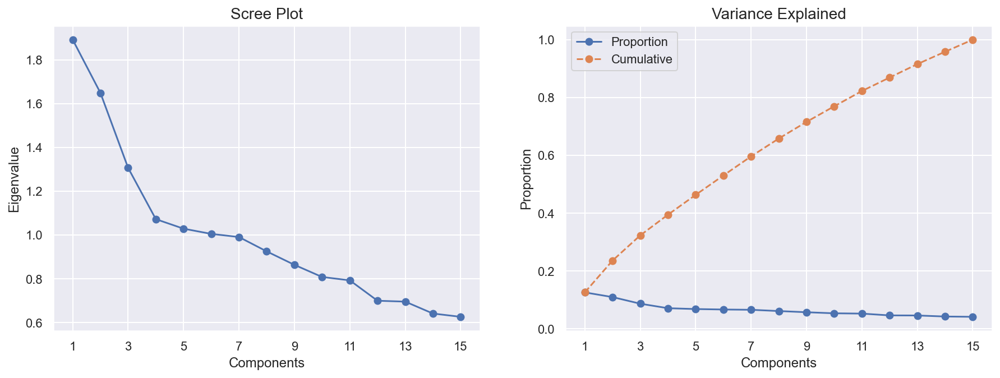

In [190]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [191]:
# Perform PCA again with the number of principal components you want to retain
pca_features61 = list(df_census61.columns)
pca61 = PCA(n_components=11)
pca_feat61 = pca61.fit_transform(df_census61[pca_features61])
pca_feat_names61 = [f"PC{i}" for i in range(pca61.n_components_)]
pca_df61 = pd.DataFrame(pca_feat61, index=df_census61.index, columns=pca_feat_names61)
pca_df61

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.650992,1.315377,0.201031,-0.543617,-0.083730,0.218148,0.401717,-0.077610,0.739235,-0.288821,0.419236
1,2.146534,0.058469,-1.209289,0.376108,-1.460302,-0.569944,0.284988,-1.173045,-0.650819,-0.004285,0.479751
2,-1.496565,-1.612131,0.275351,-0.025445,-0.343029,0.232000,0.076528,0.095211,-0.325950,-0.160780,0.215609
3,-0.527515,0.855960,-2.034933,2.052081,0.585856,0.084462,0.172487,0.465780,1.680342,0.190755,1.086351
4,-0.342134,0.912233,-2.170278,0.255511,-0.453000,-0.314465,0.198927,0.050190,-1.061272,0.384838,-0.580586
...,...,...,...,...,...,...,...,...,...,...,...
95406,-0.585692,-0.405365,-0.563333,-0.406911,0.051887,-0.237132,0.037233,0.084578,-0.122122,-0.051213,0.003969
95407,-0.523017,0.284929,0.086486,0.060675,-0.007900,0.032160,-0.159085,0.027240,-0.302221,0.175343,-0.400242
95408,-1.041024,-0.014355,0.224547,-0.365683,-0.191969,0.112035,-0.081578,0.018096,0.023674,-0.116494,0.487151
95409,-0.762601,0.362760,-0.410141,0.049362,-0.675371,0.719571,-0.000674,0.030307,-0.087412,1.293647,-0.242501


In [192]:
df_census61_pca = pd.concat([df_census61, pca_df61], axis=1)

In [193]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census61_pca[pca_features61 + pca_feat_names61].corr().loc[pca_features61, pca_feat_names61]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
ANC1,-0.031790,0.118279,0.044552,-0.031078,-0.107853,0.867803,-0.420516,-0.100406,-0.100897,-0.098898,0.039760
ANC2,-0.310287,-0.557093,0.430166,0.079307,-0.110693,0.070972,0.069967,0.012916,-0.001065,-0.024551,0.110357
ANC3,-0.008882,-0.149389,0.203799,-0.108270,0.375751,-0.356755,-0.764352,-0.013277,-0.166250,0.067932,0.168236
ANC4,-0.076048,0.454115,0.355841,-0.358473,0.025673,0.028828,0.018165,0.002943,0.536789,0.289249,0.293084
ANC5,0.422247,-0.124565,0.088289,0.023336,0.327683,0.137535,0.333428,-0.506992,-0.276432,0.218518,0.404885
ANC6,0.528155,-0.143750,0.110776,-0.007165,-0.476147,-0.105129,-0.211941,-0.103969,0.267849,-0.098527,0.154092
ANC7,-0.194678,-0.555398,0.218638,-0.227310,0.157956,0.039318,0.169546,-0.005265,0.232012,-0.518678,0.161736
ANC8,0.624233,-0.201940,0.072789,0.082783,0.335063,0.017165,-0.041631,-0.062687,0.121621,-0.119099,-0.308133
ANC9,-0.015159,0.576142,0.441925,0.180936,-0.026718,-0.114156,0.104334,-0.013075,-0.138589,-0.132127,0.013989
ANC10,0.643474,0.057713,0.051902,-0.285359,0.206932,0.123778,0.037464,0.057027,0.206387,0.015277,-0.304465


In [194]:
#Owner occupied houses duration (Percent)

df_census46= df_census2.loc[:,'HC1':'HC10'].copy()

In [195]:
pca = PCA()
pca_feat46 = pca.fit_transform(df_census46)

In [196]:
cov_matrix46 = df_census46.cov()
cov_matrix46

,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10
HC1,1.000011,0.474675,-0.279162,-0.406205,-0.454387,-0.417708,-0.311260,0.375176,-0.162297,-0.257128
HC2,0.474675,1.000011,-0.381984,-0.606876,-0.707142,-0.812108,-0.814813,0.877528,-0.176833,-0.170564
HC3,-0.279162,-0.381984,1.000011,0.708548,0.560511,0.396267,0.310716,-0.300421,0.031484,-0.007496
HC4,-0.406205,-0.606876,0.708548,1.000011,0.883916,0.652170,0.517229,-0.499374,0.105915,0.042887
HC5,-0.454387,-0.707142,0.560511,0.883916,1.000011,0.801699,0.640815,-0.616939,0.140178,0.104203
HC6,-0.417708,-0.812108,0.396267,0.652170,0.801699,1.000011,0.874208,-0.834934,0.217896,0.169692
HC7,-0.311260,-0.814813,0.310716,0.517229,0.640815,0.874208,1.000011,-0.940534,0.230168,0.183377
HC8,0.375176,0.877528,-0.300421,-0.499374,-0.616939,-0.834934,-0.940534,1.000011,-0.221444,-0.179287
HC9,-0.162297,-0.176833,0.031484,0.105915,0.140178,0.217896,0.230168,-0.221444,1.000011,0.580651
HC10,-0.257128,-0.170564,-0.007496,0.042887,0.104203,0.169692,0.183377,-0.179287,0.580651,1.000011


In [197]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix46.index, 
             columns=cov_matrix46.columns)

,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10
HC1,1.000011,0.474675,-0.279162,-0.406205,-0.454387,-0.417708,-0.311260,0.375176,-0.162297,-0.257128
HC2,0.474675,1.000011,-0.381984,-0.606876,-0.707142,-0.812108,-0.814813,0.877528,-0.176833,-0.170564
HC3,-0.279162,-0.381984,1.000011,0.708548,0.560511,0.396267,0.310716,-0.300421,0.031484,-0.007496
HC4,-0.406205,-0.606876,0.708548,1.000011,0.883916,0.652170,0.517229,-0.499374,0.105915,0.042887
HC5,-0.454387,-0.707142,0.560511,0.883916,1.000011,0.801699,0.640815,-0.616939,0.140178,0.104203
HC6,-0.417708,-0.812108,0.396267,0.652170,0.801699,1.000011,0.874208,-0.834934,0.217896,0.169692
HC7,-0.311260,-0.814813,0.310716,0.517229,0.640815,0.874208,1.000011,-0.940534,0.230168,0.183377
HC8,0.375176,0.877528,-0.300421,-0.499374,-0.616939,-0.834934,-0.940534,1.000011,-0.221444,-0.179287
HC9,-0.162297,-0.176833,0.031484,0.105915,0.140178,0.217896,0.230168,-0.221444,1.000011,0.580651
HC10,-0.257128,-0.170564,-0.007496,0.042887,0.104203,0.169692,0.183377,-0.179287,0.580651,1.000011


In [198]:
pd.DataFrame(df_census46.values @ pca.components_.T, 
             index=df_census46.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-1.140544,-0.750519,-0.010726,1.318921,0.352253,0.051121,-0.061363,0.164078,-0.066981,0.069511
1,2.717596,-0.640177,-0.958509,-0.267095,-0.415443,0.555525,0.193219,-0.189838,0.042831,0.084174
2,0.005485,-0.507958,-0.491568,0.363866,0.121722,0.004329,-0.042404,-0.058821,0.006646,-0.016297
3,-1.143273,-0.294230,0.482661,-0.854669,-0.484654,0.180334,0.697583,0.247626,-0.022593,0.143003
4,-3.420940,-0.632821,-0.981379,3.464162,0.521497,0.836971,-0.848584,-0.238384,0.094453,0.026283
...,...,...,...,...,...,...,...,...,...,...
95406,1.836238,-0.779192,-0.859686,0.664296,0.192523,0.118110,0.127949,-0.398997,0.164535,0.046280
95407,1.669764,1.345092,-0.631916,-0.786249,0.226832,0.179920,0.274130,-0.249868,0.089584,-0.020219
95408,3.825651,-1.292973,0.093443,-0.184664,-1.157317,1.652518,-0.372042,0.304200,0.107785,0.011948
95409,-3.744970,-0.279285,1.518692,-0.670344,-0.441275,0.127666,0.543318,0.062510,-0.010258,0.113745


In [199]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,5.345422,0.000000,0.534536,0.534536
2,1.594591,-3.750830,0.159457,0.693994
3,1.116287,-0.478304,0.111627,0.805621
4,0.737036,-0.379251,0.073703,0.879324
5,0.405213,-0.331822,0.040521,0.919845
6,0.382570,-0.022644,0.038257,0.958101
7,0.192562,-0.190008,0.019256,0.977357
8,0.120839,-0.071723,0.012084,0.989441
9,0.065577,-0.055262,0.006558,0.995999
10,0.040013,-0.025564,0.004001,1.000000


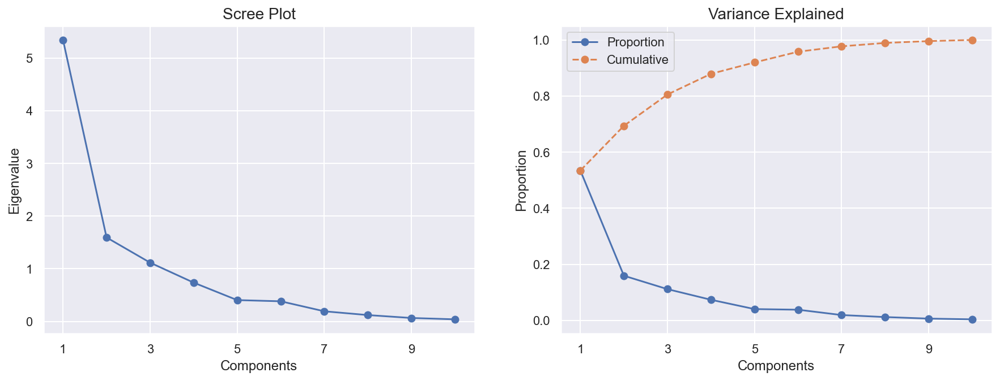

In [200]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [201]:
# Perform PCA again with the number of principal components you want to retain
pca_features46 = list(df_census46.columns)
pca46 = PCA(n_components=3)
pca_feat46 = pca46.fit_transform(df_census46[pca_features46])
pca_feat_names46 = [f"PC{i}" for i in range(pca46.n_components_)]
pca_df46 = pd.DataFrame(pca_feat46, index=df_census46.index, columns=pca_feat_names46)
pca_df46

,PC0,PC1,PC2
0,-1.140544,-0.750519,-0.010726
1,2.717596,-0.640177,-0.958509
2,0.005485,-0.507958,-0.491568
3,-1.143273,-0.294230,0.482661
4,-3.420940,-0.632821,-0.981379
...,...,...,...
95406,1.836238,-0.779192,-0.859686
95407,1.669764,1.345092,-0.631916
95408,3.825651,-1.292973,0.093443
95409,-3.744970,-0.279285,1.518692


In [202]:
df_census46_pca = pd.concat([df_census46, pca_df46], axis=1)

In [203]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census46_pca[pca_features46 + pca_feat_names46].corr().loc[pca_features46, pca_feat_names46]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2
HC1,-0.551888,-0.125749,-0.312944
HC2,-0.897242,-0.009510,0.227587
HC3,0.566060,-0.381579,0.542221
HC4,0.799129,-0.314915,0.383602
HC5,0.876641,-0.205501,0.193918
HC6,0.920801,-0.000423,-0.196795
HC7,0.872025,0.084995,-0.398160
HC8,-0.874095,-0.093443,0.404541
HC9,0.278201,0.778811,0.234070
HC10,0.241803,0.818024,0.268485


In [204]:
#Occupied houses with Utilities (Percent)

df_census47= df_census2.loc[:,'HC11':'HC21'].copy()

In [205]:
pca = PCA()
pca_feat47 = pca.fit_transform(df_census47)

In [206]:
cov_matrix47 = df_census47.cov()
cov_matrix47

,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21
HC11,1.000011,-0.449927,-0.728298,-0.366966,-0.038202,-0.438201,0.438241,-0.397307,0.551625,0.171667,0.216473
HC12,-0.449927,1.000011,-0.048218,0.178781,0.025193,0.387039,-0.521814,0.552163,-0.608065,-0.007920,-0.132595
HC13,-0.728298,-0.048218,1.000011,-0.026510,-0.016430,-0.046205,0.058658,-0.025014,-0.071469,0.106401,0.082832
HC14,-0.366966,0.178781,-0.026510,1.000011,-0.017700,0.234058,-0.366305,0.378197,-0.311727,-0.005224,-0.002761
HC15,-0.038202,0.025193,-0.016430,-0.017700,1.000011,0.063584,-0.026359,0.027888,-0.047337,0.010069,0.019951
HC16,-0.438201,0.387039,-0.046205,0.234058,0.063584,1.000011,-0.498678,0.486770,-0.544147,-0.036761,-0.096156
HC17,0.438241,-0.521814,0.058658,-0.366305,-0.026359,-0.498678,1.000011,-0.943044,0.774023,0.307313,0.298055
HC18,-0.397307,0.552163,-0.025014,0.378197,0.027888,0.486770,-0.943044,1.000011,-0.730043,0.002665,-0.032949
HC19,0.551625,-0.608065,-0.071469,-0.311727,-0.047337,-0.544147,0.774023,-0.730043,1.000011,0.234118,0.267592
HC20,0.171667,-0.007920,0.106401,-0.005224,0.010069,-0.036761,0.307313,0.002665,0.234118,1.000011,0.858121


In [207]:
pd.DataFrame(pca.components_.T @ np.diag(pca.explained_variance_) @ pca.components_, 
             index=cov_matrix47.index, 
             columns=cov_matrix47.columns)

,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21
HC11,1.000011,-0.449927,-0.728298,-0.366966,-0.038202,-0.438201,0.438241,-0.397307,0.551625,0.171667,0.216473
HC12,-0.449927,1.000011,-0.048218,0.178781,0.025193,0.387039,-0.521814,0.552163,-0.608065,-0.007920,-0.132595
HC13,-0.728298,-0.048218,1.000011,-0.026510,-0.016430,-0.046205,0.058658,-0.025014,-0.071469,0.106401,0.082832
HC14,-0.366966,0.178781,-0.026510,1.000011,-0.017700,0.234058,-0.366305,0.378197,-0.311727,-0.005224,-0.002761
HC15,-0.038202,0.025193,-0.016430,-0.017700,1.000011,0.063584,-0.026359,0.027888,-0.047337,0.010069,0.019951
HC16,-0.438201,0.387039,-0.046205,0.234058,0.063584,1.000011,-0.498678,0.486770,-0.544147,-0.036761,-0.096156
HC17,0.438241,-0.521814,0.058658,-0.366305,-0.026359,-0.498678,1.000011,-0.943044,0.774023,0.307313,0.298055
HC18,-0.397307,0.552163,-0.025014,0.378197,0.027888,0.486770,-0.943044,1.000011,-0.730043,0.002665,-0.032949
HC19,0.551625,-0.608065,-0.071469,-0.311727,-0.047337,-0.544147,0.774023,-0.730043,1.000011,0.234118,0.267592
HC20,0.171667,-0.007920,0.106401,-0.005224,0.010069,-0.036761,0.307313,0.002665,0.234118,1.000011,0.858121


In [208]:
pd.DataFrame(df_census47.values @ pca.components_.T, 
             index=df_census47.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.935290,-0.109868,-1.819856,-0.260711,-0.344165,-1.524344,-1.767008,-0.214438,-0.068641,-0.015813,0.037947
1,-1.881848,0.246799,-1.045021,-0.104837,-0.065022,-0.001804,-0.090157,-0.016807,0.156747,-0.001826,0.011944
2,4.296120,-0.932819,-0.256498,-1.146857,3.208201,-0.277989,-0.474452,-0.021739,-0.338201,0.038926,-0.059787
3,3.310555,0.355310,-1.255506,-0.008169,-1.161611,-0.544621,-0.773578,0.368203,-0.018909,0.162231,-0.100454
4,0.572557,-0.607263,1.899932,-0.008618,-0.588652,-0.376472,0.683023,-1.318354,-0.004346,-0.009097,-0.024164
...,...,...,...,...,...,...,...,...,...,...,...
95406,4.278455,-1.326484,0.313939,-0.204678,-1.387007,-2.640679,-0.831563,0.244430,0.222829,-0.032461,0.031728
95407,-1.480683,0.157897,-0.781889,-0.103710,-0.123783,-0.079316,-0.209516,0.164852,0.096504,0.010307,-0.008583
95408,-0.299196,0.068845,-0.986233,-0.157390,-0.284386,-0.747622,-0.746985,-0.113416,-0.070513,0.010848,-0.004601
95409,-1.776383,0.244316,-1.205273,-0.066460,-0.093512,0.349367,-0.141364,0.022513,0.169014,0.014077,0.011058


In [209]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,4.146455,0.000000,0.376946,0.376946
2,1.851965,-2.294489,0.168359,0.545305
3,1.533896,-0.318069,0.139444,0.684748
4,1.011648,-0.522248,0.091967,0.776715
5,0.853813,-0.157835,0.077619,0.854334
6,0.639737,-0.214076,0.058157,0.912491
7,0.570214,-0.069524,0.051837,0.964328
8,0.244290,-0.325923,0.022208,0.986536
9,0.133313,-0.110977,0.012119,0.998656
10,0.008536,-0.124778,0.000776,0.999432


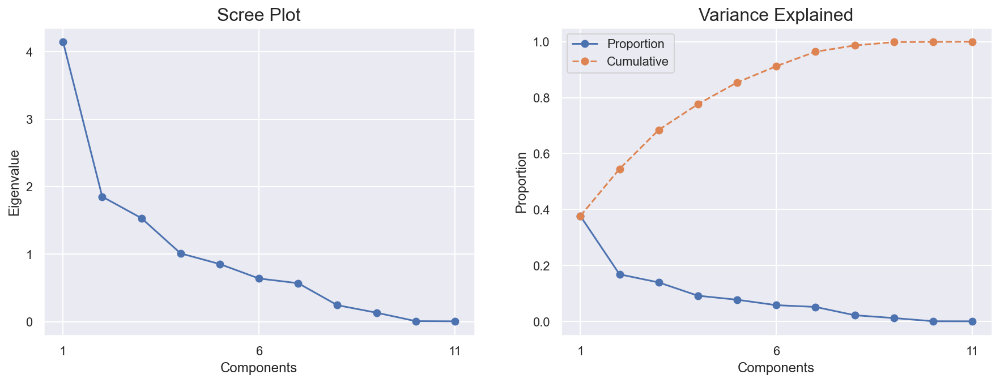

In [210]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=16)
ax2.set_title("Variance Explained", fontsize=16)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 5))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 5))
ax2.set_xticks(range(0, pca.n_components_, 5))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 5))

plt.show()

In [211]:
# Perform PCA again with the number of principal components you want to retain
pca_features47 = list(df_census47.columns)
pca47 = PCA(n_components=5)
pca_feat47 = pca47.fit_transform(df_census47[pca_features47])
pca_feat_names47 = [f"PC{i}" for i in range(pca47.n_components_)]
pca_df47 = pd.DataFrame(pca_feat47, index=df_census47.index, columns=pca_feat_names47)
pca_df47

,PC0,PC1,PC2,PC3,PC4
0,0.935290,-0.109868,-1.819856,-0.260711,-0.344165
1,-1.881848,0.246799,-1.045021,-0.104837,-0.065022
2,4.296120,-0.932819,-0.256498,-1.146857,3.208201
3,3.310555,0.355310,-1.255506,-0.008169,-1.161611
4,0.572557,-0.607263,1.899932,-0.008618,-0.588652
...,...,...,...,...,...
95406,4.278455,-1.326484,0.313939,-0.204678,-1.387007
95407,-1.480683,0.157897,-0.781889,-0.103710,-0.123783
95408,-0.299196,0.068845,-0.986233,-0.157390,-0.284386
95409,-1.776383,0.244316,-1.205273,-0.066460,-0.093512


In [212]:
df_census47_pca = pd.concat([df_census47, pca_df47], axis=1)

In [213]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_census47_pca[pca_features47 + pca_feat_names47].corr().loc[pca_features47, pca_feat_names47]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4
HC11,-0.699069,0.168991,-0.675845,-0.017153,-0.042594
HC12,0.690428,-0.137763,-0.140825,0.041134,-0.356442
HC13,0.115162,-0.318824,0.919598,0.006992,-0.067439
HC14,0.463711,-0.192365,-0.058625,-0.244243,0.798470
HC15,0.049378,-0.048660,-0.039293,0.966386,0.228279
HC16,0.657188,-0.140801,-0.125470,0.104999,-0.091109
HC17,-0.901154,-0.067410,0.218554,0.039667,-0.005529
HC18,0.845784,-0.223247,-0.284489,-0.048851,-0.027661
HC19,-0.887754,0.003252,0.047476,-0.029367,0.118976
HC20,-0.291312,-0.905420,-0.166618,-0.008133,-0.086363


In [214]:
df_census_new = df_census2.copy()

In [215]:
df_census_new.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,LFC1,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,SEC1,SEC2,SEC3,SEC4,SEC5,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2
count,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828
mean,-1.41287e-17,1.39184e-17,-8.77797e-18,-8.62284e-17,5.24677e-15,1.69361e-15,-3.71657e-17,9.63239e-16,4.37881e-16,9.02193e-16,1.00588e-15,2.9737e-15,1.81653e-15,3.58254e-16,-1.04766e-17,-3.72323e-18,-1.85865e-15,2.42621e-16,-9.16244e-17,4.45664e-18,1.30235e-16,2.62699e-16,-3.96424e-16,-4.3168e-17,3.62951e-16,-5.10777e-17,5.09116e-16,-1.71959e-15,2.67521e-16,2.07435e-16,-1.64964e-16,3.88488e-16,-7.35186e-17,2.80159e-17,5.25293e-16,-2.30931e-16,-1.18065e-17,-6.27492e-16,-3.01262e-16,5.4837e-16,-6.12757e-16,-6.46102e-17,4.29847e-17,-1.33352e-16,1.5444e-16,-1.02622e-15,-1.17431e-15,4.87067e-17,-2.92655e-17,8.95239e-18,-1.42221e-16,2.71076e-15,-3.13644e-16,-7.1091e-18,1.33416e-15,1.01496e-15,2.31597e-16,-2.44483e-16,-2.42856e-16,-1.21801e-15,-4.84962e-17,-1.59888e-16,4.3014e-17,1.44376e-16,1.81554e-16,7.87502e-17,8.95923e-17,4.6956e-18,1.44042e-16,1.01234e-16,1.22837e-16,3.93442e-16,-1.36795e-16,-6.90473e-17,1.75541e-16,-9.51747e-16,1.18314e-15,4.58828e-16,1.05219e-16,3.60308e-17,-1.36419e-16,-9.5562e-17,-2.52046e-17,-2.30114e-15,-1.12832e-16,-1.71319e-16,5.19021e-16,3.81479e-17,2.67731e-16,-4.97845e-17,5.27413e-17,-4.83972e-17,1.07272e-17,2.71735e-16,-5.13438e-16,-2.62993e-16,-6.25792e-16,-2.05324e-15,-4.3444e-15,-3.20459e-16,-1.03414e-16,3.76701e-16,-5.65758e-16,1.15228e-16,4.86918e-16,-4.97648e-16,-4.67755e-16,1.45683e-16,2.41474e-16,-5.53708e-16,3.60482e-16,3.30319e-16,1.75589e-17,-8.1201e-16,-2.34435e-17,1.03389e-15,5.59435e-16,-8.69431e-16,-6.79545e-17,-3.56404e-16,-3.51033e-16,4.96831e-17,-5.41843e-17,-9.56681e-16,4.32945e-16,-1.95189e-15,5.05403e-16,2.70662e-16,-4.95412e-16,6.68664e-16,-3.54465e-16,-1.83319e-16,7.2245e-16,-7.37258e-16,-3.59905e-17,-1.31976e-15,-3.3

In [216]:
#Variables to drop according with our analysis of PCA
df_census_new = df_census_new.drop(pca_features17,axis = 1)
df_census_new = df_census_new.drop(pca_features31,axis = 1)
df_census_new = df_census_new.drop(pca_features39,axis = 1)
df_census_new = df_census_new.drop(pca_features41,axis = 1)
df_census_new = df_census_new.drop(pca_features42,axis = 1)
df_census_new = df_census_new.drop(pca_features60,axis = 1)
df_census_new = df_census_new.drop(pca_features43,axis = 1)
df_census_new = df_census_new.drop(pca_features45,axis = 1)
df_census_new = df_census_new.drop(pca_features46,axis = 1)
df_census_new = df_census_new.drop(pca_features47,axis = 1)

In [217]:
df_census_new.shape

(90828, 114)

In [218]:
#PCs to include according with our analysis of PCA
df_census_pca = pd.concat([df_census_new, pca_df47,pca_df17,pca_df31,pca_df39,pca_df41,pca_df42,pca_df60,
                           pca_df43,pca_df45,pca_df46], axis=1)

In [219]:
df_census_pca.shape

(90828, 155)

In [220]:
df_census_final = df_census_pca

In [221]:
df_census_final.shape

(90828, 155)

In [222]:
df_census_final.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,CHIL1,CHIL2,CHIL3,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,IC1,IC2,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,PEC1,PEC2,LFC1,LFC7,LFC8,LFC9,LFC10,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC4,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,MHUC1,MHUC2,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2,PC0,PC1,PC0,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC4,PC5,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2
count,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828
mean,-1.41287e-17,1.39184e-17,-8.77797e-18,-8.62284e-17,5.24677e-15,1.69361e-15,-3.71657e-17,9.63239e-16,4.37881e-16,9.02193e-16,1.00588e-15,2.9737e-15,1.81653e-15,3.58254e-16,-1.04766e-17,-1.85865e-15,2.42621e-16,-9.16244e-17,5.09116e-16,-1.71959e-15,2.67521e-16,2.07435e-16,-1.64964e-16,3.88488e-16,-7.35186e-17,2.80159e-17,5.25293e-16,-2.30931e-16,-1.18065e-17,-6.27492e-16,-3.01262e-16,5.4837e-16,-6.12757e-16,-6.46102e-17,4.29847e-17,-1.33352e-16,1.5444e-16,-1.02622e-15,-3.13644e-16,-7.1091e-18,1.33416e-15,1.01496e-15,2.31597e-16,-2.44483e-16,-2.42856e-16,-1.21801e-15,1.81554e-16,7.87502e-17,8.95923e-17,4.6956e-18,1.44042e-16,3.81479e-17,2.67731e-16,-4.97845e-17,5.27413e-17,-4.83972e-17,1.07272e-17,2.71735e-16,-5.65758e-16,1.15228e-16,-4.67755e-16,1.45683e-16,2.41474e-16,-5.53708e-16,3.60482e-16,4.32945e-16,-1.95189e-15,5.05403e-16,2.70662e-16,-4.95412e-16,6.68664e-16,-3.54465e-16,-1.83319e-16,7.2245e-16,-7.37258e-16,-3.59905e-17,-1.31976e-15,-3.3657e-16,-6.34813e-16,-1.37952e-16,-3.11171e-16,-1.91366e-16,-2.44189e-16,2.41945e-16,-7.72853e-16,1.35418e-16,2.84596e-17,-8.74398e-17,2.21542e-17,4.0557e-16,-6.51039e-16,-1.68555e-16,2.76892e-15,1.4855e-17,-5.80766e-16,1.23548e-15,1.81781e-16,3.71365e-16,7.87068e-16,2.43093e-15,1.17494e-15,9.1685e-17,-8.79593e-17,-7.0003e-16,-3.67202e-15,-1.72704e-16,1.4282e-16,-1.97681e-16,1.086e-15,-2.73285e-16,1.09788e-16,4.04807e-17,-1.21376e-16,-2.95953e-15,-1.51973e-16,5.29711e-17,-9.00128e-18,3.04834e-17,5.4947e-17,1.38026e-17,-5.32303e-17,3.01599e-17,-3.32475e-19,-5.17904e-17,5.10374e-17,6.01927e-17,1.38955e-17,4.53896e-17,5.4026e-17,4.14372e-18,-3.29126e-17,-1.46372e-17,-3.29456e-17,7.51706e-17,-8.66636e-19,1.00403e-17,5.4246e-17,2.56079e-17,7.66182e-17,-1.85795e-17,-1.99073e-17,7.0028e-18,-2.9608e-17,-1.24556e-17,2.4033e-17,2.43538e-17,9.29281e-18,-3.44992e-17,-3.03139e-19,-2.06465e-17,-1.26108e-17,5.10942e-17,-4.38476e-17,-2.91796e-17,-3.7104e-17
std,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,

In [223]:
df2 = df1.loc[:,'STATE':'PEPSTRFL'].copy()
df3 = df1.loc[:,'CARDPROM':'AVGGAPBTWGIFTS'].copy()

In [224]:
df4 = pd.concat([df2, df3], axis=1)

In [225]:
df4.shape

(90828, 85)

In [226]:
non_metric_features= ['MAILCODE', 'NOEXCH','RECINHSE','RECP3','RECPGVG','RECSWEEP','MDMAUD','HOMEOWNR','GENDER','DATASRCE',
'MAJOR', 'COLLECT1','VETERANS','BIBLE','CATLG','HOMEE','PETS','CDPLAY','STEREO','PCOWNERS','PHOTO','CRAFTS','FISHER',
'GARDENIN','BOATS','WALKER','KIDSTUFF','CARDS','PLATES','LIFESRC','PEPSTRFL','HPHONE_D', 'RFA_2R','RFA_2F','RFA_2A','MDMAUD_R',
'MDMAUD_F','MDMAUD_A','GEOCODE2','URBAN']

In [227]:
df4_non_metric = df4[non_metric_features].astype(str)

In [228]:
metric_features = ['CARDPROM', 'NUMPROM','CARDPM12', 'NUMPRM12', 'RAMNTALL', 'NGIFTALL', 'CARDGIFT',
'MINRAMNT','MAXRAMNT', 'LASTGIFT', 'AVGGIFT','PERCGIFTCARDPROMO','GAPLASTGIFT', 'AVGGAPBTWGIFTS','INCOME','WEALTH3', 
'MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV','AGE','SES',
'MBCRAFT','MBGARDEN','MBBOOKS','MBCOLECT','MAGFAML','MAGFEM','MAGMALE','PUBGARDN','PUBCULIN',
'PUBHLTH','PUBDOITY','PUBNEWFN','PUBPHOTO','PUBOPP','HIT','SOLP3','SOLIH','TIME_AS_DONOR']

In [229]:
# Use OneHotEncoder to encode the categorical  features. 
df_enconding = df4_non_metric.copy()
ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(df_enconding[non_metric_features])
ohc_feat_names = ohc.get_feature_names()
df_enconding = pd.DataFrame(ohc_feat, index=df_enconding.index, columns=ohc_feat_names)  
df4 = pd.concat([df4.drop(columns=non_metric_features), df_enconding], axis=1)

In [230]:
df4

,STATE,ZIP,INCOME,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,AGE,TIME_AS_DONOR,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS,x0_1,x1_1,x2_1,x3_1,x4_1,x5_1,x6_C1LM,x6_C1MM,x6_C2CM,x6_C2LM,x6_C2MM,x6_C5CM,x6_C5MM,x6_D1CM,x6_D2CM,x6_D2MM,x6_D5CM,x6_D5MM,x6_D5TM,x6_I1CM,x6_I1LM,x6_I2CM,x6_I2MM,x6_I5MM,x6_L1CM,x6_L1LM,x6_L2CM,x6_L2LM,x6_L2TM,x6_XXXX,x7_U,x8_M,x9_1,x9_2,x9_3,x10_1,x11_1,x12_1,x13_1,x14_1,x15_1,x16_1,x17_1,x18_1,x19_1,x20_1,x21_1,x22_1,x23_1,x24_1,x25_1,x26_1,x27_1,x28_1,x29_1,x29_2,x29_3,x30_1,x31_1,x33_2,x33_3,x33_4,x34_E,x34_F,x34_G,x35_D,x35_I,x35_L,x35_X,x36_2,x36_5,x36_X,x37_L,x37_M,x37_T,x37_X,x38_B,x38_C,x38_D,x39_R,x39_S,x39_T,x39_U
0,IL,61081,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,39,34,18,10,2,1,15,15,27,74,6,14,240.0,31,14,5.0,12.0,10.0,7.741935,60,8,2,5,51.85,18,2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,CA,91326,6,16,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,0,15,55,11,6,2,1,15,15,12,32,6,13,47.0,3,1,10.0,25.0,25.0,15.666667,45,3,1,9,8.33,18,8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,NC,27017,3,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,20,29,33,6,8,1,15,15,26,63,6,14,202.0,27,14,2.0,16.0,5.0,7.481481,49,7,2,1,53.85,18,2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,CA,95953,1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,23,14,31,3,0,3,15,15,27,66,6,14,109.0,16,7,2.0,11.0,10.0,6.812500,69,10,2,5,25.93,18,6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,FL,33176,3,60,1.0,0.0,9.0,0.0,4.0,1.0,0.0,0.0,0.0,4.0,0.0,1.0,0.0,1.0,1,28,9,53,26,3,2,15,12,43,113,10,25,254.0,37,8,3.0,15.0,15.0,6.864865,77,11,2,2,18.60,17,5,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,FL,32776,6,10,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,2,44,26,46,25,9,1,15,15,23,5

In [231]:
#Standardize nummerical variables
sds = StandardScaler()
scaled_feat = sds.fit_transform(df4[metric_features])
df4[metric_features]= scaled_feat
df4.head()

,STATE,ZIP,INCOME,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,AGE,TIME_AS_DONOR,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS,x0_1,x1_1,x2_1,x3_1,x4_1,x5_1,x6_C1LM,x6_C1MM,x6_C2CM,x6_C2LM,x6_C2MM,x6_C5CM,x6_C5MM,x6_D1CM,x6_D2CM,x6_D2MM,x6_D5CM,x6_D5MM,x6_D5TM,x6_I1CM,x6_I1LM,x6_I2CM,x6_I2MM,x6_I5MM,x6_L1CM,x6_L1LM,x6_L2CM,x6_L2LM,x6_L2TM,x6_XXXX,x7_U,x8_M,x9_1,x9_2,x9_3,x10_1,x11_1,x12_1,x13_1,x14_1,x15_1,x16_1,x17_1,x18_1,x19_1,x20_1,x21_1,x22_1,x23_1,x24_1,x25_1,x26_1,x27_1,x28_1,x29_1,x29_2,x29_3,x30_1,x31_1,x33_2,x33_3,x33_4,x34_E,x34_F,x34_G,x35_D,x35_I,x35_L,x35_X,x36_2,x36_5,x36_X,x37_L,x37_M,x37_T,x37_X,x38_B,x38_C,x38_D,x39_R,x39_S,x39_T,x39_U
0,IL,61081,-1.054116,-0.477134,-0.210733,-0.149042,-0.400302,-0.140944,-0.337886,-0.214834,-0.157398,-0.189468,-0.219686,-0.350822,-0.211846,-0.250878,-0.049989,-0.176971,-0.207864,0.743001,0.281481,-0.838640,0.735986,-0.509682,-0.511822,0.034367,0.189134,1.019263,1.229694,0.574606,0.331637,1.311076,2.596994,2.006501,-0.368214,-0.482733,-0.571046,-0.604846,0.229547,0.711640,0.181768,0.004725,1.917707,-0.168674,-0.861022,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,CA,91326,1.248137,1.972893,-0.210733,-0.149042,2.006917,4.853864,1.346776,3.603001,-0.157398,-0.189468,-0.219686,1.860991,-0.211846,4.254204,-0.049989,-0.176971,-0.207864,-1.398477,1.704576,-1.238699,-0.197331,-0.509682,-0.511822,0.034367,0.189134,-0.738952,-0.640536,0.574606,0.087034,-0.519200,-0.771981,-0.892115,0.249773,0.322576,0.602909,0.257951,-0.806304,-0.745891,-1.280294,1.501419,-1.089391,-0.168674,0.890533,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,NC,27017,-0.478552,-0.170881,-0.210733,-0.149042,0.402104,-0.140944,-0.337886,-0.214834,-0.157398,-0.189468,-0.219686,0.755084,-0.211846,-0.250878,-0.049989,-0.176971,-0.207864,-0.952336,-0.057352,0.018630,-0.197331,0.663669,-0.511822,0.034367,0.189134,0.902049,0.739872,0.574606,0.331637,0.950711,2.115712,2.006501,-0.739006,-0.234945,-0.962365,-0.633203,-0.530077,0.420134,0.181768,-1.491969,2.055900,-0.168674,-0.861022,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,CA,95953,-1.629679,-0.170881,-0.210733,-0.149042,-0.400302,-0.140944,-0.337886,-0.214834,-0.157398,-0.189468,-0.219686,-0.350822,-0.211846,-0.250878,-0.049989,1.494439,-0.207864,-0.684651,-1.073849,-0.095673,-0.897318,-0.900799,-0.029444,0.034367,0.189134,1.019263,0.873460,0.574606,0.331637,0.068764,0.792186,0.445708,-0.739006,-0.544680,-0.571046,-0.706038,0.851057,1.294652,0.181768,0.004725,0.126715,-0.168674,0.306682,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,FL,33176,-0.478552,8.710470,2.874941,-0.149042,6.821354,

In [232]:
df4.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,INCOME,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,AGE,TIME_AS_DONOR,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS,x0_1,x1_1,x2_1,x3_1,x4_1,x5_1,x6_C1LM,x6_C1MM,x6_C2CM,x6_C2LM,x6_C2MM,x6_C5CM,x6_C5MM,x6_D1CM,x6_D2CM,x6_D2MM,x6_D5CM,x6_D5MM,x6_D5TM,x6_I1CM,x6_I1LM,x6_I2CM,x6_I2MM,x6_I5MM,x6_L1CM,x6_L1LM,x6_L2CM,x6_L2LM,x6_L2TM,x6_XXXX,x7_U,x8_M,x9_1,x9_2,x9_3,x10_1,x11_1,x12_1,x13_1,x14_1,x15_1,x16_1,x17_1,x18_1,x19_1,x20_1,x21_1,x22_1,x23_1,x24_1,x25_1,x26_1,x27_1,x28_1,x29_1,x29_2,x29_3,x30_1,x31_1,x33_2,x33_3,x33_4,x34_E,x34_F,x34_G,x35_D,x35_I,x35_L,x35_X,x36_2,x36_5,x36_X,x37_L,x37_M,x37_T,x37_X,x38_B,x38_C,x38_D,x39_R,x39_S,x39_T,x39_U
count,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828
mean,6.58077e-16,-1.53493e-16,9.33308e-16,-1.9402e-15,2.42834e-15,-7.48373e-16,1.40635e-15,2.81728e-15,9.55341e-16,8.56976e-16,4.06837e-15,-6.10398e-17,-1.27775e-15,5.28875e-16,4.61093e-15,1.33161e-17,2.72013e-16,2.1676e-16,-2.12732e-16,-3.54514e-17,-1.09306e-16,-6.41709e-16,-1.10107e-15,6.80196e-16,-3.54607e-15,2.17031e-16,-3.11862e-16,6.51771e-16,4.12788e-16,1.33772e-17,-4.88401e-16,-1.90901e-15,1.53143e-15,7.60289e-15,6.6809e-16,1.48499e-16,2.95424e-16,-9.35246e-16,-1.57992e-15,-1.14022e-16,5.85516e-16,-3.12425e-15,-5.27509e-16,0.985654,0.00328093,0.0600476,0.0178139,0.00105694,0.0122099,5.50491e-05,1.10098e-05,0.000176157,3.30295e-05,2.20196e-05,2.20196e-05,1.10098e-05,0.000209187,0.000275246,4.40393e-05,5.50491e-05,5.50491e-05,3.30295e-05,0.000385344,3.30295e-05,7.70687e-05,1.10098e-05,1.10098e-05,0.000374334,7.70687e-05,7.70687e-05,1.10098e-05,1.10098e-05,0.997468,0.217576,0.409896,0.0747237,0.246455,0.456379,0.00253226,0.0551592,0.110517,0.0937486,0.0833994,0.00957854,0.15297,0.130334,0.135663,0.112234,0.0505461,0.0869776,0.0758687,0.142269,0.0217334,0.11121,0.0163276,0.0110649,0.00593429,0.104472,0.211774,0.121229,0.470582,0.501618,0.214526,0.160336,0.12418,0.225966,0.493394,0.203318,0.000671599,0.000517462,0.000550491,0.997468,0.000737658,0.000187167,0.997468,0.000209187,0.000165147,4.40393e-05,0.997468,0.299941,0.165709,0.177765,0.235996,0.234917,0.20944,0.110329
std,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,0.118912,0.0571856,0.237576,0.132275,0.0324936,0.109822,0.00741934,0.0033181,0.0132713,0.00574706,0.00469248,0.00469248,0.0033181,0.0144619,0.0165883,0.0066361,0.00741934,0.00741934,0.00574706,0.0196265,0.00574706,0.00877859,0.0033181,0.0033181,0.0193442,0.00877859,0.00877859,0.0033181,0.0033181,0.0502581,0.4126,0.491817,0.262946,0.430949,0.498096,0.0502581,0.228292,0.313534,0.29148,0.276486,0.0974007,0.359961,0.336673,0.342432,0.315656,0.21907,0.281804,0.264789,0.349328,0.145812,0.314394,0.126733,0.104607,0.0768059,0.305874,0.408568,0.326395,0.499137,0.5,0.410496,0.366919,0.3297

In [233]:
df4.shape

(90828, 128)

In [234]:
#Concat all datas in one data set
df_preprocessed = pd.concat([df4,df_census_final], axis=1)

In [235]:
df_preprocessed

,STATE,ZIP,INCOME,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,AGE,TIME_AS_DONOR,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS,x0_1,x1_1,x2_1,x3_1,x4_1,x5_1,x6_C1LM,x6_C1MM,x6_C2CM,x6_C2LM,x6_C2MM,x6_C5CM,x6_C5MM,x6_D1CM,x6_D2CM,x6_D2MM,x6_D5CM,x6_D5MM,x6_D5TM,x6_I1CM,x6_I1LM,x6_I2CM,x6_I2MM,x6_I5MM,x6_L1CM,x6_L1LM,x6_L2CM,x6_L2LM,x6_L2TM,x6_XXXX,x7_U,x8_M,x9_1,x9_2,x9_3,x10_1,x11_1,x12_1,x13_1,x14_1,x15_1,x16_1,x17_1,x18_1,x19_1,x20_1,x21_1,x22_1,x23_1,x24_1,x25_1,x26_1,x27_1,x28_1,x29_1,x29_2,x29_3,x30_1,x31_1,x33_2,x33_3,x33_4,x34_E,x34_F,x34_G,x35_D,x35_I,x35_L,x35_X,x36_2,x36_5,x36_X,x37_L,x37_M,x37_T,x37_X,x38_B,x38_C,x38_D,x39_R,x39_S,x39_T,x39_U,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,CHIL1,CHIL2,CHIL3,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,IC1,IC2,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,PEC1,PEC2,LFC1,LFC7,LFC8,LFC9,LFC10,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC4,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,MHUC1,MHUC2,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2,PC0,PC1,PC0,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC4,PC5,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2
0,IL,61081,-1.054116,-0.477134,-0.210733,-0.149042,-0.400302,-0.140944,-0.337886,-0.214834,-0.157398,-0.189468,-0.219686,-0.350822,-0.211846,-0.250878,-0.049989,-0.176971,-0.207864,0.743001,0.281481,-0.838640,0.735986,-0.509682,-0.511822,0.034367,0.189134,1.019263,1.229694,0.574606,0.331637,1.311076,2.596994,2.006501,-0.368214,-0.482733,-0.571046,-0.604846,0.229547,0.711640,0.181768,0.004725,1.917707,-0.168674,-0.861022,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-0.405281,-0.421258,-0.426956,-1.216142,0.673063,0.947465,-0.239520,0.365889,0.322129,-0.384589,-0.221893,-0.411578,0.577270,0.545436,0.569035,-1.062946,0.571307,1.040623,0.113936,-0.403934,-0.099573,0.196014,-0.818966,0.956476,-0.433735,0.257327,0.333740,1.075590,-0.724459,0.916342,0.739152,0.468963,-0.327529,0.177727,0.337482,0.133020,-0.091729,-0.345885,-0.517502,0.343344,-0.336858,-0.602201,0.385517,-0.564869,-0.614353,-0.540005,-0.221756,-0.417636,-0.257430,-0.327720,-0.345655,0.094417,-0.327655,0.458027,-0.989361,-0.149904,0.198135,-0.908240,-0.207221,-0.287088,-0.658280,0.220529,0.931958,-1.408380,-0.728836,-0.034460,-0.294583,-0.843468,2.368565,-1.033128,-1.181729,0.861680,-0.643097,-0.189478,0.115458,-1.036285,1.103268,0.214350,-0.768777,-1.273600,-0.391688,-0.204948,0.698936,-0.949144,-0.509885,0.997592,0.232522,0.524555,-0.907640,0.446462,0.116660,-0.362226,-0.639392,1.538947,-0.269146,-0.333637,0.026919,-0.326122,-0.363887,-0.473442,-0.194154,-0.279646,-0.751935,1.005742,-0.200698,-0.370558,0.772071,-0.013751,0.125239,0.322529,0.872997,-0.117888,-0.616811,-0.397579,0.935290,-0.109868,-1.819856,-0.260711,-0.344165,1.077312,0.598209,0.093254,-1.380912,0.477246,1.715556,-1.225201,-1.091617,1.016858,0.084844,-1.223283,-0.835710,1.058767,0.169289,-1.530630,-0.640773,1.027688,0.089751,-0.277544,0.039982,1.653494,0.485642,-0.866908,0.978106,0.795541,-0.891686,1.698921,0.871032,-0.682404,0.411411,-0.204844,-0.770984,1.060282,-1.140544,-0.750519,-0.010726
1,CA,91326,1.248137,1.972893,-0.210733,-0.149042,2.006917,4.85

In [236]:
df_preprocessed.describe().apply(lambda s: s.apply(lambda x:format(x,'g')))

,INCOME,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,AGE,TIME_AS_DONOR,SES,WEALTH3,PERCGIFTCARDPROMO,GAPLASTGIFT,AVGGAPBTWGIFTS,x0_1,x1_1,x2_1,x3_1,x4_1,x5_1,x6_C1LM,x6_C1MM,x6_C2CM,x6_C2LM,x6_C2MM,x6_C5CM,x6_C5MM,x6_D1CM,x6_D2CM,x6_D2MM,x6_D5CM,x6_D5MM,x6_D5TM,x6_I1CM,x6_I1LM,x6_I2CM,x6_I2MM,x6_I5MM,x6_L1CM,x6_L1LM,x6_L2CM,x6_L2LM,x6_L2TM,x6_XXXX,x7_U,x8_M,x9_1,x9_2,x9_3,x10_1,x11_1,x12_1,x13_1,x14_1,x15_1,x16_1,x17_1,x18_1,x19_1,x20_1,x21_1,x22_1,x23_1,x24_1,x25_1,x26_1,x27_1,x28_1,x29_1,x29_2,x29_3,x30_1,x31_1,x33_2,x33_3,x33_4,x34_E,x34_F,x34_G,x35_D,x35_I,x35_L,x35_X,x36_2,x36_5,x36_X,x37_L,x37_M,x37_T,x37_X,x38_B,x38_C,x38_D,x39_R,x39_S,x39_T,x39_U,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH13,AGE901,AGE904,CHIL1,CHIL2,CHIL3,HHAGE1,HHN1,HHN2,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW4,DW7,HU1,HU3,HU5,HHD1,HHD4,HHD5,HHD6,HHD7,HUR1,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,IC1,IC2,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,PEC1,PEC2,LFC1,LFC7,LFC8,LFC9,LFC10,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC4,OEDC5,OEDC6,OEDC7,EC4,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC4,VOC1,VOC2,VOC3,MHUC1,MHUC2,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2,PC0,PC1,PC0,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC0,PC1,PC2,PC3,PC4,PC5,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC0,PC1,PC2,PC3,PC4,PC0,PC1,PC2
count,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828,90828
mean,6.58077e-16,-1.53493e-16,9.33308e-16,-1.9402e-15,2.42834e-15,-7.48373e-16,1.40635e-15,2.81728e-15,9.55341e-16,8.56976e-16,4.06837e-15,-6.10398e-17,-1.27775e-15,5.28875e-16,4.61093e-15,1.33161e-17,2.72013e-16,2.1676e-16,-2.12732e-16,-3.54514e-17,-1.09306e-16,-6.41709e-16,-1.10107e-15,6.80196e-16,-3.54607e-15,2.17031e-16,-3.11862e-16,6.51771e-16,4.12788e-16,1.33772e-17,-4.88401e-16,-1.90901e-15,1.53143e-15,7.60289e-15,6.6809e-16,1.48499e-16,2.95424e-16,-9.35246e-16,-1.57992e-15,-1.14022e-16,5.85516e-16,-3.12425e-15,-5.27509e-16,0.985654,0.00328093,0.0600476,0.0178139,0.00105694,0.0122099,5.50491e-05,1.10098e-

In [237]:
df_preprocessed.shape

(90828, 283)

In [238]:
#Export CSV to use in cluster file
df_preprocessed.to_csv(os.path.join("pvadonors_preprocessed_12.01.csv"), index=False)